In [1]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import datetime

## Fort William Exploratory Data Analysis

In [2]:
fort_william = pd.read_csv('C:/Users/shova/iCloudDrive/Kolkata_data/Work/Semi_processed/Fort_William.csv')    # reads the fort_william file
fort_william.head()

,Date,PM2.5,PM10,NO2,NH3,SO2,CO,Ozone,AT,AQI,AQI_Standard
0,2019-05-31,26.02,53.40,15.46,10.46,1.35,0.23,27.97,30.51,53.40,Satisfactory
1,2019-06-01,35.55,55.18,20.04,2.41,1.49,0.31,22.76,29.78,59.25,Satisfactory
2,2019-06-02,24.13,45.50,15.10,5.05,2.77,0.27,26.67,29.56,45.50,Good
3,2019-06-03,26.11,46.30,20.25,1.90,3.20,0.38,40.34,29.45,46.30,Good
4,2019-06-04,25.90,46.33,15.31,4.26,3.27,0.30,25.76,29.39,46.33,Good


In [3]:
print("Total number of days recorded at the Fort William recording station is -",str(len(fort_william)),
      "\nThe Fort William record starts from ",str(fort_william.iloc[0]['Date']),' ends on ',str(fort_william.iloc[-1]['Date']),'.',
      "\nThe pollutants that we are dealing with, in  the dataset are:-")
for i in fort_william.drop('Date', axis=1).drop('AT', axis=1).drop('AQI', axis=1).drop('AQI_Standard', axis=1).columns.values:
    print(i,end=" ")

Total number of days recorded at the Fort William recording station is - 1311 
The Fort William record starts from  2019-05-31  ends on  2022-12-31 . 
The pollutants that we are dealing with, in  the dataset are:-
PM2.5 PM10 NO2 NH3 SO2 CO Ozone 

In [4]:
# Here we separate the data month wise
fort_william_jan = pd.DataFrame(columns=fort_william.columns)
fort_william_feb = pd.DataFrame(columns=fort_william.columns)
fort_william_mar = pd.DataFrame(columns=fort_william.columns)
fort_william_apr = pd.DataFrame(columns=fort_william.columns)
fort_william_may = pd.DataFrame(columns=fort_william.columns)
fort_william_jun = pd.DataFrame(columns=fort_william.columns)
fort_william_jul = pd.DataFrame(columns=fort_william.columns)
fort_william_aug = pd.DataFrame(columns=fort_william.columns)
fort_william_sep = pd.DataFrame(columns=fort_william.columns)
fort_william_oct = pd.DataFrame(columns=fort_william.columns)
fort_william_nov = pd.DataFrame(columns=fort_william.columns)
fort_william_dec = pd.DataFrame(columns=fort_william.columns)
for d in fort_william["Date"]:
    rows=fort_william.loc[fort_william["Date"] == d]
    if d[5:7] == "01":
        fort_william_jan = pd.concat([fort_william_jan,rows],ignore_index=True)
    elif d[5:7] == "02":
        fort_william_feb = pd.concat([fort_william_feb,rows],ignore_index=True)
    elif d[5:7] == "03":
        fort_william_mar = pd.concat([fort_william_mar,rows],ignore_index=True)
    elif d[5:7] == "04":
        fort_william_apr = pd.concat([fort_william_apr,rows],ignore_index=True)
    elif d[5:7] == "05":
        fort_william_may = pd.concat([fort_william_may,rows],ignore_index=True)
    elif d[5:7] == "06":
        fort_william_jun = pd.concat([fort_william_jun,rows],ignore_index=True)
    elif d[5:7] == "07":
        fort_william_jul = pd.concat([fort_william_jul,rows],ignore_index=True)
    elif d[5:7] == "08":
        fort_william_aug = pd.concat([fort_william_aug,rows],ignore_index=True)
    elif d[5:7] == "09":
        fort_william_sep = pd.concat([fort_william_sep,rows],ignore_index=True)
    elif d[5:7] == "10":
        fort_william_oct = pd.concat([fort_william_oct,rows],ignore_index=True)
    elif d[5:7] == "11":
        fort_william_nov = pd.concat([fort_william_nov,rows],ignore_index=True)
    elif d[5:7] == "12":
        fort_william_dec = pd.concat([fort_william_dec,rows],ignore_index=True)

In [5]:
fort_william['Date'] = pd.to_datetime(fort_william['Date'], format="%Y-%m-%d") # converts the date values to proper date format from string for plotting purposes
# Here we separate the data by year
fort_william_2019 = pd.DataFrame(columns=fort_william.columns)
fort_william_2020 = pd.DataFrame(columns=fort_william.columns)
fort_william_2021 = pd.DataFrame(columns=fort_william.columns)
fort_william_2022 = pd.DataFrame(columns=fort_william.columns)
for d in fort_william["Date"]:
    rows=fort_william.loc[fort_william["Date"] == d]
    if d <= datetime.datetime.strptime("31/12/2019", "%d/%m/%Y"):
        fort_william_2019 = pd.concat([fort_william_2019,rows],ignore_index=True)
    elif d >= datetime.datetime.strptime("01/01/2020", "%d/%m/%Y") and d <= datetime.datetime.strptime("31/12/2020", "%d/%m/%Y"):
        fort_william_2020 = pd.concat([fort_william_2020,rows],ignore_index=True)
    elif d >= datetime.datetime.strptime("01/01/2021", "%d/%m/%Y") and d <= datetime.datetime.strptime("31/12/2021", "%d/%m/%Y"):
        fort_william_2021 = pd.concat([fort_william_2021,rows],ignore_index=True)
    elif d >= datetime.datetime.strptime("01/01/2022", "%d/%m/%Y") and d <= datetime.datetime.strptime("31/12/2022", "%d/%m/%Y"):
        fort_william_2022 = pd.concat([fort_william_2022,rows],ignore_index=True)

In [6]:
##1. PM2.5 Sub-Index calculation
def PM25(x):
    x = float(x)
    
    if x <= 30:
        return round(x * 50 / 30,2)
    elif x <= 60:
        return round(50 + (x - 30) * 50 / 30,2)
    elif x <= 90:
        return round(100 + (x - 60) * 100 / 30,2)
    elif x <= 120:
        return round(200 + (x - 90) * 100 / 30,2)
    elif x <= 250:
        return round(300 + (x - 120) * 100 / 130,2)
    elif x > 250:
        return round(400 + (x - 250) * 100 / 130,2)

##2. PM10 Sub-Index calculation
def PM10(x):
    x = float(x)
    
    if x <= 50:
        return round(x,2)
    elif x <= 100:
        return round(x,2)
    elif x <= 250:
        return round(100 + (x - 100) * 100 / 150,2)
    elif x <= 350:
        return round(200 + (x - 250),2)
    elif x <= 430:
        return round(300 + (x - 350) * 100 / 80,2)
    elif x > 430:
        return round(400 + (x - 430) * 100 / 80,2)

##3. NO2 Sub-Index calculation
def NO2(x):
    x = float(x)
    
    if x <= 40:
        return round(x * 50 / 40,2)
    elif x <= 80:
        return round(50 + (x - 40) * 50 / 40,2)
    elif x <= 180:
        return round(100 + (x - 80) * 100 / 100,2)
    elif x <= 280:
        return round(200 + (x - 180) * 100 / 100,2)
    elif x <= 400:
        return round(300 + (x - 280) * 100 / 120,2)
    elif x > 400:
        return round(400 + (x - 400) * 100 / 120,2)


##4. NH3 Sub-Index calculation
def NH3(x):
    x = float(x)
    
    if x <= 200:
        return round(x * 50 / 200,2)
    elif x <= 400:
        return round(50 + (x - 200) * 50 / 200,2)
    elif x <= 800:
        return round(100 + (x - 400) * 100 / 400,2)
    elif x <= 1200:
        return round(200 + (x - 800) * 100 / 400,2)
    elif x <= 1800:
        return round(300 + (x - 1200) * 100 / 600,2)
    elif x > 1800:
        return round(400 + (x - 1800) * 100 / 600,2)

##5. SO2 Sub-Index calculation
def SO2(x):
    x = float(x)
    
    if x <= 40:
        return round(x * 50 / 40,2)
    elif x <= 80:
        return round(50 + (x - 40) * 50 / 40,2)
    elif x <= 380:
        return round(100 + (x - 80) * 100 / 300,2)
    elif x <= 800:
        return round(200 + (x - 380) * 100 / 420,2)
    elif x <= 1600:
        return round(300 + (x - 800) * 100 / 800,2)
    elif x > 1600:
        return round(400 + (x - 1600) * 100 / 800,2)

##6. CO Sub-Index calculation
def CO(x):
    x = float(x)
    
    if x <= 1:
        return round(x * 50 / 1,2)
    elif x <= 2:
        return round(50 + (x - 1) * 50 / 1,2)
    elif x <= 10:
        return round(100 + (x - 2) * 100 / 8,2)
    elif x <= 17:
        return round(200 + (x - 10) * 100 / 7,2)
    elif x <= 34:
        return round(300 + (x - 17) * 100 / 17,2)
    elif x > 34:
        return round(400 + (x - 34) * 100 / 17,2)

##7. O3 Sub-Index calculation
def Ozone(x):
    x = float(x)
    
    if x <= 50:
        return round(x * 50 / 50,2)
    elif x <= 100:
        return round(50 + (x - 50) * 50 / 50,2)
    elif x <= 168:
        return round(100 + (x - 100) * 100 / 68,2)
    elif x <= 208:
        return round(200 + (x - 168) * 100 / 40,2)
    elif x <= 748:
        return round(300 + (x - 208) * 100 / 539,2)
    elif x > 748:
        return round(400 + (x - 400) * 100 / 539,2)

In [7]:
def aqi(final):
    if final >=0 and final<=50:
        return("Good")
    elif final>50 and final<=100:
        return("Satisfactory")
    elif final>100 and final<= 200:
        return("Moderately Polluted")
    elif final>200 and final<=300:
        return("Poor")
    elif final>300 and final<=400:
        return("Very poor")
    elif final>400:
        return("Severe")

In [8]:
def datetype(data):
    print("The total number of days are: "+str(len(data)))
    #Here we are checking for all the types of dates.
    parameters = ["PM2.5","PM10","NO2","NH3","SO2","CO","Ozone"]
    counts = []
    #PM2.5
    count = 0
    for i in range(len(data)):
        if (PM25(data["PM2.5"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days PM2.5 was responsible for the AQI value was:- "+str(count))
    #PM10
    count = 0
    for i in range(len(data)):
        if (PM10(data["PM10"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days PM10 was responsible for the AQI value was:- "+str(count))
    #NO2
    count = 0
    for i in range(len(data)):
        if (NO2(data["NO2"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days NO2 was responsible for the AQI value was:- "+str(count))
    #NH3
    count = 0
    for i in range(len(data)):
        if (NH3(data["NH3"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days NH3 was responsible for the AQI value was:- "+str(count))
    #SO2
    count = 0
    for i in range(len(data)):
        if (SO2(data["SO2"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days SO2 was responsible for the AQI value was:- "+str(count))
    #CO
    count = 0
    for i in range(len(data)):
        if (CO(data["CO"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days CO was responsible for the AQI value was:- "+str(count))
    #Ozone
    count = 0
    for i in range(len(data)):
        if (Ozone(data["Ozone"][i]) == data["AQI"][i]):
            count = count+1
    counts.append(count)
    print("The number of days Ozone was responsible for the AQI value was:- "+str(count))

    # Creating plot
    fig = plt.figure(figsize =(10, 7))
    plt.pie(counts, labels = parameters,autopct='%1.0f%%')
    plt.show()

### Complete AQI insight

In [9]:
fort_william['Date'] = pd.to_datetime(fort_william['Date'], format="%Y-%m-%d") # converts the date values to proper date format from string for plotting purposes
print ("When we look at the entire "+str(len(fort_william))+" days time period :-"+
       "\nThe highest value of AQI was ",fort_william["AQI"].max(),
       " recorded on", str(fort_william["Date"].loc[fort_william['AQI'].idxmax()])[:10],
       ' and the lowest value was ',fort_william["AQI"].min(), 
       " recorded on",str(fort_william["Date"].loc[fort_william['AQI'].idxmin()])[:10],'.'+
       "\nThe Average AQI value between "+str(fort_william.iloc[0]['Date'])[:10]+" and "+
      str(fort_william.iloc[-1]['Date'])[:10]+" time period is "+str(round(fort_william["AQI"].mean(),2))+
      " which lies in the "+aqi(fort_william["AQI"].mean())+" range."+
      "\nThe Median AQI value is "+str(round(fort_william["AQI"].median(),2))+
      "\nThe AQI value has a standard deviation of "+str(round(fort_william["AQI"].std(),2)))

When we look at the entire 1311 days time period :-
The highest value of AQI was  362.17  recorded on 2020-01-15  and the lowest value was  18.87  recorded on 2022-09-12 .
The Average AQI value between 2019-05-31 and 2022-12-31 time period is 109.81 which lies in the Moderately Polluted range.
The Median AQI value is 66.27
The AQI value has a standard deviation of 89.04


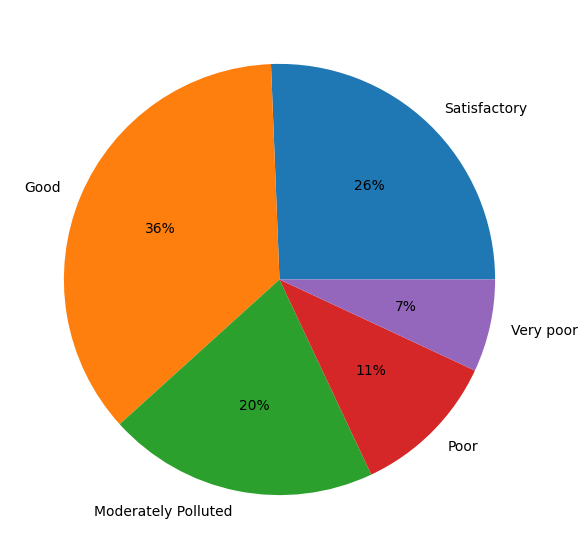

In [10]:
m = fort_william['AQI_Standard'].value_counts()
stand =fort_william['AQI_Standard'].unique()
count = []
for i in stand:
    count.append(m[i])

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

[]

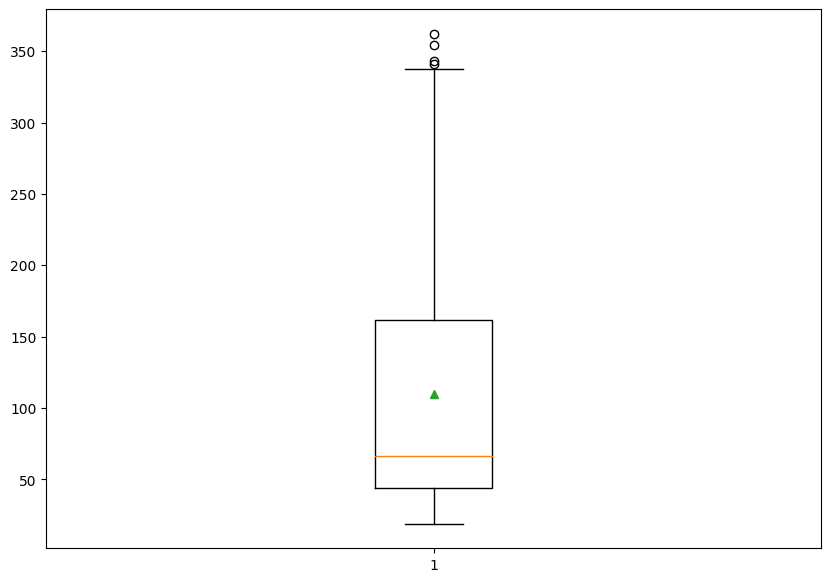

In [11]:
plt.figure(figsize =(10, 7))
plt.boxplot(fort_william["AQI"],showmeans=True)
plt.plot()

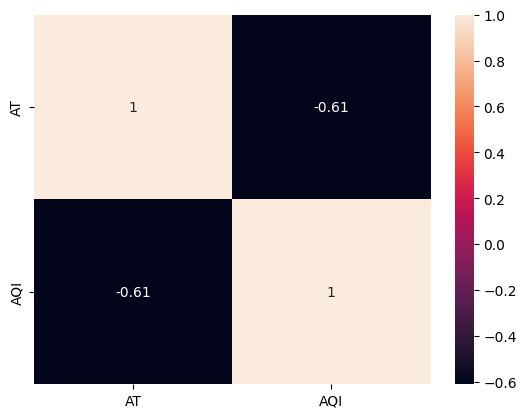

In [12]:
dataplot = sb.heatmap(fort_william[['AT','AQI']].corr(), annot=True)
plt.show()

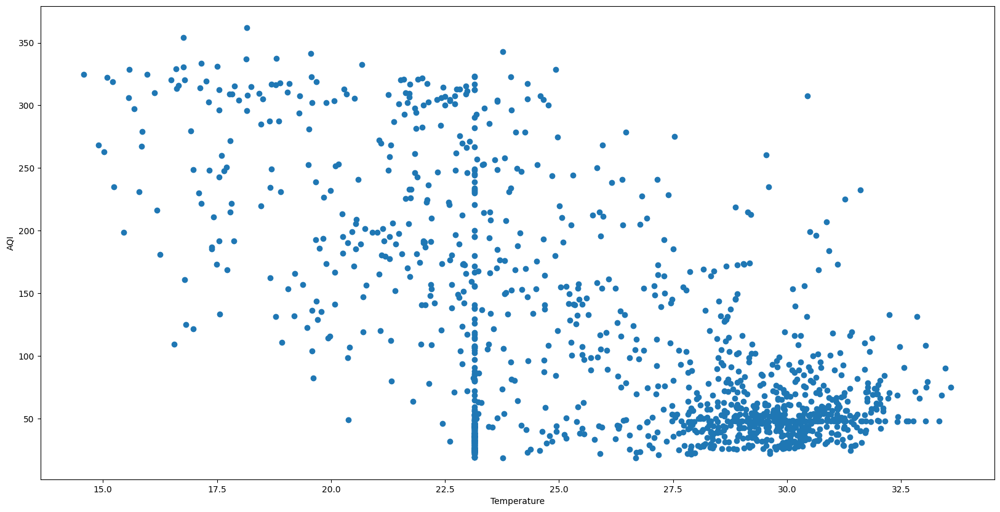

In [13]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william["AT"],y=fort_william['AQI'])
plt.xlabel("Temperature")
plt.ylabel("AQI")
plt.show()

The total number of days are: 1311
The number of days PM2.5 was responsible for the AQI value was:- 535
The number of days PM10 was responsible for the AQI value was:- 606
The number of days NO2 was responsible for the AQI value was:- 6
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 1
The number of days Ozone was responsible for the AQI value was:- 163


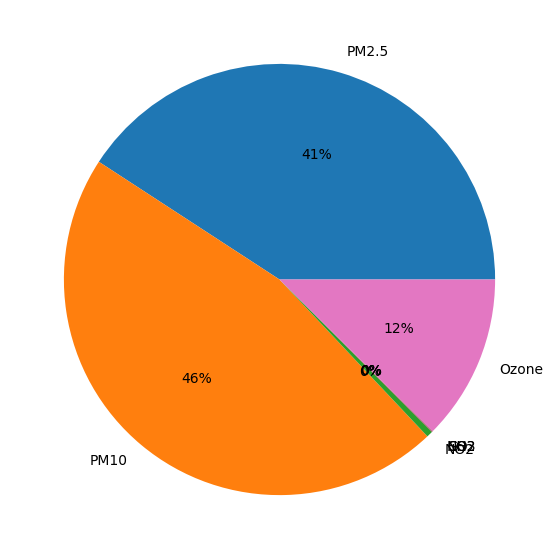

In [11]:
# Here we are finding which pollutant is responsible for how many day's AQI value
datetype(fort_william)

##### From the frequency plot and unique AQI value counts below we can clearly see that only 809 days were having good or satisfactory air quality in a time period of 1311 days which is roughly about 62% of the entire time period.

Good                   473
Satisfactory           336
Moderately Polluted    266
Poor                   145
Very poor               91
Name: AQI_Standard, dtype: int64


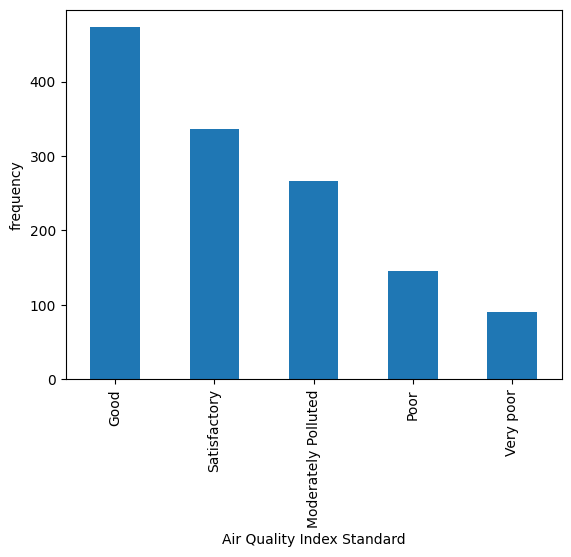

In [12]:
print(fort_william['AQI_Standard'].value_counts())
fort_william['AQI_Standard'].value_counts().plot(kind='bar', xlabel='Air Quality Index Standard', ylabel='frequency')
plt.show()

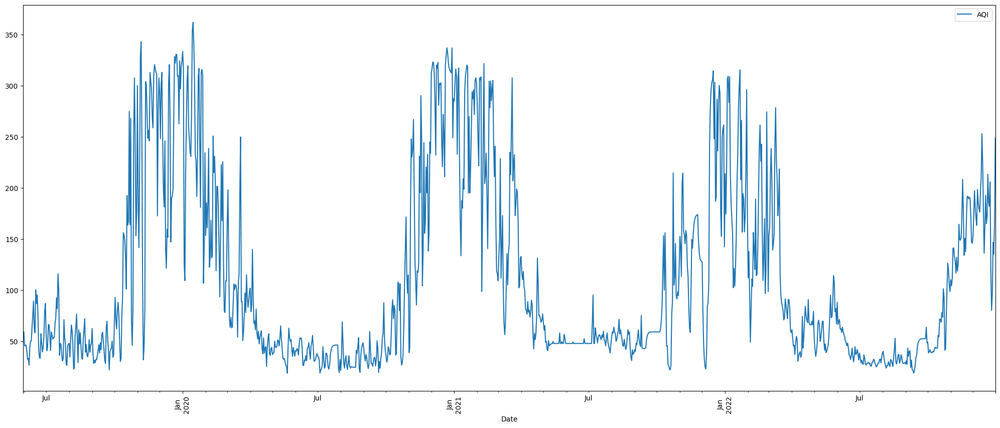

In [13]:
fort_william['Date'] = pd.to_datetime(fort_william['Date'], format="%Y-%m-%d") # converts the date values to proper date format from string for plotting purposes
a = fort_william.plot(x='Date',y='AQI',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

The total number of days are: 473
The number of days PM2.5 was responsible for the AQI value was:- 88
The number of days PM10 was responsible for the AQI value was:- 278
The number of days NO2 was responsible for the AQI value was:- 5
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 1
The number of days Ozone was responsible for the AQI value was:- 101


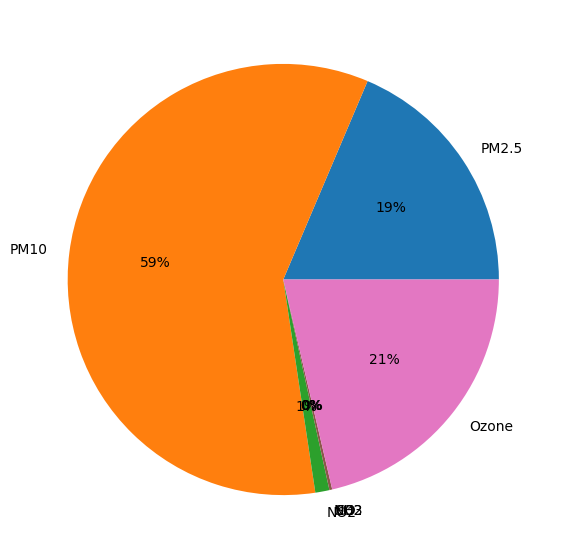

In [14]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william.columns)
rows = pd.concat([fort_william.loc[fort_william["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 336
The number of days PM2.5 was responsible for the AQI value was:- 68
The number of days PM10 was responsible for the AQI value was:- 205
The number of days NO2 was responsible for the AQI value was:- 1
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 62


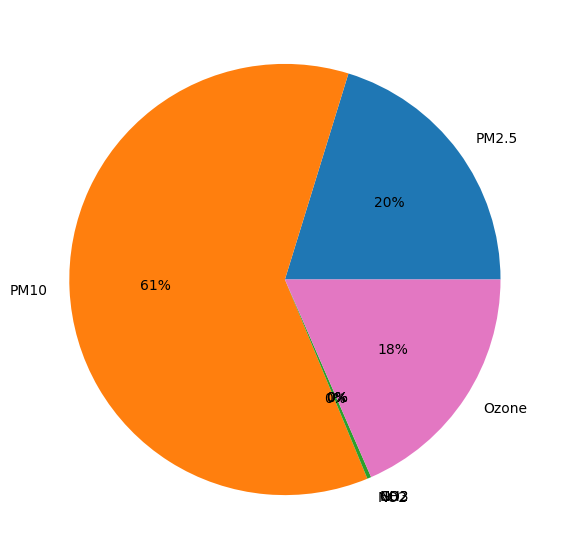

In [15]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william.columns)
rows = pd.concat([fort_william.loc[fort_william["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 266
The number of days PM2.5 was responsible for the AQI value was:- 148
The number of days PM10 was responsible for the AQI value was:- 118
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


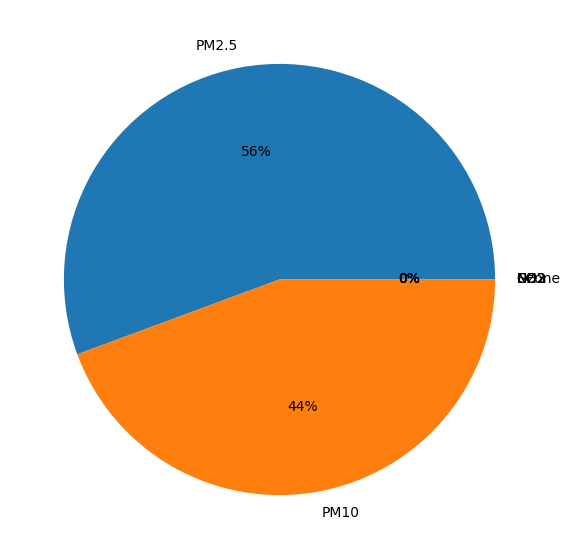

In [16]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william.columns)
rows = pd.concat([fort_william.loc[fort_william["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 145
The number of days PM2.5 was responsible for the AQI value was:- 140
The number of days PM10 was responsible for the AQI value was:- 5
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


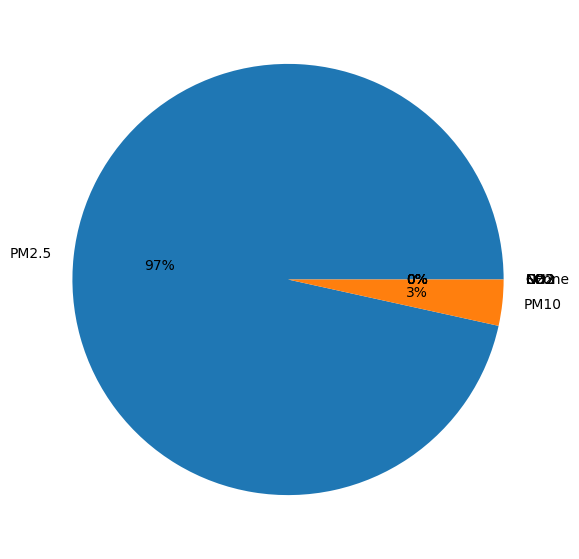

In [17]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william.columns)
rows = pd.concat([fort_william.loc[fort_william["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 91
The number of days PM2.5 was responsible for the AQI value was:- 91
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


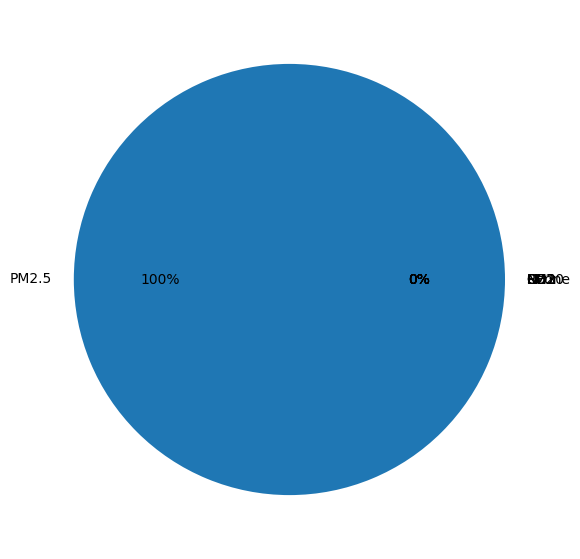

In [18]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william.columns)
rows = pd.concat([fort_william.loc[fort_william["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

### Year-wise AQI data insight

##### AQI 2019

In [19]:
print("######################## fort_william_2019 ########################")
print ("When we look at the entire "+str(len(fort_william_2019))+" days time period :-"+
       "\nThe highest value of AQI was ",fort_william_2019["AQI"].max(),
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019["AQI"] == fort_william_2019["AQI"].max()])[4:15],
       '\nand the lowest value was ',fort_william_2019["AQI"].min(), 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019["AQI"] == fort_william_2019["AQI"].min()])[4:15],
       "\nThe Average AQI value between "+str(fort_william_2019.iloc[0]['Date'])[:10]+" and "+
      str(fort_william_2019.iloc[-1]['Date'])[:10]+" time period is "+str(round(fort_william_2019["AQI"].mean(),2))+
      " which lies in the "+aqi(fort_william_2019["AQI"].mean())+" range"+
      "\nThe AQI value has a standard deviation of "+str(round(fort_william_2019["AQI"].std(),2)))

######################## fort_william_2019 ########################
When we look at the entire 215 days time period :-
The highest value of AQI was  343.02  recorded on   2019-11-0 
and the lowest value was  22.2  recorded on   2019-09-2 
The Average AQI value between 2019-05-31 and 2019-12-31 time period is 119.62 which lies in the Moderately Polluted range
The AQI value has a standard deviation of 102.3


Good                   73
Satisfactory           65
Moderately Polluted    28
Very poor              27
Poor                   22
Name: AQI_Standard, dtype: int64


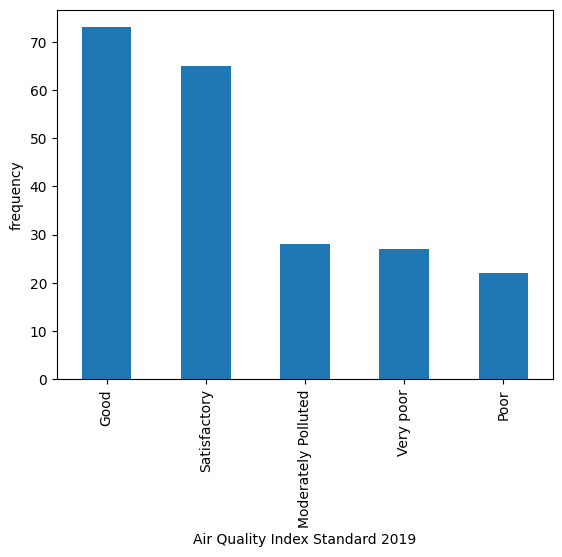

In [20]:
print(fort_william_2019['AQI_Standard'].value_counts())
fort_william_2019['AQI_Standard'].value_counts().plot(kind='bar', xlabel='Air Quality Index Standard 2019', ylabel='frequency')
plt.show()

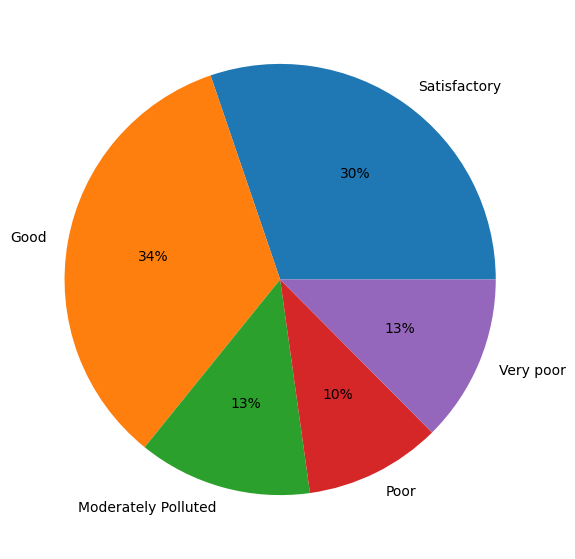

In [21]:
m = fort_william_2019['AQI_Standard'].value_counts()
stand =fort_william_2019['AQI_Standard'].unique()
count = []
for i in stand:
    count.append(m[i])

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

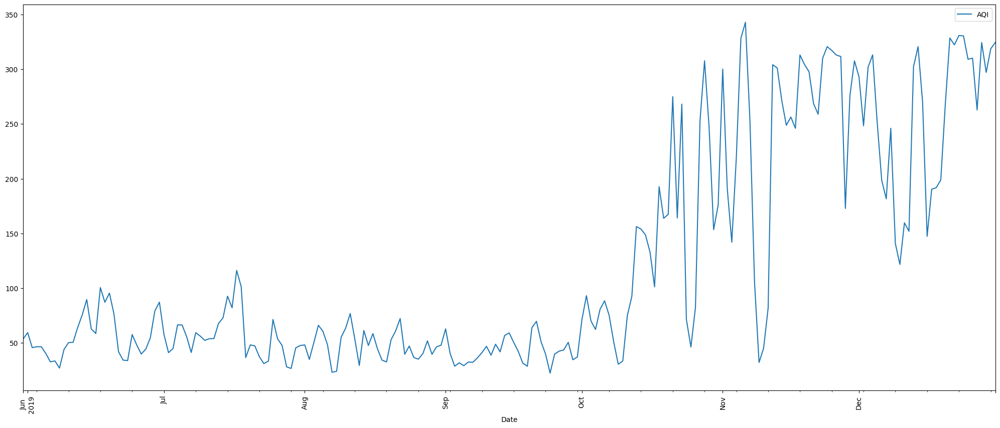

In [22]:
a = fort_william_2019.plot(x='Date',y='AQI',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

The total number of days are: 215
The number of days PM2.5 was responsible for the AQI value was:- 99
The number of days PM10 was responsible for the AQI value was:- 108
The number of days NO2 was responsible for the AQI value was:- 3
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 5


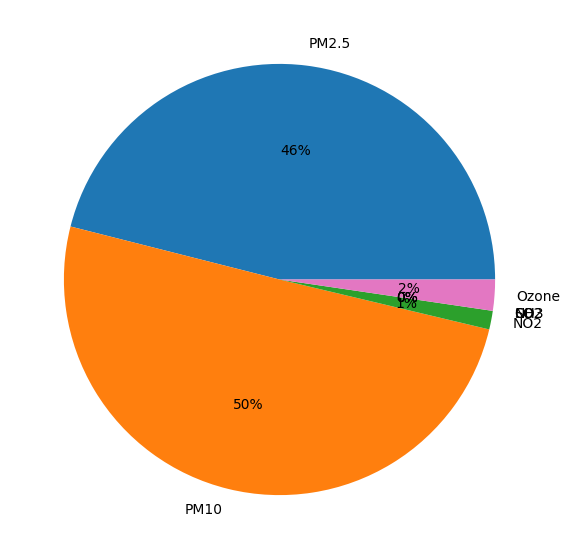

In [23]:
datetype(fort_william_2019)

The total number of days are: 73
The number of days PM2.5 was responsible for the AQI value was:- 13
The number of days PM10 was responsible for the AQI value was:- 53
The number of days NO2 was responsible for the AQI value was:- 3
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 4


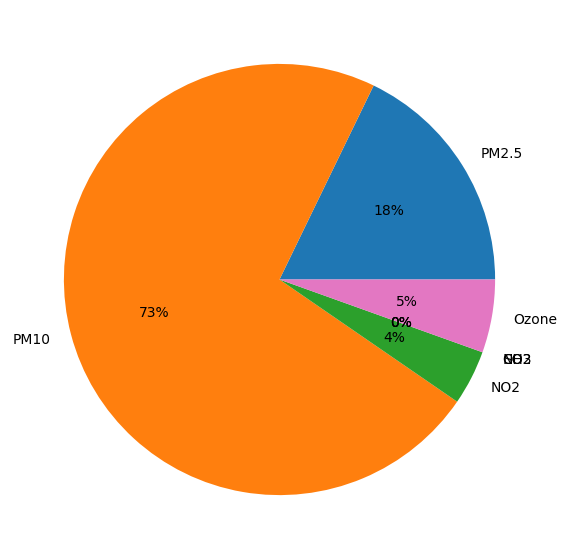

In [24]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_2019.columns)
rows = pd.concat([fort_william_2019.loc[fort_william_2019["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 65
The number of days PM2.5 was responsible for the AQI value was:- 14
The number of days PM10 was responsible for the AQI value was:- 50
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


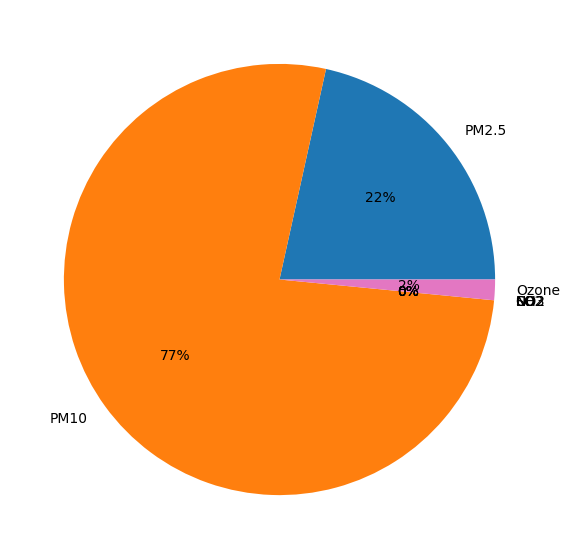

In [25]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_2019.columns)
rows = pd.concat([fort_william_2019.loc[fort_william_2019["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 28
The number of days PM2.5 was responsible for the AQI value was:- 23
The number of days PM10 was responsible for the AQI value was:- 5
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


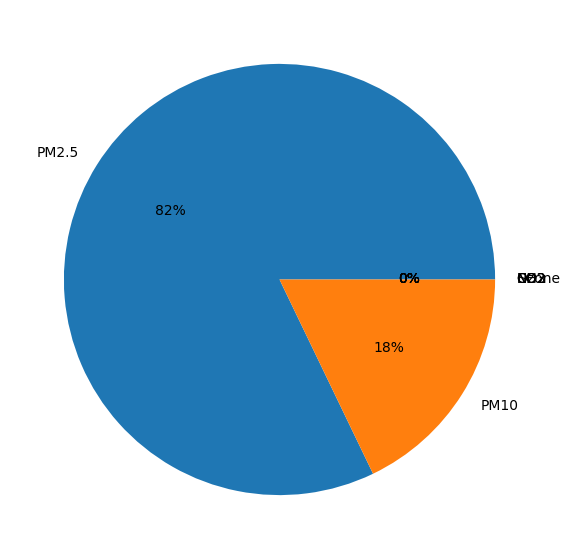

In [26]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_2019.columns)
rows = pd.concat([fort_william_2019.loc[fort_william_2019["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 22
The number of days PM2.5 was responsible for the AQI value was:- 22
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


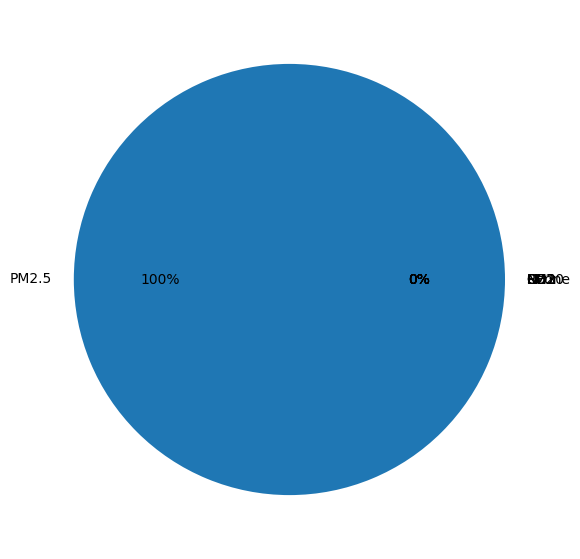

In [27]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_2019.columns)
rows = pd.concat([fort_william_2019.loc[fort_william_2019["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 27
The number of days PM2.5 was responsible for the AQI value was:- 27
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


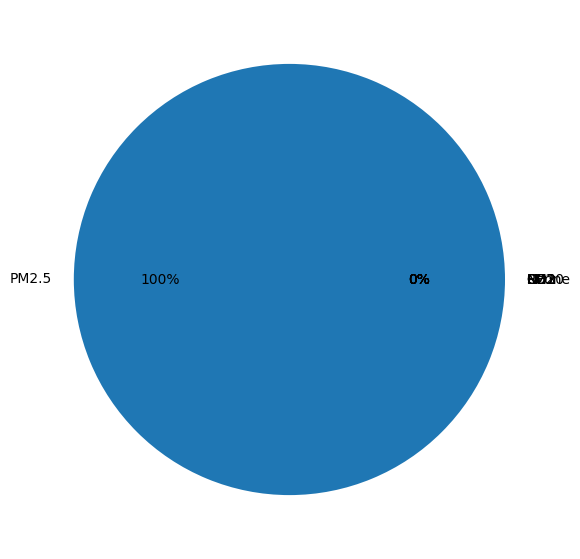

In [28]:
# Here we are finding which pollutant is responsible for how many Very Poor days
rows = pd.DataFrame(columns=fort_william_2019.columns)
rows = pd.concat([fort_william_2019.loc[fort_william_2019["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

#### AQI 2020

In [29]:
print("######################## fort_william_2020 ########################")
print ("When we look at the entire "+str(len(fort_william_2020))+" days time period :-"+
       "\nThe highest value of AQI was ",fort_william_2020["AQI"].max(),
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020["AQI"] == fort_william_2020["AQI"].max()])[4:15],
       ' and the lowest value was ',fort_william_2020["AQI"].min(), 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020["AQI"] == fort_william_2020["AQI"].min()])[4:15],'.'+
       "\nThe Average AQI value between "+str(fort_william_2020.iloc[0]['Date'])[:10]+" and "+
      str(fort_william_2020.iloc[-1]['Date'])[:10]+" time period is "+str(round(fort_william_2020["AQI"].mean(),2))+
      " which lies in the "+aqi(fort_william_2020["AQI"].mean())+" range."+
      "\nThe AQI value has a standard deviation of "+str(round(fort_william_2020["AQI"].std(),2)))

######################## fort_william_2020 ########################
When we look at the entire 366 days time period :-
The highest value of AQI was  362.17  recorded on  2020-01-15  and the lowest value was  18.94  recorded on   2020-05-2 .
The Average AQI value between 2020-01-01 and 2020-12-31 time period is 109.8 which lies in the Moderately Polluted range.
The AQI value has a standard deviation of 97.01


Good                   159
Satisfactory            70
Moderately Polluted     58
Poor                    45
Very poor               34
Name: AQI_Standard, dtype: int64


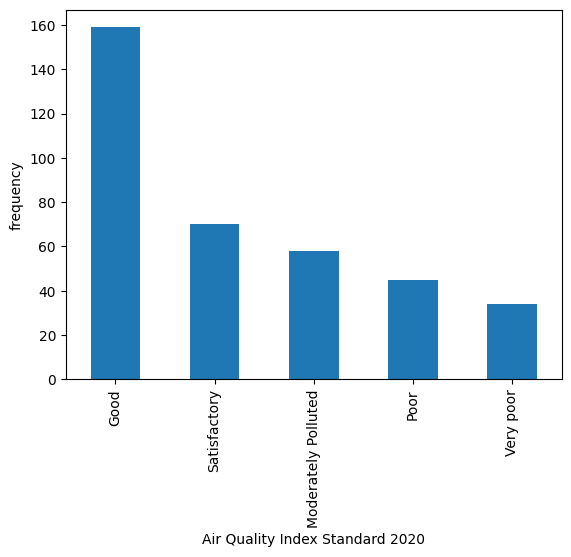

In [30]:
print(fort_william_2020['AQI_Standard'].value_counts())
fort_william_2020['AQI_Standard'].value_counts().plot(kind='bar', xlabel='Air Quality Index Standard 2020', ylabel='frequency')
plt.show()

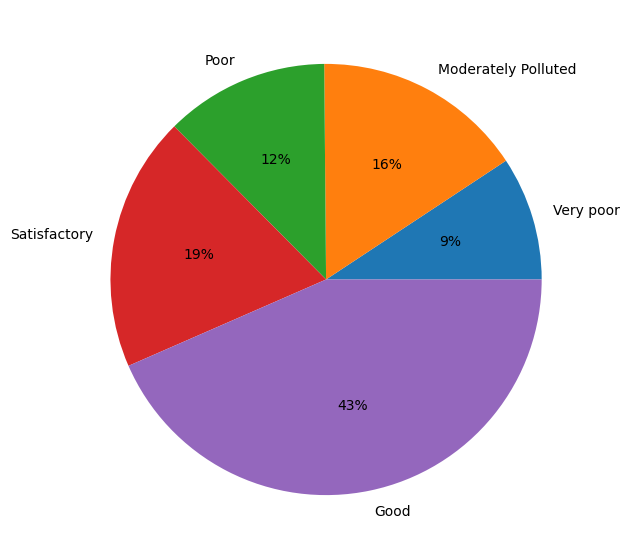

In [31]:
m = fort_william_2020['AQI_Standard'].value_counts()
stand =fort_william_2020['AQI_Standard'].unique()
count = []
for i in stand:
    count.append(m[i])

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

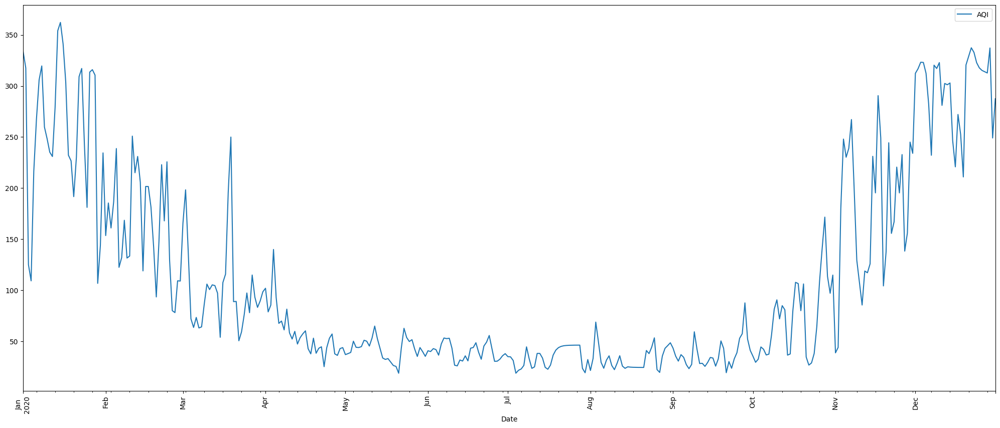

In [32]:
a = fort_william_2020.plot(x='Date',y='AQI',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

The total number of days are: 366
The number of days PM2.5 was responsible for the AQI value was:- 129
The number of days PM10 was responsible for the AQI value was:- 191
The number of days NO2 was responsible for the AQI value was:- 3
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 43


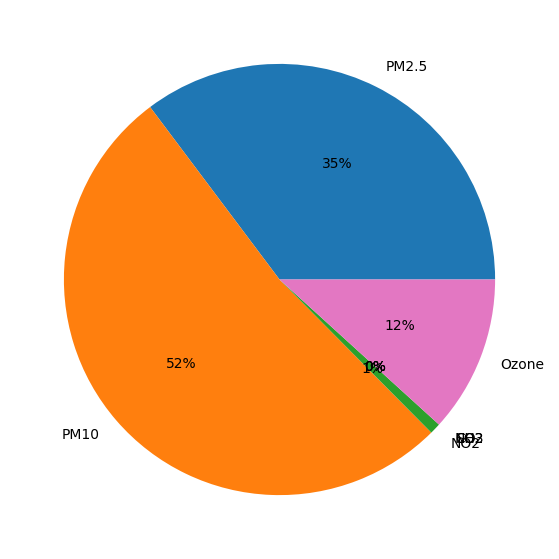

In [33]:
datetype(fort_william_2020)

The total number of days are: 159
The number of days PM2.5 was responsible for the AQI value was:- 1
The number of days PM10 was responsible for the AQI value was:- 124
The number of days NO2 was responsible for the AQI value was:- 2
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 32


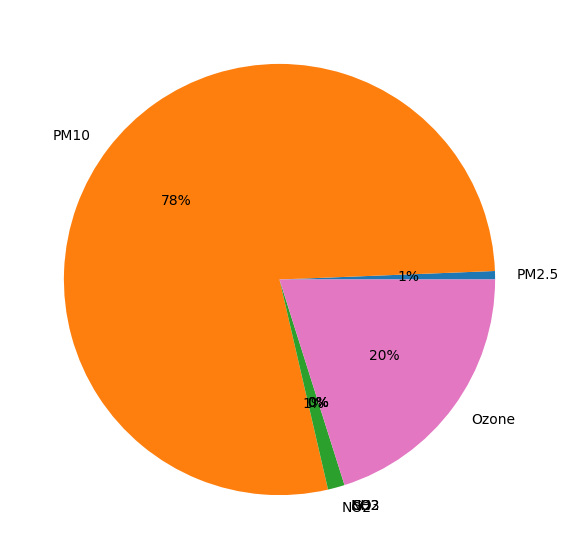

In [34]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_2020.columns)
rows = pd.concat([fort_william_2020.loc[fort_william_2020["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 70
The number of days PM2.5 was responsible for the AQI value was:- 14
The number of days PM10 was responsible for the AQI value was:- 44
The number of days NO2 was responsible for the AQI value was:- 1
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 11


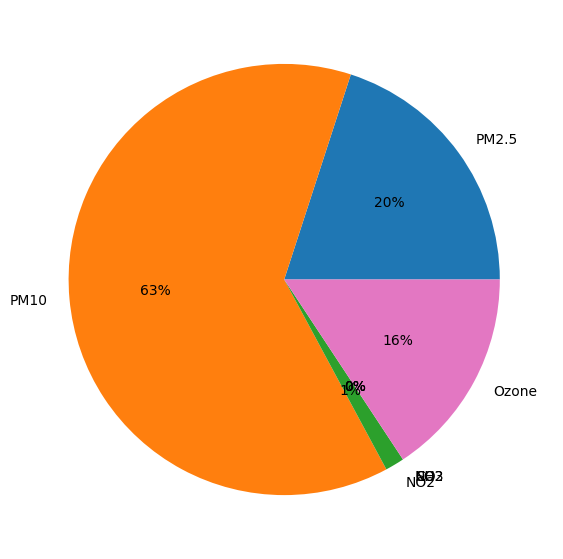

In [35]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_2020.columns)
rows = pd.concat([fort_william_2020.loc[fort_william_2020["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 58
The number of days PM2.5 was responsible for the AQI value was:- 35
The number of days PM10 was responsible for the AQI value was:- 23
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


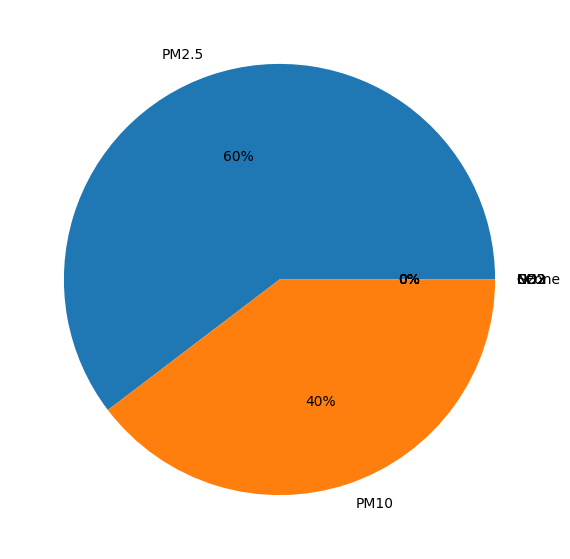

In [36]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_2020.columns)
rows = pd.concat([fort_william_2020.loc[fort_william_2020["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 45
The number of days PM2.5 was responsible for the AQI value was:- 45
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


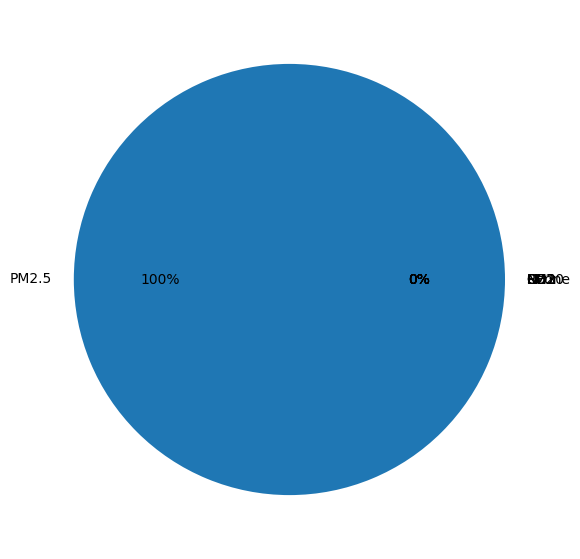

In [37]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_2020.columns)
rows = pd.concat([fort_william_2020.loc[fort_william_2020["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 34
The number of days PM2.5 was responsible for the AQI value was:- 34
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


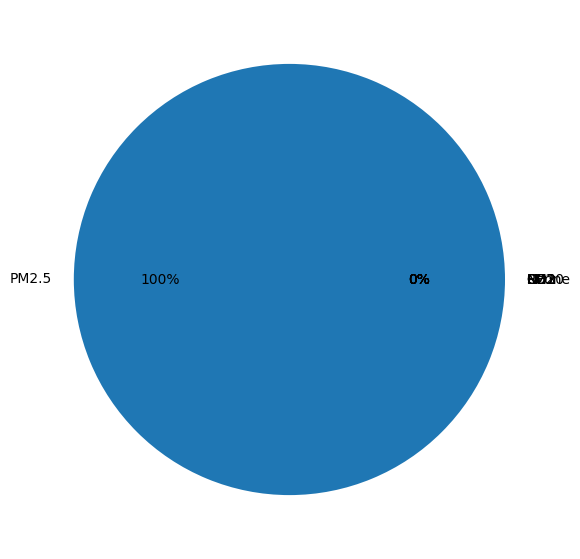

In [38]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_2020.columns)
rows = pd.concat([fort_william_2020.loc[fort_william_2020["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

#### AQI 2021

In [39]:
print("######################## fort_william_2021 ########################")
print ("When we look at the entire "+str(len(fort_william_2021))+" days time period :-"+
       "\nThe highest value of AQI was ",fort_william_2021["AQI"].max(),
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021["AQI"] == fort_william_2021["AQI"].max()])[4:15],
       'and the lowest value was ',fort_william_2021["AQI"].min(), 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021["AQI"] == fort_william_2021["AQI"].min()])[4:15],'.'+
       "\nThe Average AQI value between "+str(fort_william_2021.iloc[0]['Date'])[:10]+" and "+
      str(fort_william_2021.iloc[-1]['Date'])[:10]+" time period is "+str(round(fort_william_2021["AQI"].mean(),2))+
      " which lies in the "+aqi(fort_william_2021["AQI"].mean())+" range."+
      "\nThe AQI value has a standard deviation of "+str(round(fort_william_2021["AQI"].std(),2)))

######################## fort_william_2021 ########################
When we look at the entire 365 days time period :-
The highest value of AQI was  321.87  recorded on  2021-02-10 and the lowest value was  22.28  recorded on   2021-10-1 .
The Average AQI value between 2021-01-01 and 2021-12-31 time period is 117.42 which lies in the Moderately Polluted range.
The AQI value has a standard deviation of 87.33


Satisfactory           109
Good                   104
Moderately Polluted     80
Poor                    47
Very poor               25
Name: AQI_Standard, dtype: int64


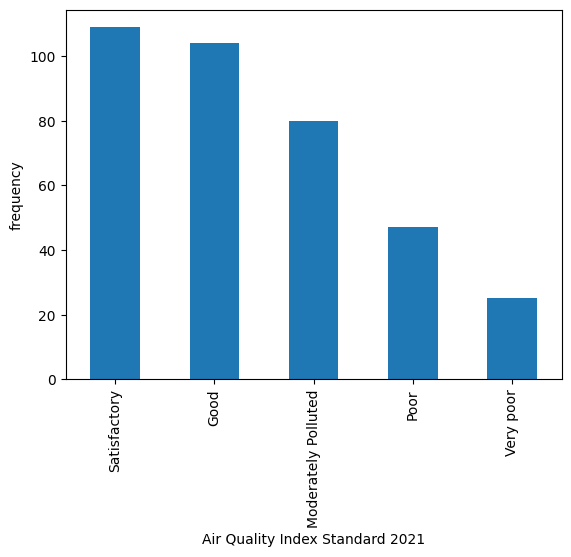

In [40]:
print(fort_william_2021['AQI_Standard'].value_counts())
fort_william_2021['AQI_Standard'].value_counts().plot(kind='bar', xlabel='Air Quality Index Standard 2021', ylabel='frequency')
plt.show()

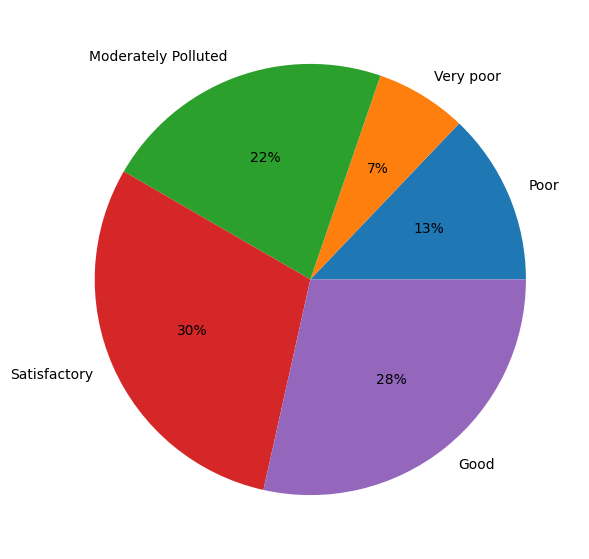

In [41]:
m = fort_william_2021['AQI_Standard'].value_counts()
stand =fort_william_2021['AQI_Standard'].unique()
count = []
for i in stand:
    count.append(m[i])

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

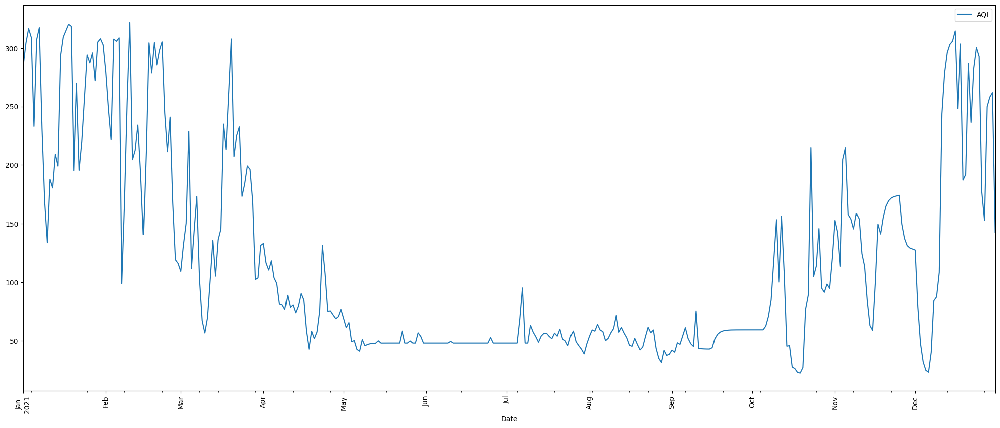

In [42]:
a = fort_william_2021.plot(x='Date',y='AQI',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

The total number of days are: 365
The number of days PM2.5 was responsible for the AQI value was:- 214
The number of days PM10 was responsible for the AQI value was:- 100
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 1
The number of days Ozone was responsible for the AQI value was:- 50


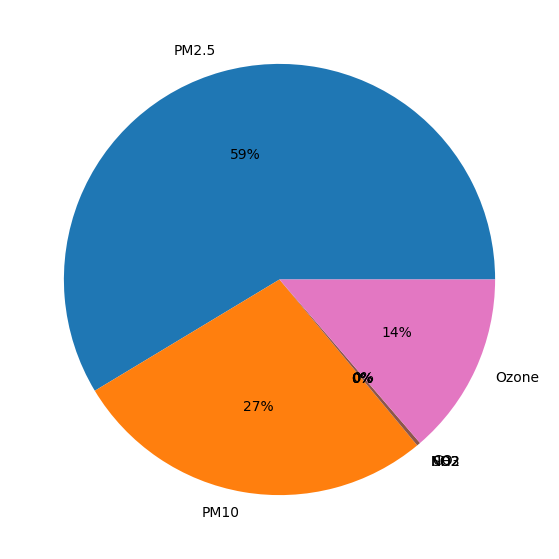

In [43]:
datetype(fort_william_2021)

The total number of days are: 104
The number of days PM2.5 was responsible for the AQI value was:- 57
The number of days PM10 was responsible for the AQI value was:- 23
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 1
The number of days Ozone was responsible for the AQI value was:- 23


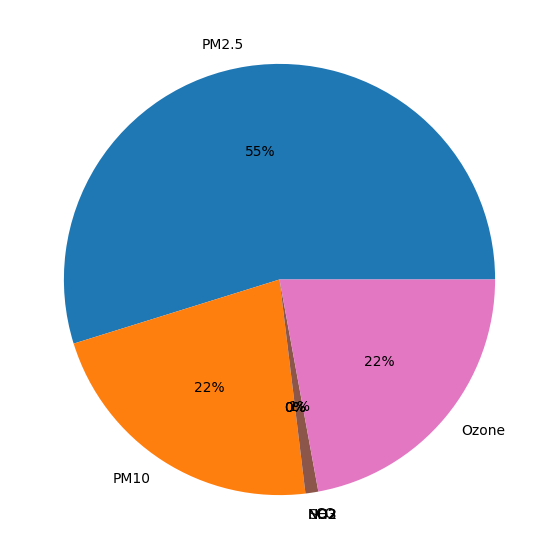

In [44]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_2021.columns)
rows = pd.concat([fort_william_2021.loc[fort_william_2021["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 109
The number of days PM2.5 was responsible for the AQI value was:- 29
The number of days PM10 was responsible for the AQI value was:- 53
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 27


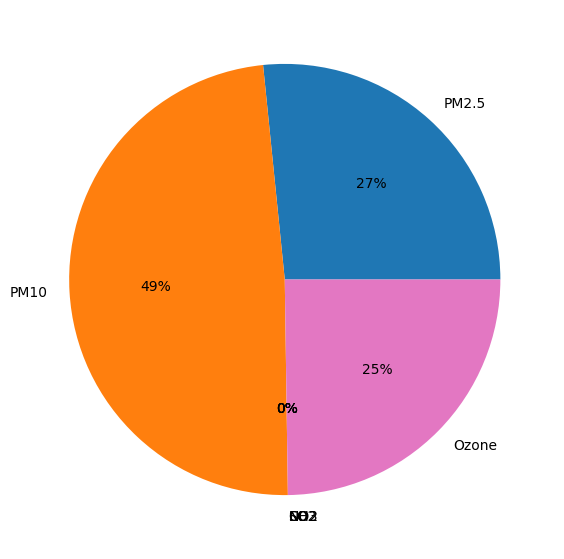

In [45]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_2021.columns)
rows = pd.concat([fort_william_2021.loc[fort_william_2021["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 80
The number of days PM2.5 was responsible for the AQI value was:- 57
The number of days PM10 was responsible for the AQI value was:- 23
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


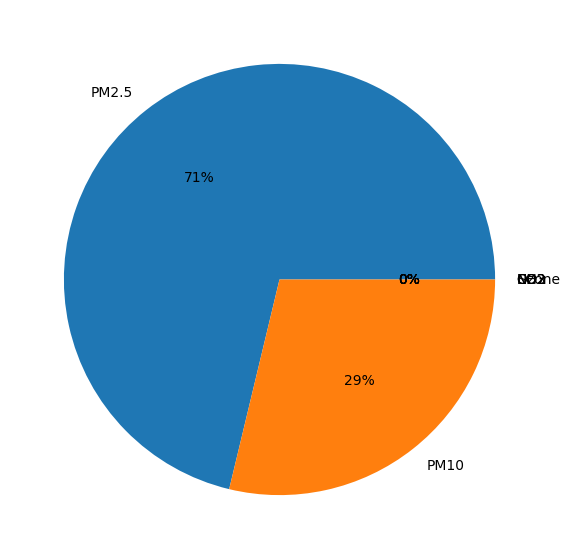

In [46]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_2021.columns)
rows = pd.concat([fort_william_2021.loc[fort_william_2021["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 47
The number of days PM2.5 was responsible for the AQI value was:- 46
The number of days PM10 was responsible for the AQI value was:- 1
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


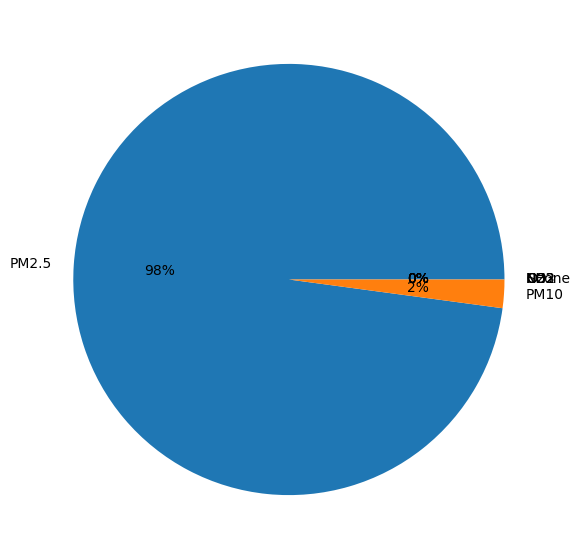

In [47]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_2021.columns)
rows = pd.concat([fort_william_2021.loc[fort_william_2021["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 25
The number of days PM2.5 was responsible for the AQI value was:- 25
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


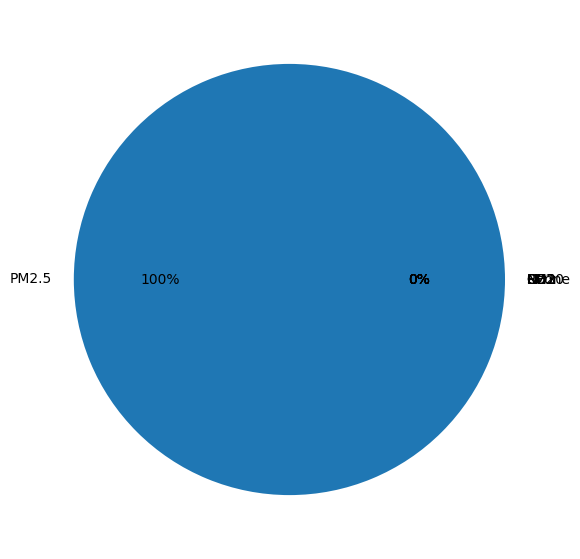

In [48]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_2021.columns)
rows = pd.concat([fort_william_2021.loc[fort_william_2021["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

#### AQI 2022

In [49]:
print("######################## fort_william_2022 ########################")
print ("When we look at the entire "+str(len(fort_william_2022))+" days time period :-"+
       "\nThe highest value of AQI was ",fort_william_2022["AQI"].max(),
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022["AQI"] == fort_william_2022["AQI"].max()])[4:15],
       ' and the lowest value was ',fort_william_2022["AQI"].min(), 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022["AQI"] == fort_william_2022["AQI"].min()])[4:15],'.'+
       "\nThe Average AQI value between "+str(fort_william_2022.iloc[0]['Date'])[:10]+" and "+
      str(fort_william_2022.iloc[-1]['Date'])[:10]+" time period is "+str(round(fort_william_2022["AQI"].mean(),2))+
      " which lies in the "+aqi(fort_william_2022["AQI"].mean())+" range."+
      "\nThe AQI value has a standard deviation of "+str(round(fort_william_2022["AQI"].std(),2)))

######################## fort_william_2022 ########################
When we look at the entire 365 days time period :-
The highest value of AQI was  315.62  recorded on  2022-01-21  and the lowest value was  18.87  recorded on   2022-09-1 .
The Average AQI value between 2022-01-01 and 2022-12-31 time period is 96.43 which lies in the Satisfactory range.
The AQI value has a standard deviation of 70.89


Good                   137
Moderately Polluted    100
Satisfactory            92
Poor                    31
Very poor                5
Name: AQI_Standard, dtype: int64


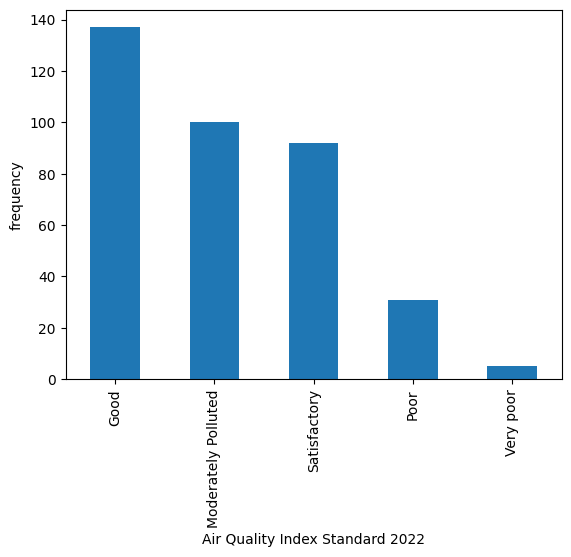

In [50]:
print(fort_william_2022['AQI_Standard'].value_counts())
fort_william_2022['AQI_Standard'].value_counts().plot(kind='bar', xlabel='Air Quality Index Standard 2022', ylabel='frequency')
plt.show()

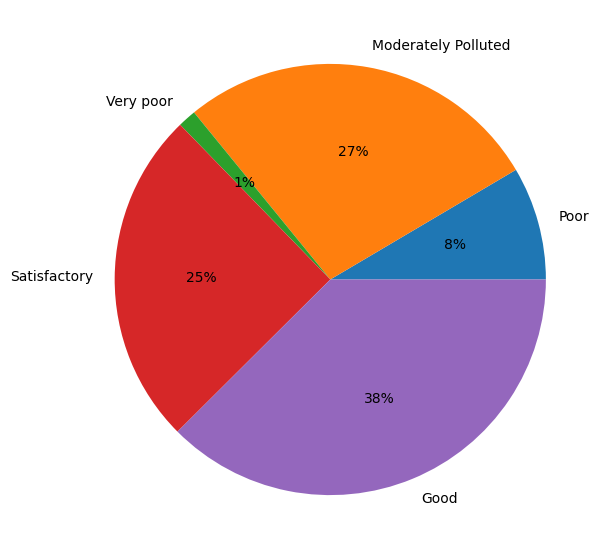

In [51]:
m = fort_william_2022['AQI_Standard'].value_counts()
stand =fort_william_2022['AQI_Standard'].unique()
count = []
for i in stand:
    count.append(m[i])

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

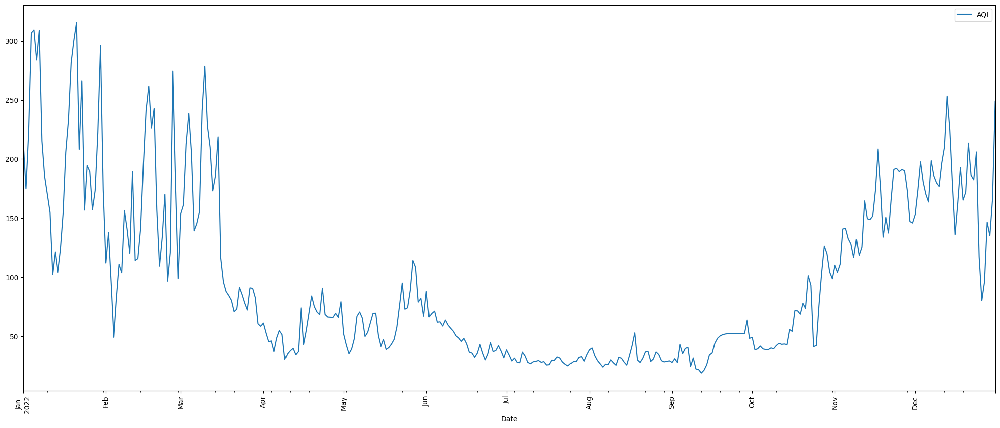

In [52]:
a = fort_william_2022.plot(x='Date',y='AQI',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

The total number of days are: 365
The number of days PM2.5 was responsible for the AQI value was:- 93
The number of days PM10 was responsible for the AQI value was:- 207
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 65


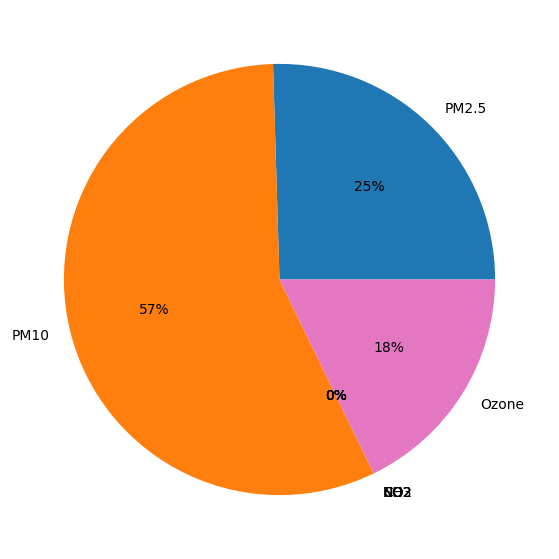

In [53]:
datetype(fort_william_2022)

The total number of days are: 137
The number of days PM2.5 was responsible for the AQI value was:- 17
The number of days PM10 was responsible for the AQI value was:- 78
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 42


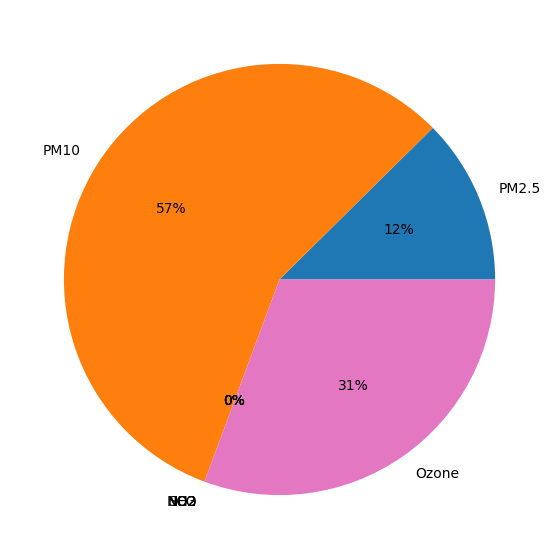

In [54]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_2022.columns)
rows = pd.concat([fort_william_2022.loc[fort_william_2022["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 92
The number of days PM2.5 was responsible for the AQI value was:- 11
The number of days PM10 was responsible for the AQI value was:- 58
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 23


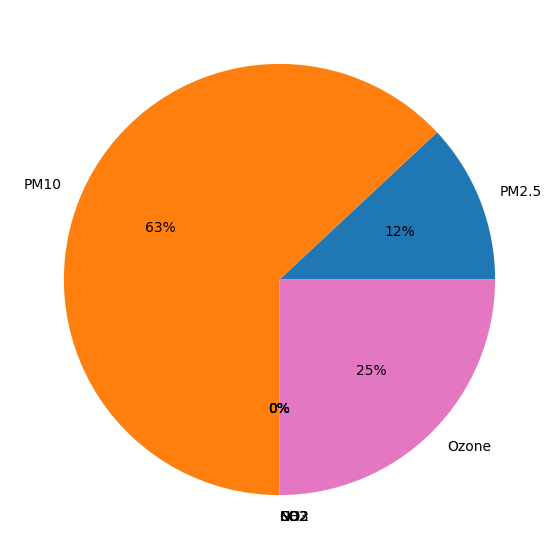

In [55]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_2022.columns)
rows = pd.concat([fort_william_2022.loc[fort_william_2022["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 100
The number of days PM2.5 was responsible for the AQI value was:- 33
The number of days PM10 was responsible for the AQI value was:- 67
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


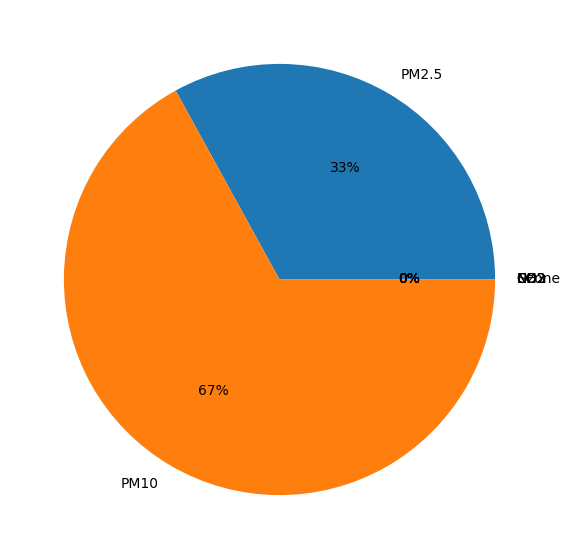

In [56]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_2022.columns)
rows = pd.concat([fort_william_2022.loc[fort_william_2022["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 31
The number of days PM2.5 was responsible for the AQI value was:- 27
The number of days PM10 was responsible for the AQI value was:- 4
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


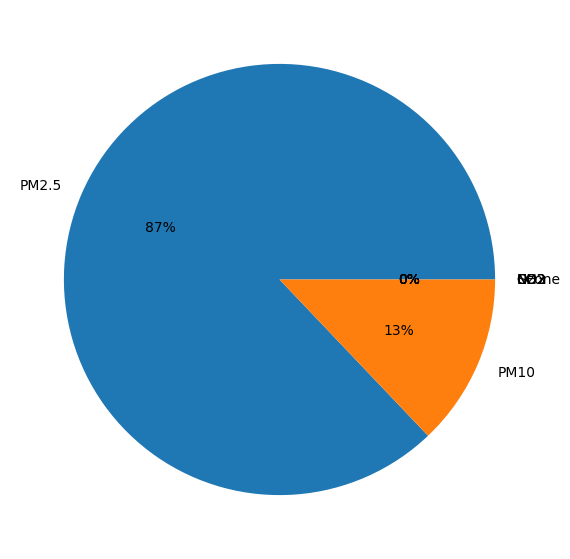

In [57]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_2022.columns)
rows = pd.concat([fort_william_2022.loc[fort_william_2022["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 5
The number of days PM2.5 was responsible for the AQI value was:- 5
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


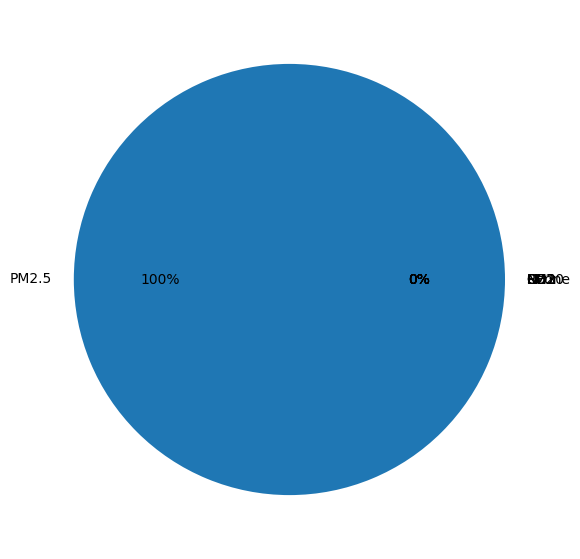

In [58]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_2022.columns)
rows = pd.concat([fort_william_2022.loc[fort_william_2022["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

### Month by Month AQI Standard Analysis.

##### January

In the January Months:-
Total number of days : 93
Very poor : 30 days
Moderately Polluted : 28 days
Poor : 35 days


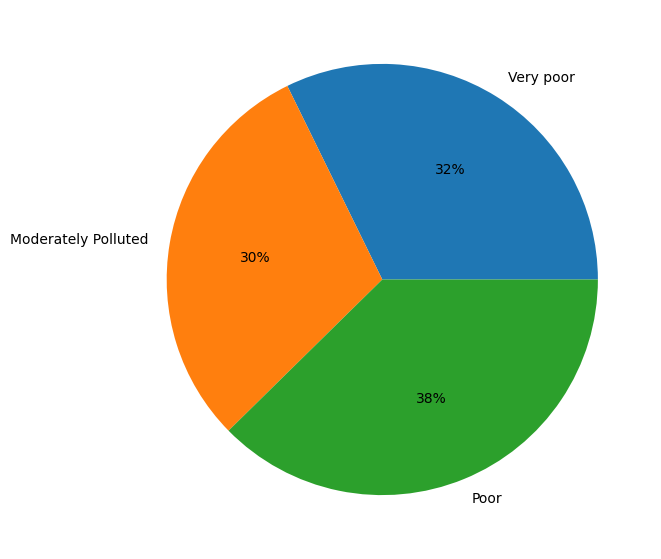

In [59]:
m = fort_william_jan['AQI_Standard'].value_counts()
stand =fort_william_jan['AQI_Standard'].unique()
count = []
print("In the January Months:-\nTotal number of days : "+str(len(fort_william_jan)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 93
The number of days PM2.5 was responsible for the AQI value was:- 90
The number of days PM10 was responsible for the AQI value was:- 3
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


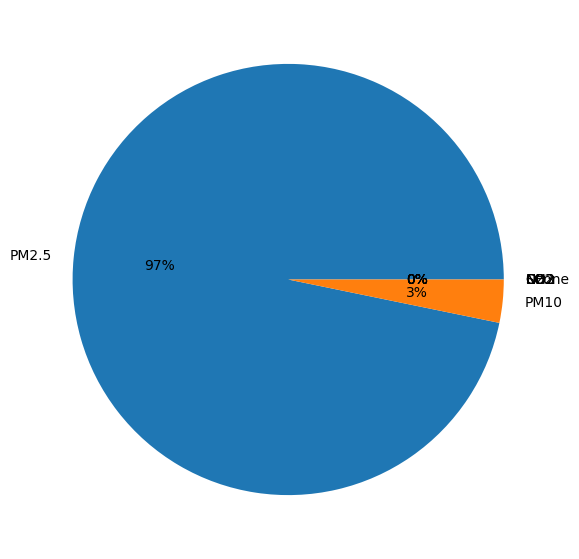

In [60]:
datetype(fort_william_jan)

The total number of days are: 28
The number of days PM2.5 was responsible for the AQI value was:- 25
The number of days PM10 was responsible for the AQI value was:- 3
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


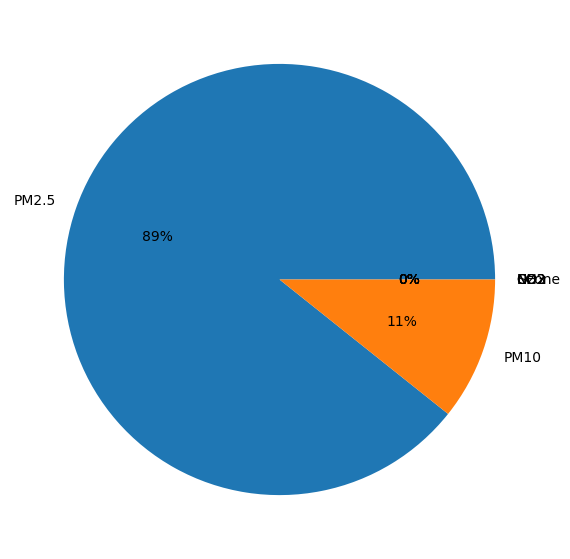

In [61]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_jan.columns)
rows = pd.concat([fort_william_jan.loc[fort_william_jan["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 35
The number of days PM2.5 was responsible for the AQI value was:- 35
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


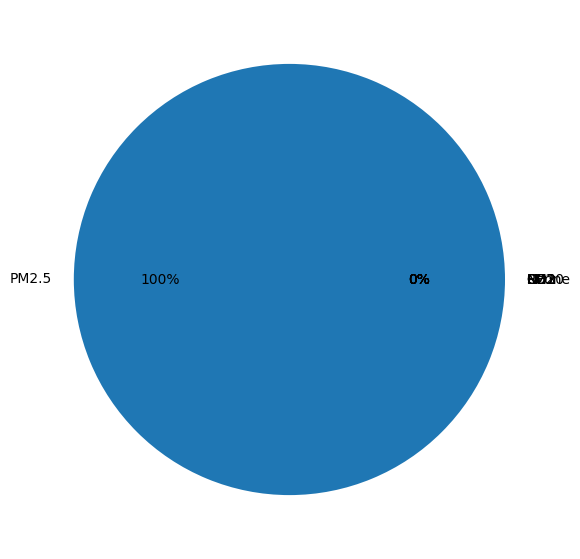

In [62]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_jan.columns)
rows = pd.concat([fort_william_jan.loc[fort_william_jan["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 30
The number of days PM2.5 was responsible for the AQI value was:- 30
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


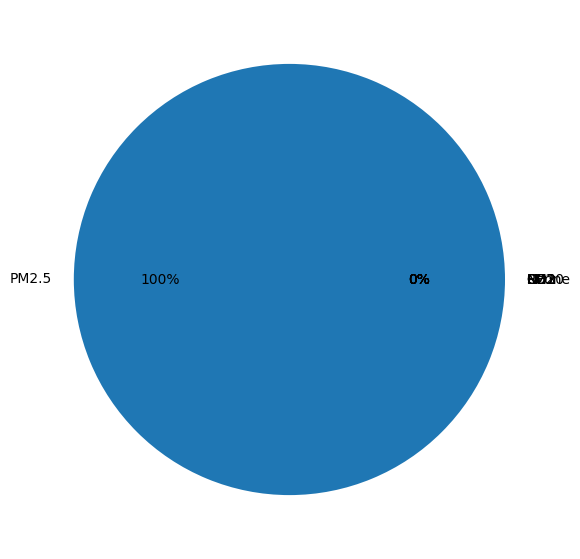

In [63]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_jan.columns)
rows = pd.concat([fort_william_jan.loc[fort_william_jan["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

##### February

In the February Months:-
Total number of days : 85
Moderately Polluted : 41 days
Poor : 28 days
Satisfactory : 8 days
Very poor : 7 days
Good : 1 days


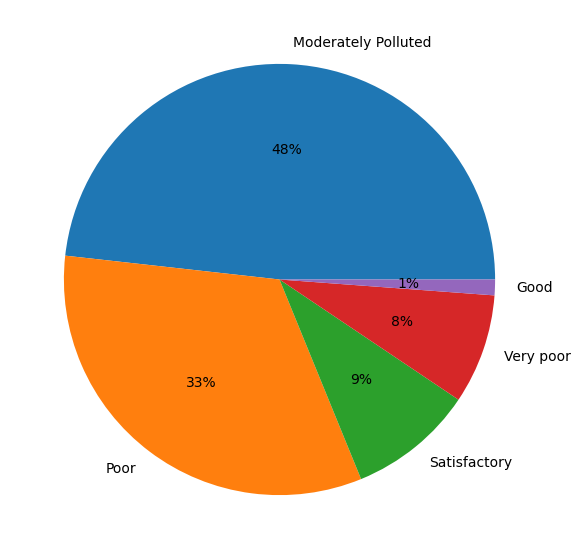

In [64]:

m = fort_william_feb['AQI_Standard'].value_counts()
stand =fort_william_feb['AQI_Standard'].unique()
count = []
print("In the February Months:-\nTotal number of days : "+str(len(fort_william_feb)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 85
The number of days PM2.5 was responsible for the AQI value was:- 59
The number of days PM10 was responsible for the AQI value was:- 26
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


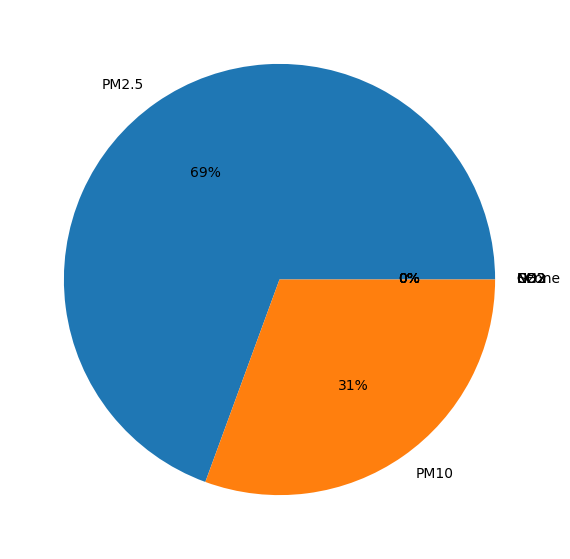

In [65]:
datetype(fort_william_feb)

The total number of days are: 1
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 1
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


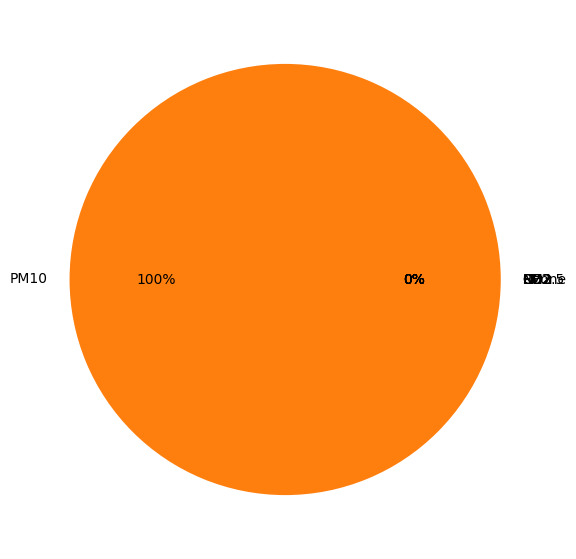

In [66]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_feb.columns)
rows = pd.concat([fort_william_feb.loc[fort_william_feb["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 8
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 8
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


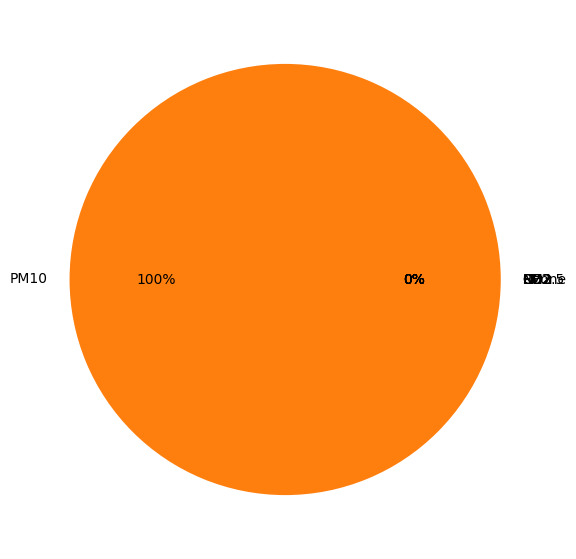

In [67]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_feb.columns)
rows = pd.concat([fort_william_feb.loc[fort_william_feb["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 41
The number of days PM2.5 was responsible for the AQI value was:- 25
The number of days PM10 was responsible for the AQI value was:- 16
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


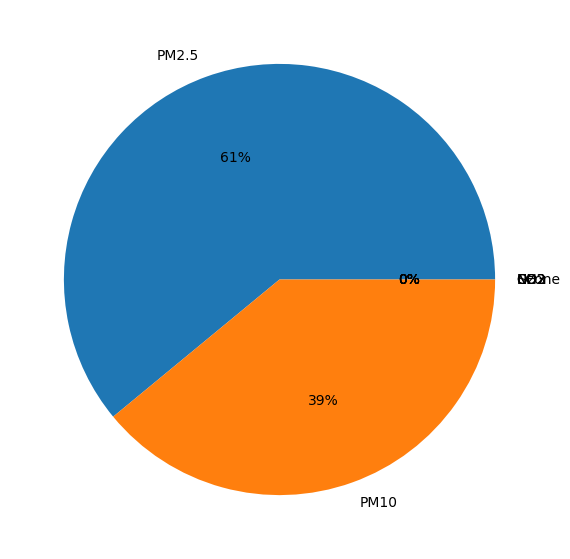

In [68]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_feb.columns)
rows = pd.concat([fort_william_feb.loc[fort_william_feb["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 28
The number of days PM2.5 was responsible for the AQI value was:- 27
The number of days PM10 was responsible for the AQI value was:- 1
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


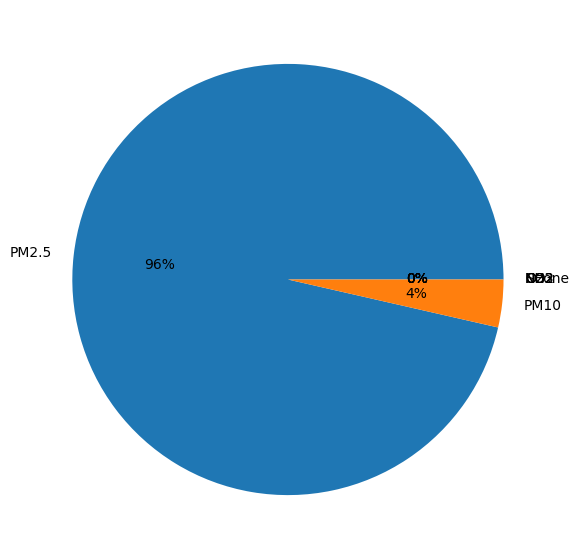

In [69]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_feb.columns)
rows = pd.concat([fort_william_feb.loc[fort_william_feb["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 7
The number of days PM2.5 was responsible for the AQI value was:- 7
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


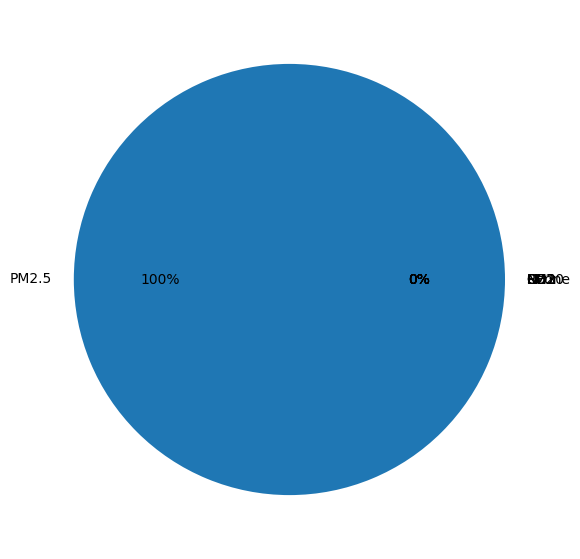

In [70]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_feb.columns)
rows = pd.concat([fort_william_feb.loc[fort_william_feb["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

##### March

In the March Months:-
Total number of days : 93
Moderately Polluted : 39 days
Satisfactory : 37 days
Poor : 16 days
Very poor : 1 days


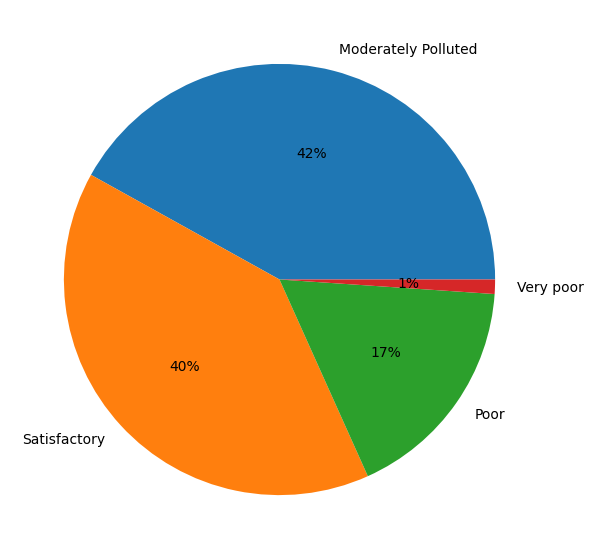

In [71]:
m = fort_william_mar['AQI_Standard'].value_counts()
stand =fort_william_mar['AQI_Standard'].unique()
count = []
print("In the March Months:-\nTotal number of days : "+str(len(fort_william_mar)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 93
The number of days PM2.5 was responsible for the AQI value was:- 51
The number of days PM10 was responsible for the AQI value was:- 40
The number of days NO2 was responsible for the AQI value was:- 1
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


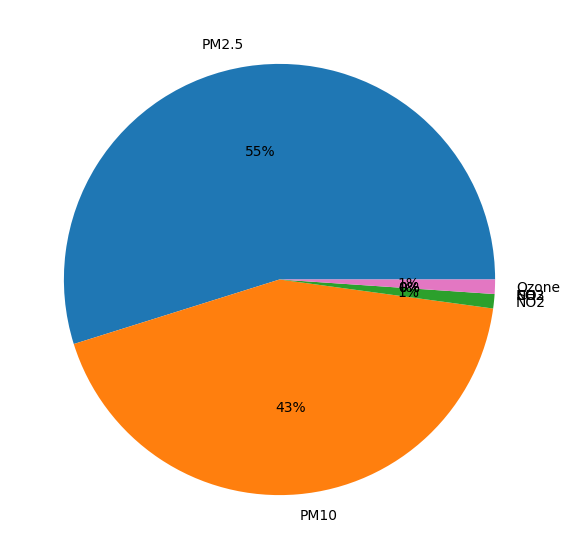

In [72]:
datetype(fort_william_mar)

The total number of days are: 37
The number of days PM2.5 was responsible for the AQI value was:- 10
The number of days PM10 was responsible for the AQI value was:- 25
The number of days NO2 was responsible for the AQI value was:- 1
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


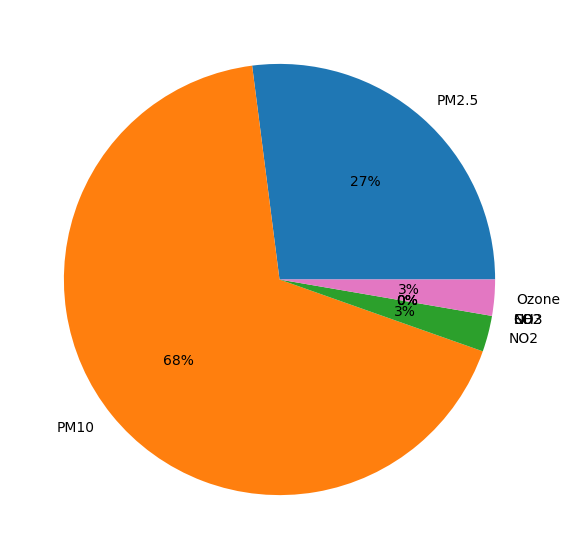

In [73]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_mar.columns)
rows = pd.concat([fort_william_mar.loc[fort_william_mar["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 39
The number of days PM2.5 was responsible for the AQI value was:- 24
The number of days PM10 was responsible for the AQI value was:- 15
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


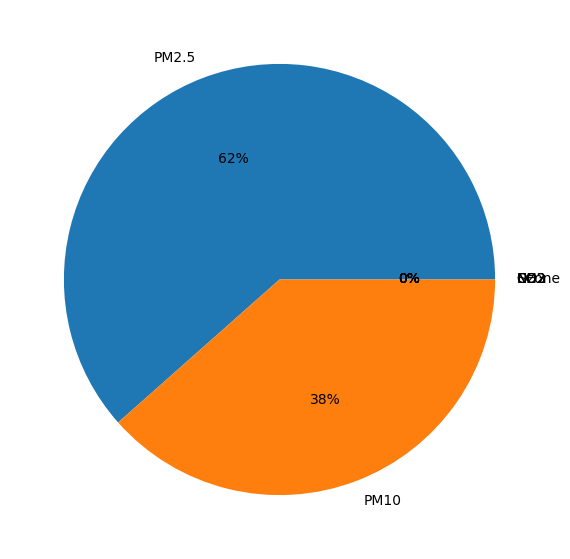

In [74]:
# Here we are finding which pollutant is responsible for how many Moderately polluted days
rows = pd.DataFrame(columns=fort_william_mar.columns)
rows = pd.concat([fort_william_mar.loc[fort_william_mar["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 16
The number of days PM2.5 was responsible for the AQI value was:- 16
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


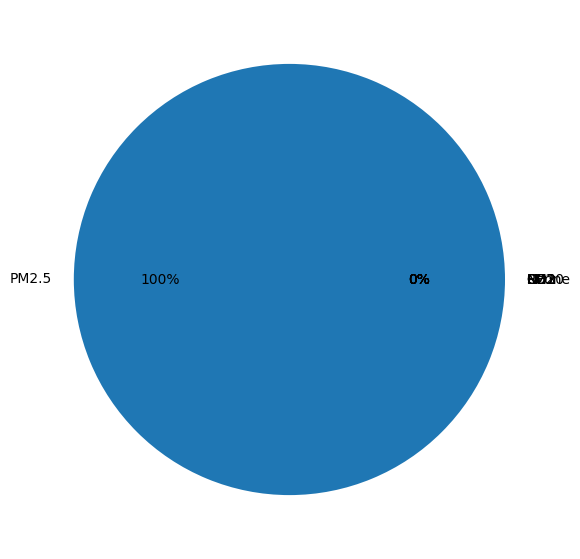

In [75]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_mar.columns)
rows = pd.concat([fort_william_mar.loc[fort_william_mar["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 1
The number of days PM2.5 was responsible for the AQI value was:- 1
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


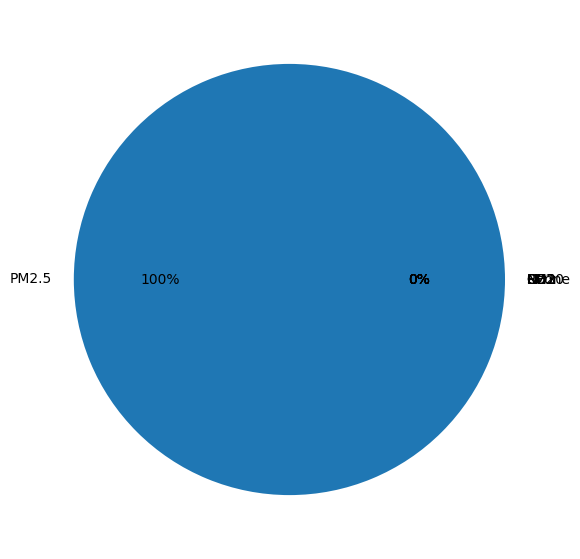

In [76]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_mar.columns)
rows = pd.concat([fort_william_mar.loc[fort_william_mar["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

##### April

In the April Months:-
Total number of days : 90
Moderately Polluted : 9 days
Satisfactory : 57 days
Good : 24 days


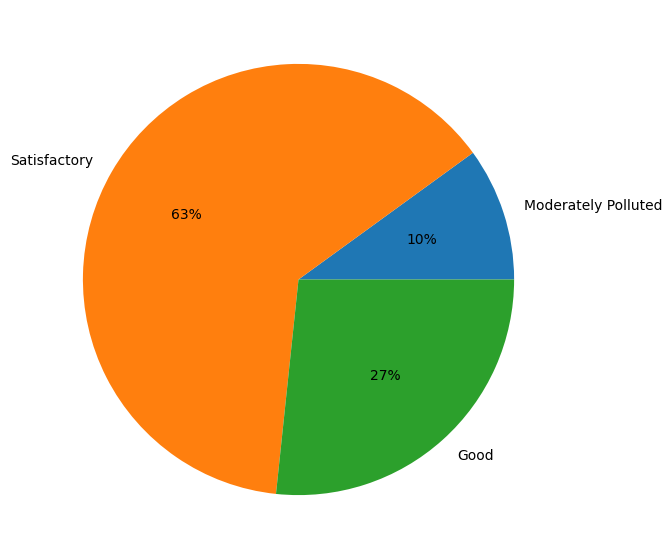

In [77]:
m = fort_william_apr['AQI_Standard'].value_counts()
stand =fort_william_apr['AQI_Standard'].unique()
count = []
print("In the April Months:-\nTotal number of days : "+str(len(fort_william_apr)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 90
The number of days PM2.5 was responsible for the AQI value was:- 8
The number of days PM10 was responsible for the AQI value was:- 56
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 26


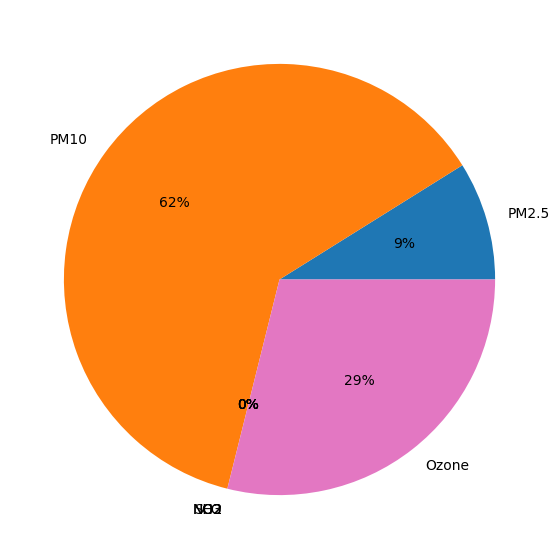

In [78]:
datetype(fort_william_apr)

The total number of days are: 24
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 15
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 9


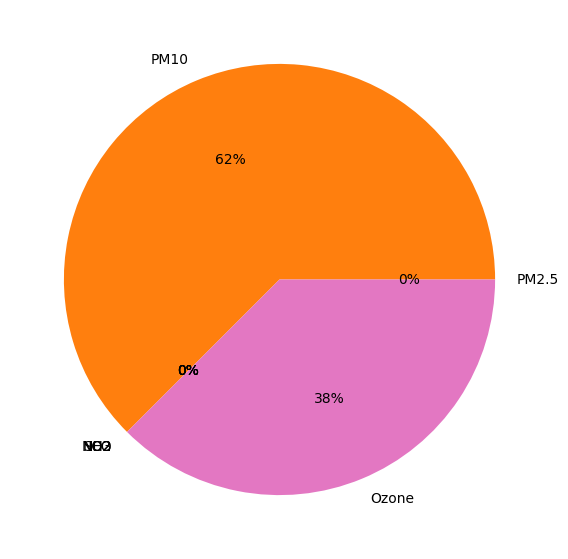

In [79]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_apr.columns)
rows = pd.concat([fort_william_apr.loc[fort_william_apr["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 57
The number of days PM2.5 was responsible for the AQI value was:- 4
The number of days PM10 was responsible for the AQI value was:- 36
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 17


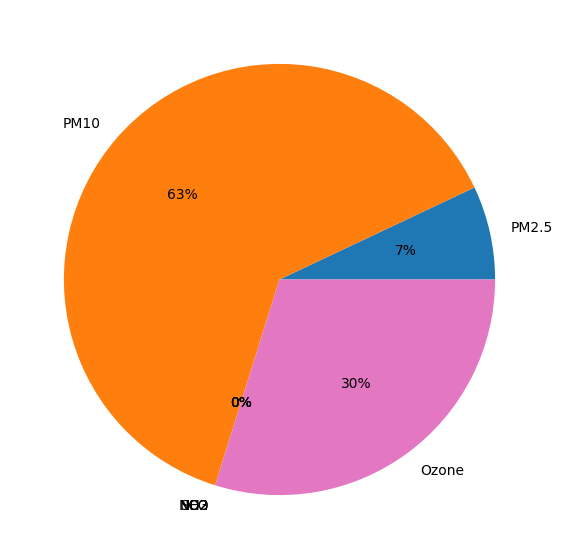

In [80]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_apr.columns)
rows = pd.concat([fort_william_apr.loc[fort_william_apr["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 9
The number of days PM2.5 was responsible for the AQI value was:- 4
The number of days PM10 was responsible for the AQI value was:- 5
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


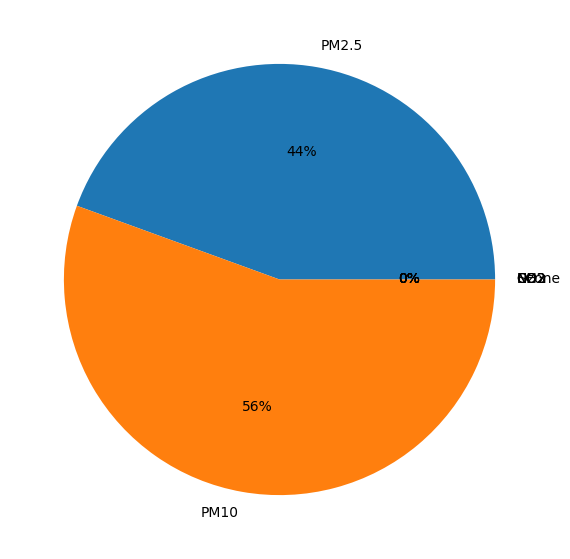

In [81]:
# Here we are finding which pollutant is responsible for how many Moderately polluted days
rows = pd.DataFrame(columns=fort_william_apr.columns)
rows = pd.concat([fort_william_apr.loc[fort_william_apr["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

##### May

In the May Months:-
Total number of days : 94
Satisfactory : 36 days
Good : 56 days
Moderately Polluted : 2 days


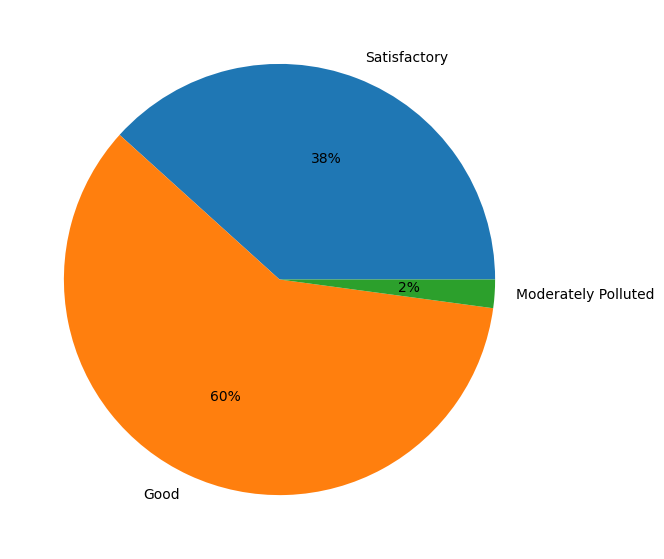

In [82]:
m = fort_william_may['AQI_Standard'].value_counts()
stand =fort_william_may['AQI_Standard'].unique()
count = []
print("In the May Months:-\nTotal number of days : "+str(len(fort_william_may)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 94
The number of days PM2.5 was responsible for the AQI value was:- 22
The number of days PM10 was responsible for the AQI value was:- 59
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 13


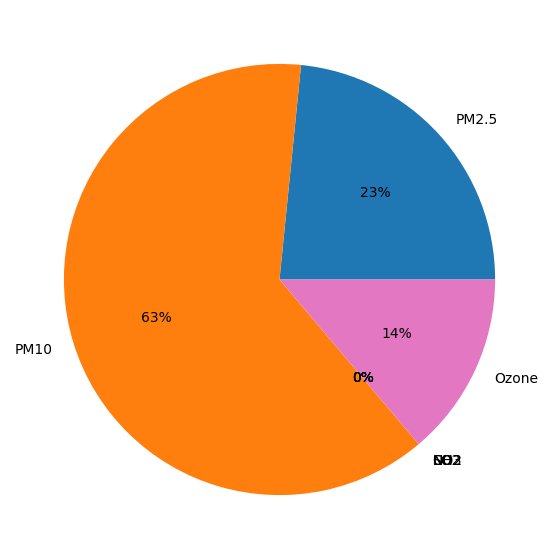

In [83]:
datetype(fort_william_may)

The total number of days are: 56
The number of days PM2.5 was responsible for the AQI value was:- 22
The number of days PM10 was responsible for the AQI value was:- 29
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 5


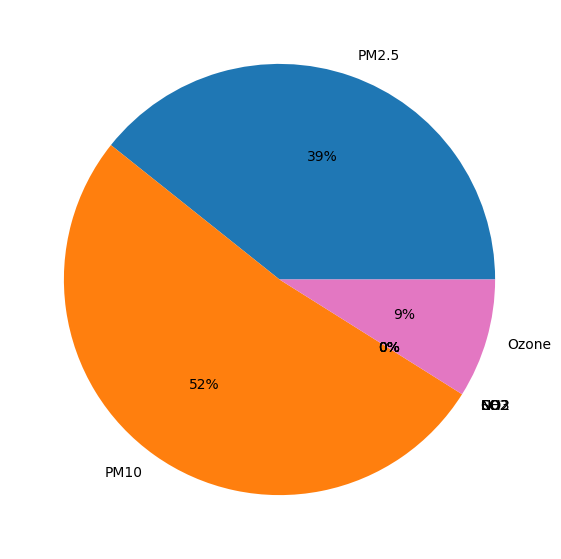

In [84]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_may.columns)
rows = pd.concat([fort_william_may.loc[fort_william_may["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 36
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 28
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 8


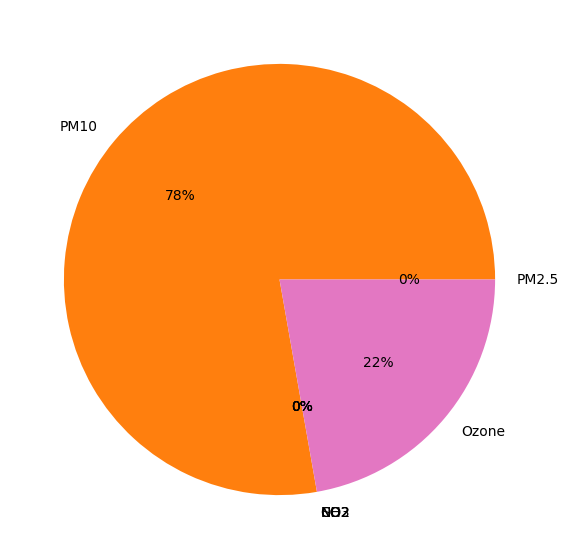

In [85]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_may.columns)
rows = pd.concat([fort_william_may.loc[fort_william_may["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 2
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 2
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


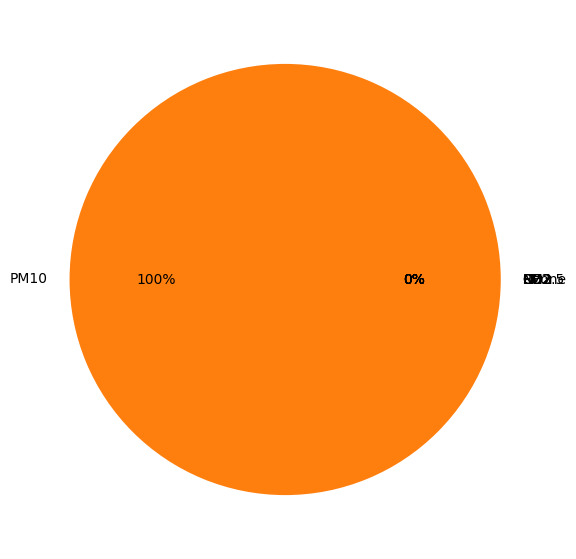

In [86]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_may.columns)
rows = pd.concat([fort_william_may.loc[fort_william_may["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

##### June

In the June Months:-
Total number of days : 120
Satisfactory : 32 days
Good : 87 days
Moderately Polluted : 1 days


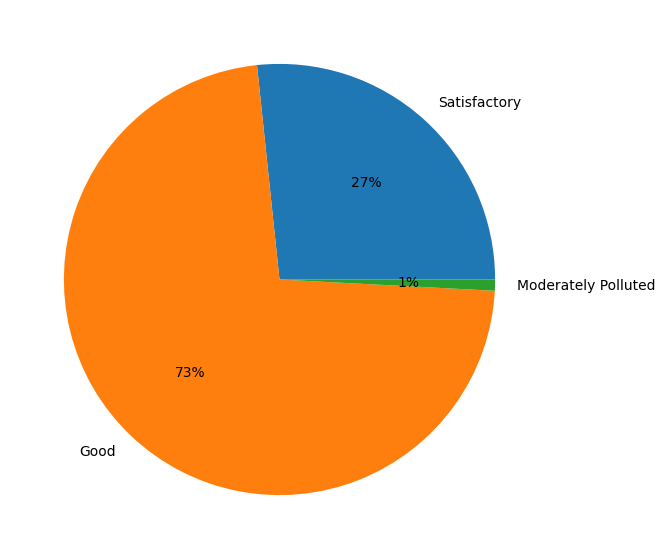

In [87]:
m = fort_william_jun['AQI_Standard'].value_counts()
stand =fort_william_jun['AQI_Standard'].unique()
count = []
print("In the June Months:-\nTotal number of days : "+str(len(fort_william_jun)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 120
The number of days PM2.5 was responsible for the AQI value was:- 35
The number of days PM10 was responsible for the AQI value was:- 83
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 2


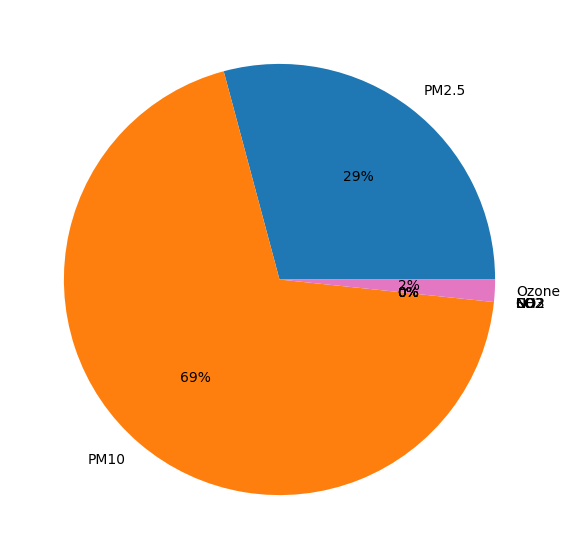

In [88]:
datetype(fort_william_jun)

The total number of days are: 87
The number of days PM2.5 was responsible for the AQI value was:- 31
The number of days PM10 was responsible for the AQI value was:- 55
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


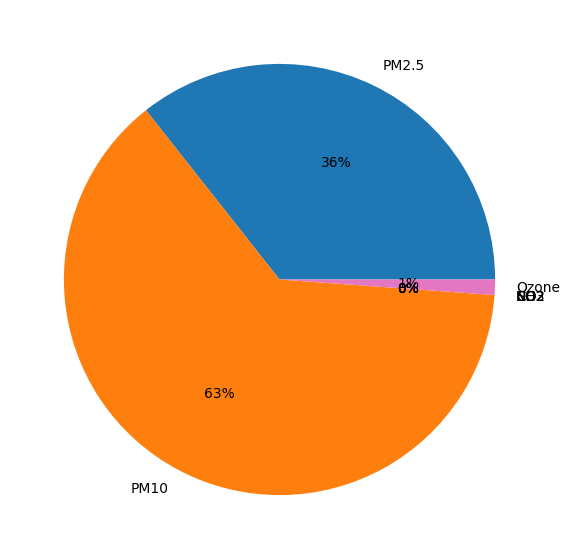

In [89]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_jun.columns)
rows = pd.concat([fort_william_jun.loc[fort_william_jun["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 32
The number of days PM2.5 was responsible for the AQI value was:- 4
The number of days PM10 was responsible for the AQI value was:- 27
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


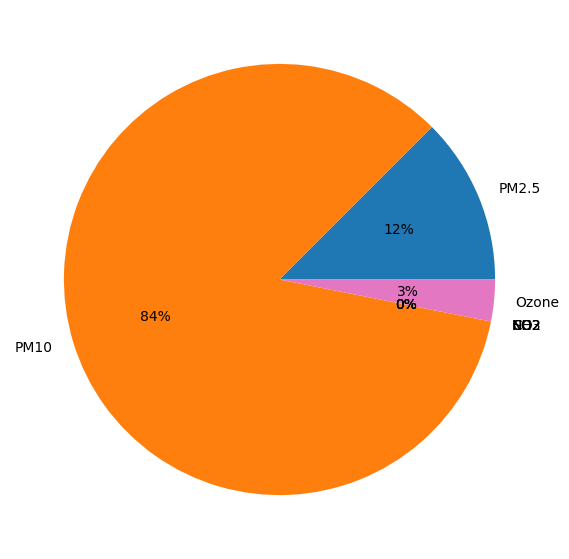

In [90]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_jun.columns)
rows = pd.concat([fort_william_jun.loc[fort_william_jun["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 1
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 1
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


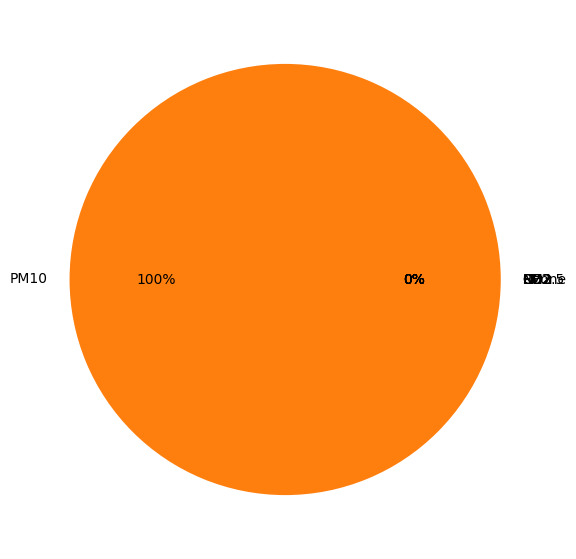

In [91]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_jun.columns)
rows = pd.concat([fort_william_jun.loc[fort_william_jun["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

##### July

In the July Months:-
Total number of days : 124
Satisfactory : 31 days
Good : 91 days
Moderately Polluted : 2 days


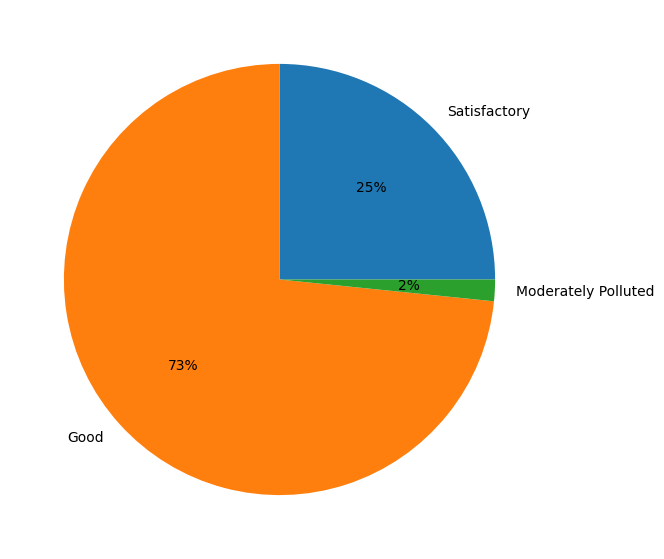

In [92]:
m = fort_william_jul['AQI_Standard'].value_counts()
stand =fort_william_jul['AQI_Standard'].unique()
count = []
print("In the July Months:-\nTotal number of days : "+str(len(fort_william_jul)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 124
The number of days PM2.5 was responsible for the AQI value was:- 9
The number of days PM10 was responsible for the AQI value was:- 72
The number of days NO2 was responsible for the AQI value was:- 1
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 42


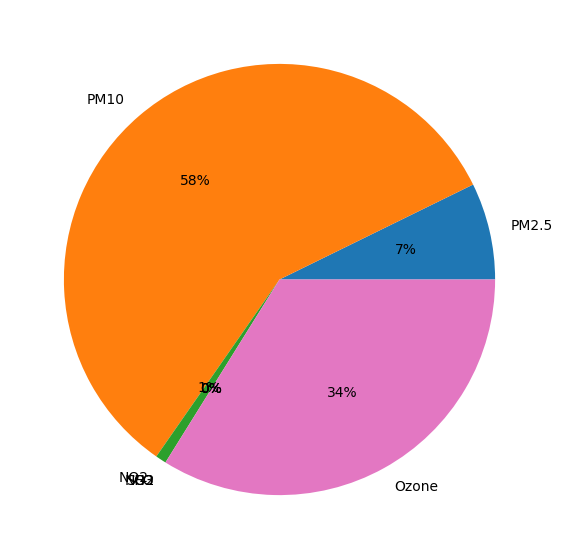

In [93]:
datetype(fort_william_jul)

The total number of days are: 91
The number of days PM2.5 was responsible for the AQI value was:- 9
The number of days PM10 was responsible for the AQI value was:- 51
The number of days NO2 was responsible for the AQI value was:- 1
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 30


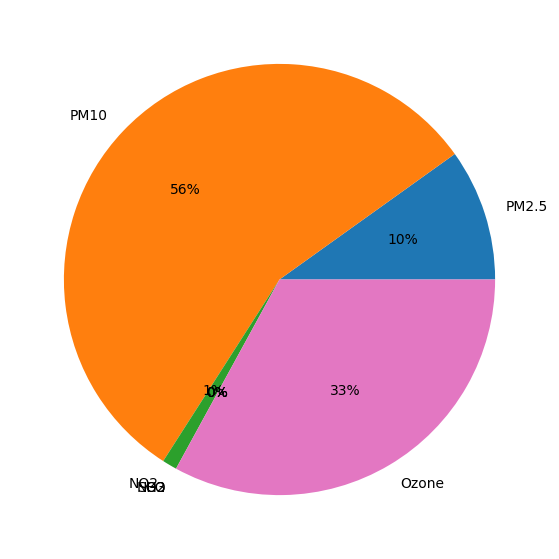

In [94]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_jul.columns)
rows = pd.concat([fort_william_jul.loc[fort_william_jul["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 31
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 19
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 12


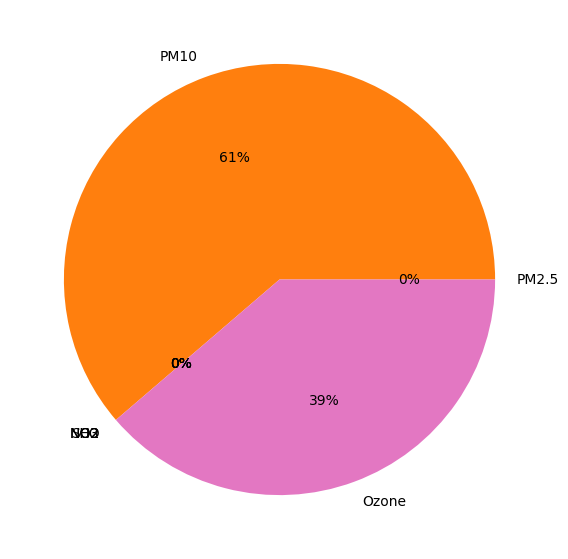

In [95]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_jul.columns)
rows = pd.concat([fort_william_jul.loc[fort_william_jul["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 2
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 2
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


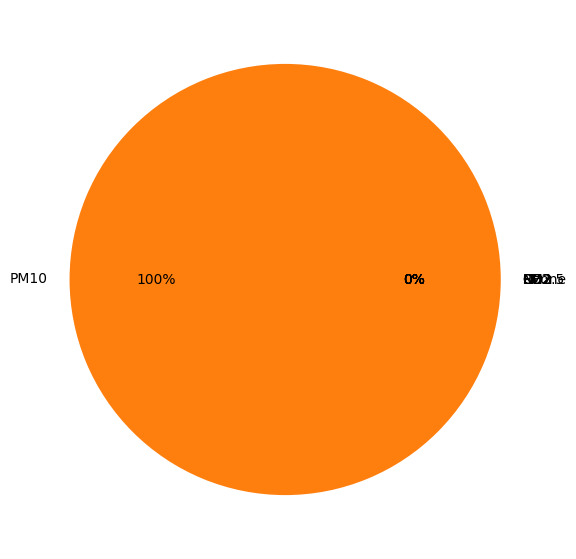

In [96]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_jul.columns)
rows = pd.concat([fort_william_jul.loc[fort_william_jul["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

##### August

In the August Months:-
Total number of days : 124
Good : 89 days
Satisfactory : 35 days


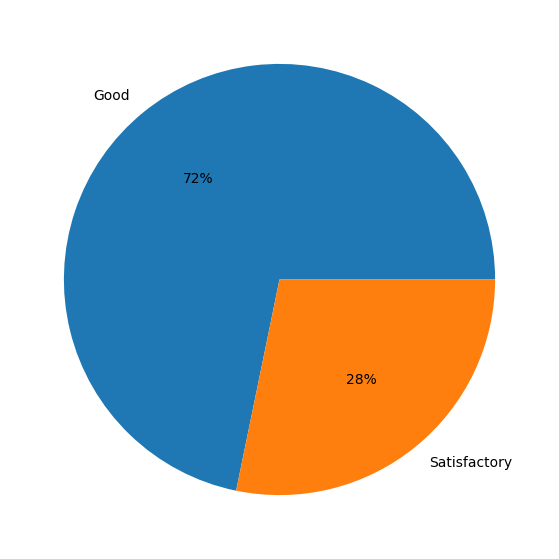

In [97]:
m = fort_william_aug['AQI_Standard'].value_counts()
stand =fort_william_aug['AQI_Standard'].unique()
count = []
print("In the August Months:-\nTotal number of days : "+str(len(fort_william_aug)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 124
The number of days PM2.5 was responsible for the AQI value was:- 14
The number of days PM10 was responsible for the AQI value was:- 62
The number of days NO2 was responsible for the AQI value was:- 2
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 46


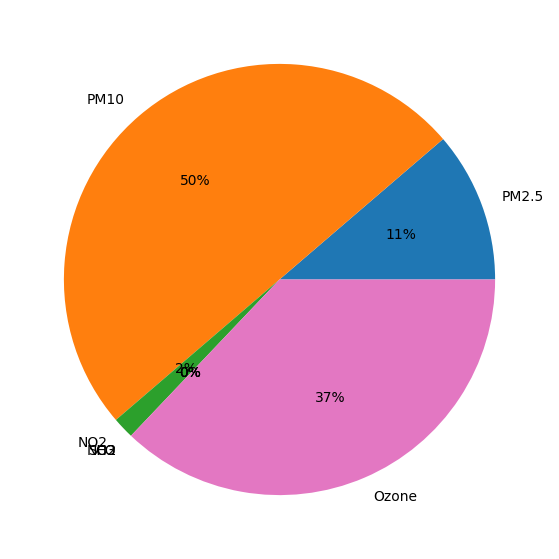

In [98]:
datetype(fort_william_aug)

The total number of days are: 89
The number of days PM2.5 was responsible for the AQI value was:- 9
The number of days PM10 was responsible for the AQI value was:- 44
The number of days NO2 was responsible for the AQI value was:- 2
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 34


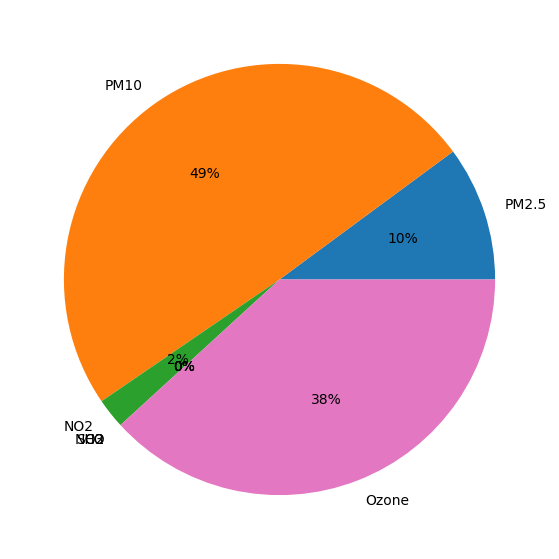

In [99]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_aug.columns)
rows = pd.concat([fort_william_aug.loc[fort_william_aug["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 35
The number of days PM2.5 was responsible for the AQI value was:- 5
The number of days PM10 was responsible for the AQI value was:- 18
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 12


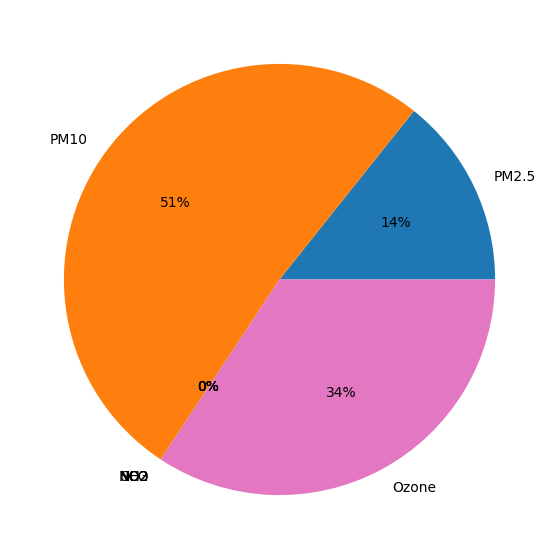

In [100]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_aug.columns)
rows = pd.concat([fort_william_aug.loc[fort_william_aug["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

##### September

In the September Months:-
Total number of days : 120
Satisfactory : 43 days
Good : 77 days


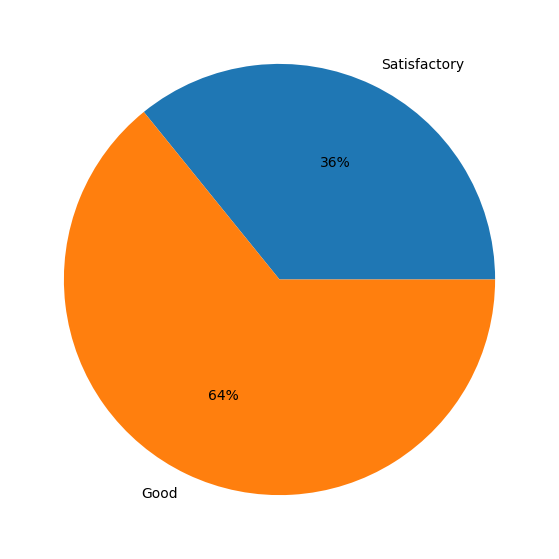

In [101]:
m = fort_william_sep['AQI_Standard'].value_counts()
stand =fort_william_sep['AQI_Standard'].unique()
count = []
print("In the September Months:-\nTotal number of days : "+str(len(fort_william_sep)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 120
The number of days PM2.5 was responsible for the AQI value was:- 28
The number of days PM10 was responsible for the AQI value was:- 72
The number of days NO2 was responsible for the AQI value was:- 2
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 18


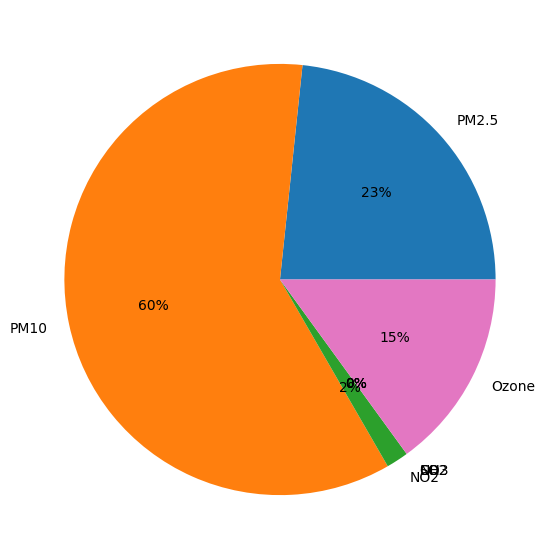

In [102]:
datetype(fort_william_sep)

The total number of days are: 77
The number of days PM2.5 was responsible for the AQI value was:- 11
The number of days PM10 was responsible for the AQI value was:- 56
The number of days NO2 was responsible for the AQI value was:- 2
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 8


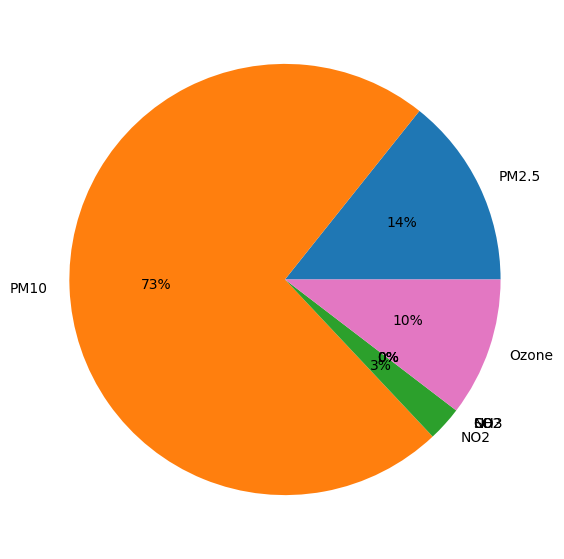

In [103]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_sep.columns)
rows = pd.concat([fort_william_sep.loc[fort_william_sep["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 43
The number of days PM2.5 was responsible for the AQI value was:- 17
The number of days PM10 was responsible for the AQI value was:- 16
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 10


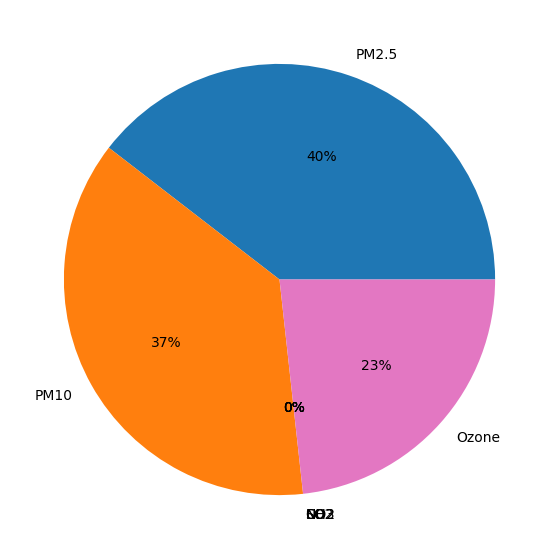

In [104]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_sep.columns)
rows = pd.concat([fort_william_sep.loc[fort_william_sep["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

##### October

In the October Months:-
Total number of days : 124
Satisfactory : 46 days
Good : 39 days
Moderately Polluted : 33 days
Poor : 5 days
Very poor : 1 days


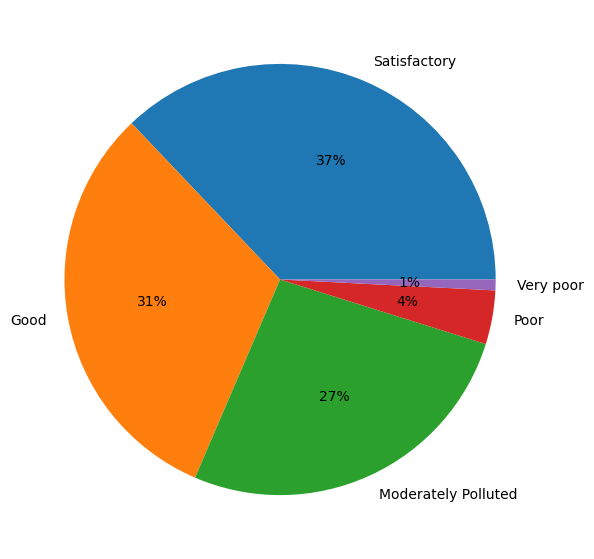

In [105]:
m = fort_william_oct['AQI_Standard'].value_counts()
stand =fort_william_oct['AQI_Standard'].unique()
count = []
print("In the October Months:-\nTotal number of days : "+str(len(fort_william_oct)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 124
The number of days PM2.5 was responsible for the AQI value was:- 59
The number of days PM10 was responsible for the AQI value was:- 51
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 14


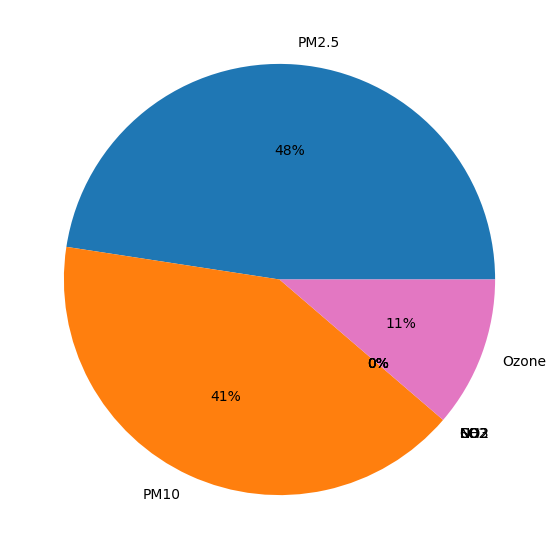

In [106]:
datetype(fort_william_oct)

The total number of days are: 39
The number of days PM2.5 was responsible for the AQI value was:- 5
The number of days PM10 was responsible for the AQI value was:- 21
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 13


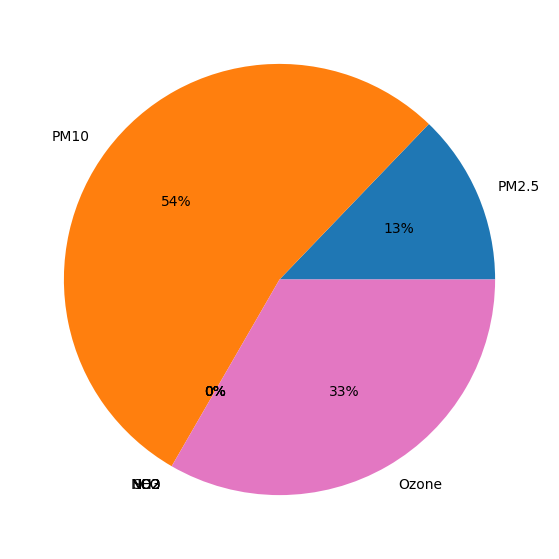

In [107]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_oct.columns)
rows = pd.concat([fort_william_oct.loc[fort_william_oct["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 46
The number of days PM2.5 was responsible for the AQI value was:- 28
The number of days PM10 was responsible for the AQI value was:- 17
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


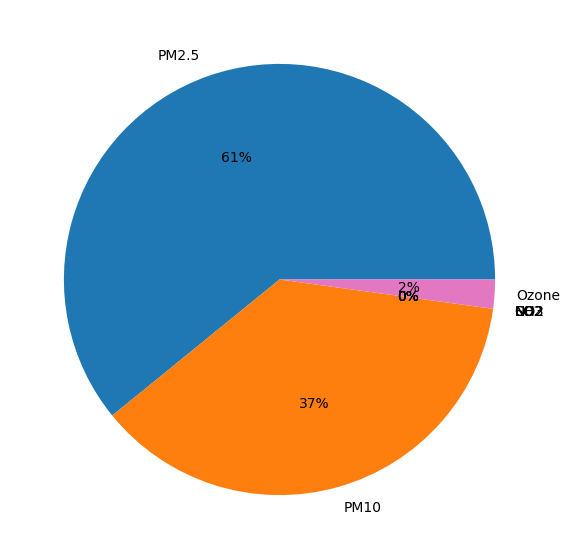

In [108]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_oct.columns)
rows = pd.concat([fort_william_oct.loc[fort_william_oct["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 33
The number of days PM2.5 was responsible for the AQI value was:- 20
The number of days PM10 was responsible for the AQI value was:- 13
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


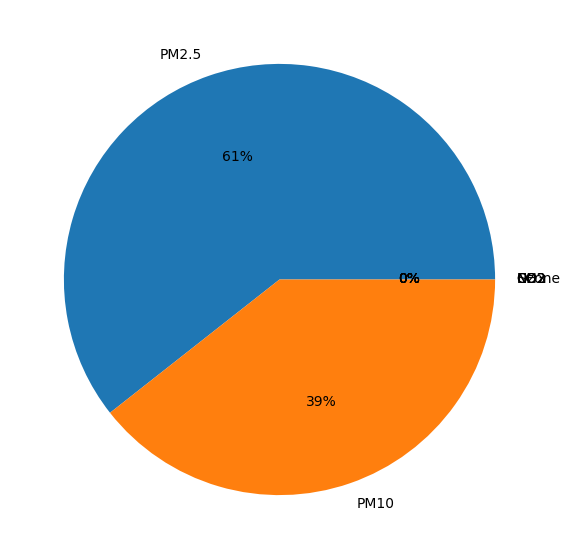

In [109]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_oct.columns)
rows = pd.concat([fort_william_oct.loc[fort_william_oct["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 5
The number of days PM2.5 was responsible for the AQI value was:- 5
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


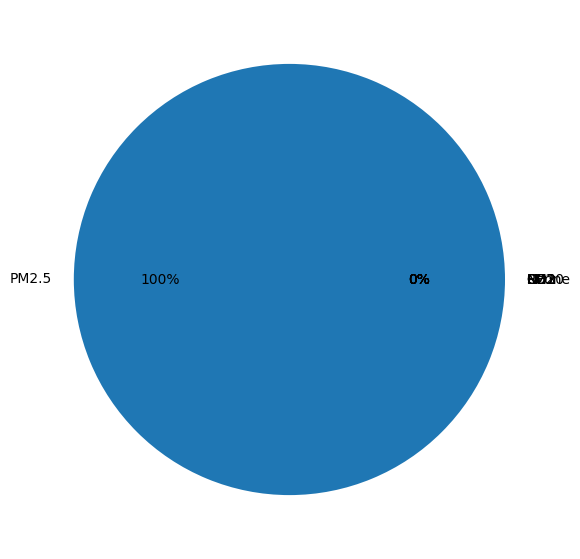

In [110]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_oct.columns)
rows = pd.concat([fort_william_oct.loc[fort_william_oct["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 1
The number of days PM2.5 was responsible for the AQI value was:- 1
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


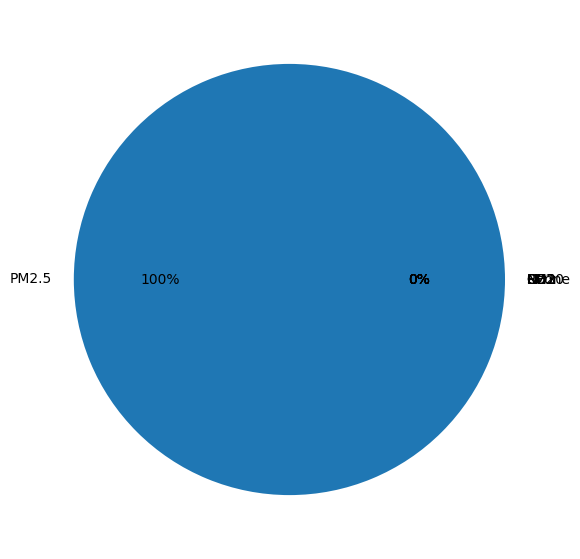

In [111]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_oct.columns)
rows = pd.concat([fort_william_oct.loc[fort_william_oct["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

##### November

In the November Months:-
Total number of days : 120
Very poor : 13 days
Moderately Polluted : 71 days
Poor : 26 days
Good : 4 days
Satisfactory : 6 days


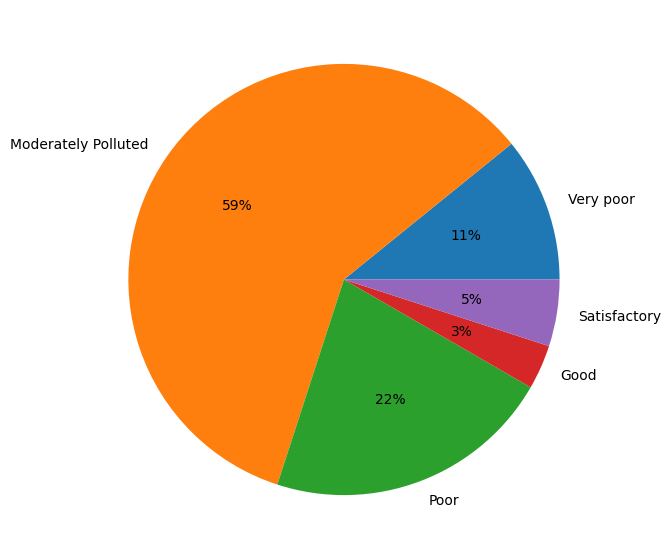

In [112]:
m = fort_william_nov['AQI_Standard'].value_counts()
stand =fort_william_nov['AQI_Standard'].unique()
count = []
print("In the November Months:-\nTotal number of days : "+str(len(fort_william_nov)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 120
The number of days PM2.5 was responsible for the AQI value was:- 71
The number of days PM10 was responsible for the AQI value was:- 48
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


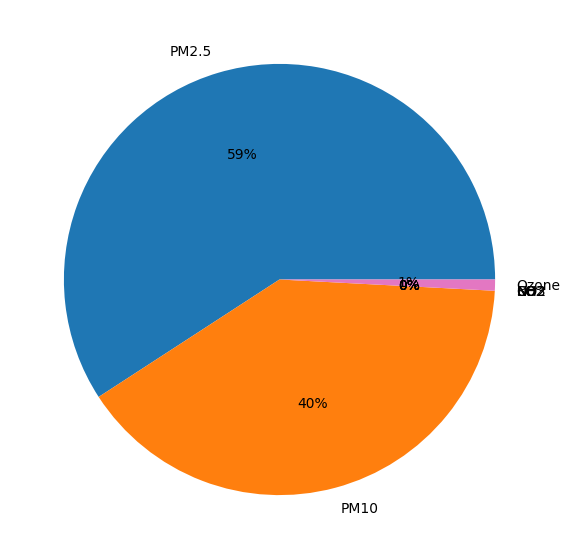

In [113]:
datetype(fort_william_nov)

The total number of days are: 4
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 3
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 1


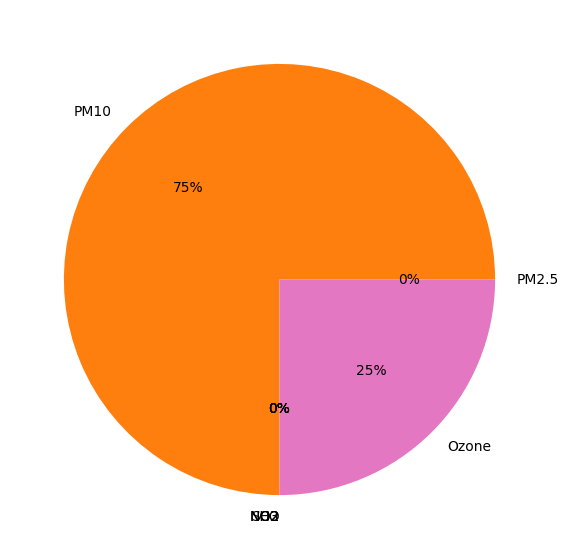

In [114]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_nov.columns)
rows = pd.concat([fort_william_nov.loc[fort_william_nov["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 6
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 6
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


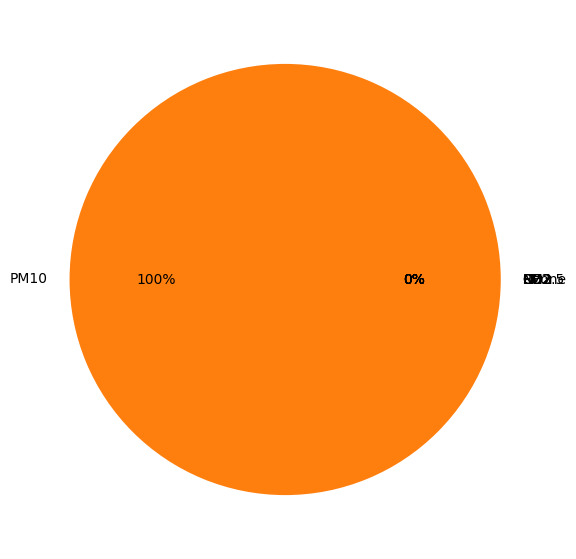

In [115]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_nov.columns)
rows = pd.concat([fort_william_nov.loc[fort_william_nov["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 71
The number of days PM2.5 was responsible for the AQI value was:- 33
The number of days PM10 was responsible for the AQI value was:- 38
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


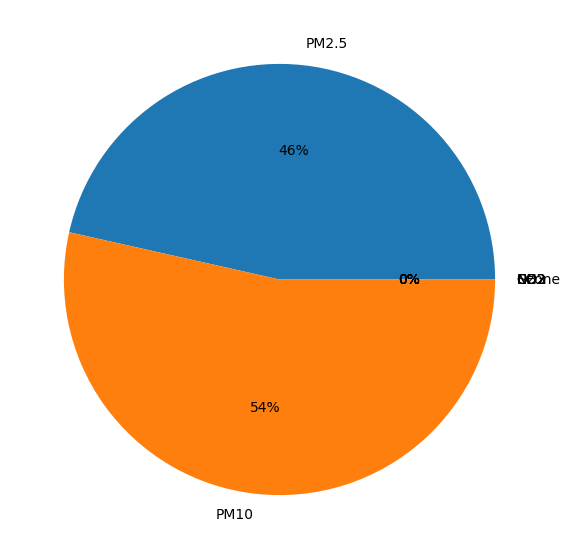

In [116]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_nov.columns)
rows = pd.concat([fort_william_nov.loc[fort_william_nov["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 26
The number of days PM2.5 was responsible for the AQI value was:- 25
The number of days PM10 was responsible for the AQI value was:- 1
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


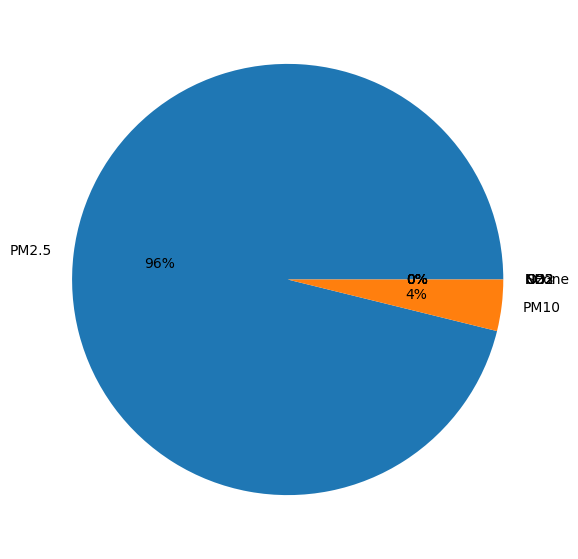

In [117]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_nov.columns)
rows = pd.concat([fort_william_nov.loc[fort_william_nov["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 13
The number of days PM2.5 was responsible for the AQI value was:- 13
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


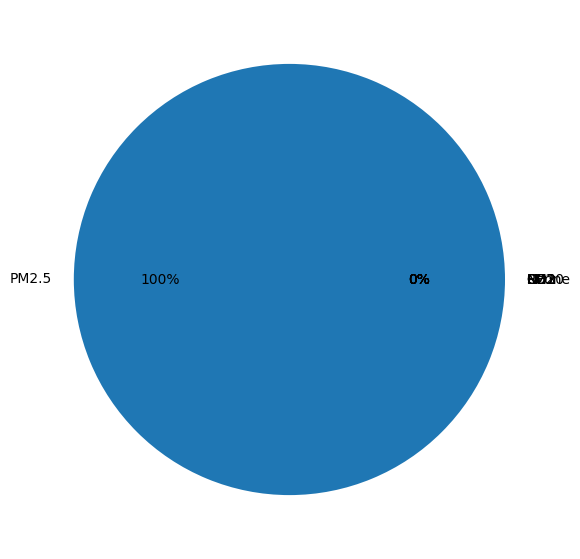

In [118]:
# Here we are finding which pollutant is responsible for how many Very Poor days
rows = pd.DataFrame(columns=fort_william_nov.columns)
rows = pd.concat([fort_william_nov.loc[fort_william_nov["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

##### December

In the December Months:-
Total number of days : 124
Poor : 35 days
Very poor : 39 days
Moderately Polluted : 40 days
Satisfactory : 5 days
Good : 5 days


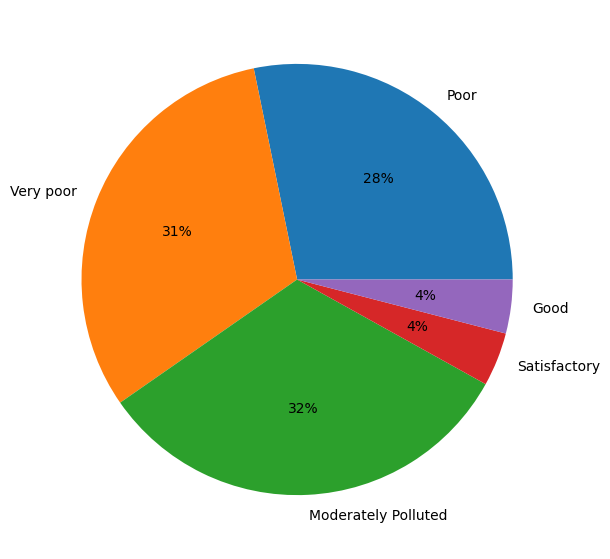

In [119]:
m = fort_william_dec['AQI_Standard'].value_counts()
stand =fort_william_dec['AQI_Standard'].unique()
count = []
print("In the December Months:-\nTotal number of days : "+str(len(fort_william_dec)))
for i in stand:
    count.append(m[i])
    print(str(i) +" : "+str(m[i])+" days")

# Creating plot
fig = plt.figure(figsize =(10, 7))
plt.pie(count, labels = stand,autopct='%1.0f%%')
plt.show()

The total number of days are: 124
The number of days PM2.5 was responsible for the AQI value was:- 89
The number of days PM10 was responsible for the AQI value was:- 34
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 1
The number of days Ozone was responsible for the AQI value was:- 0


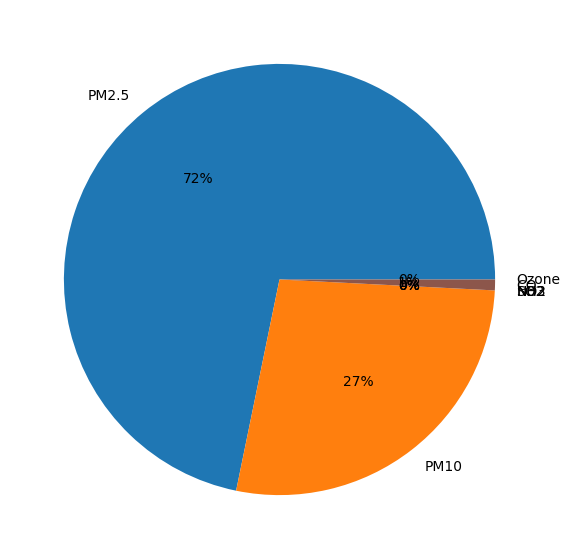

In [120]:
datetype(fort_william_dec)

The total number of days are: 5
The number of days PM2.5 was responsible for the AQI value was:- 1
The number of days PM10 was responsible for the AQI value was:- 3
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 1
The number of days Ozone was responsible for the AQI value was:- 0


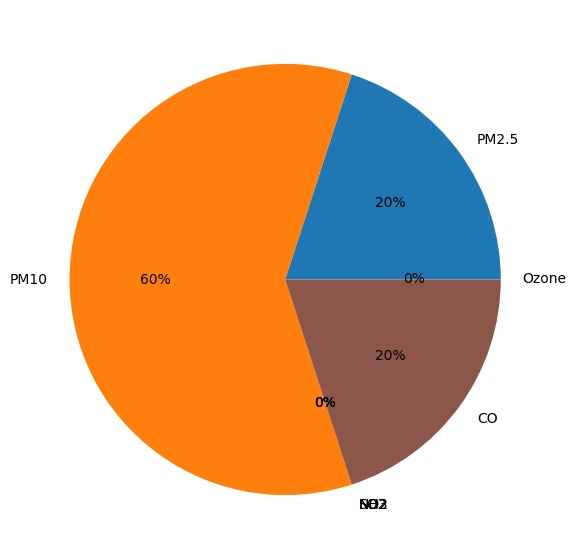

In [121]:
# Here we are finding which pollutant is responsible for how many Good days
rows = pd.DataFrame(columns=fort_william_dec.columns)
rows = pd.concat([fort_william_dec.loc[fort_william_dec["AQI_Standard"] == "Good"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 5
The number of days PM2.5 was responsible for the AQI value was:- 0
The number of days PM10 was responsible for the AQI value was:- 5
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


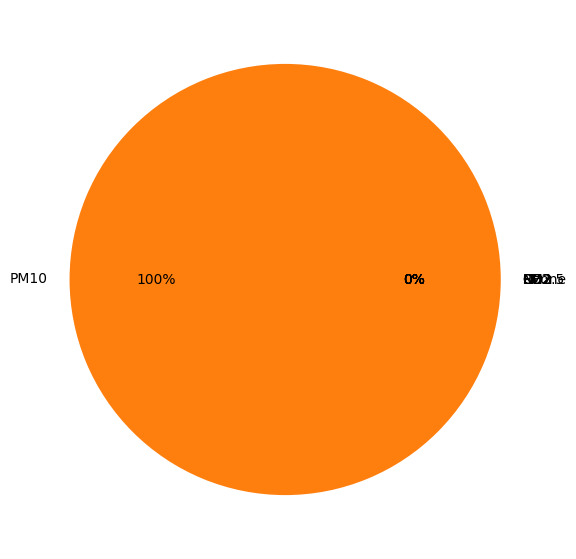

In [122]:
# Here we are finding which pollutant is responsible for how many Satisfactory days
rows = pd.DataFrame(columns=fort_william_dec.columns)
rows = pd.concat([fort_william_dec.loc[fort_william_dec["AQI_Standard"] == "Satisfactory"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 40
The number of days PM2.5 was responsible for the AQI value was:- 17
The number of days PM10 was responsible for the AQI value was:- 23
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


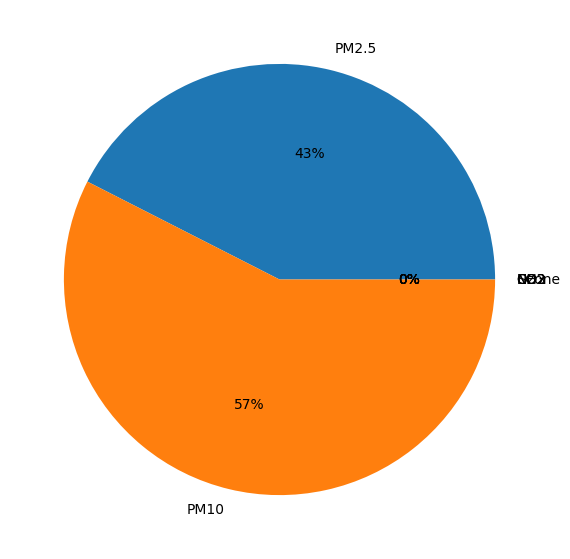

In [123]:
# Here we are finding which pollutant is responsible for how many Moderately Polluted days
rows = pd.DataFrame(columns=fort_william_dec.columns)
rows = pd.concat([fort_william_dec.loc[fort_william_dec["AQI_Standard"] == "Moderately Polluted"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 35
The number of days PM2.5 was responsible for the AQI value was:- 32
The number of days PM10 was responsible for the AQI value was:- 3
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


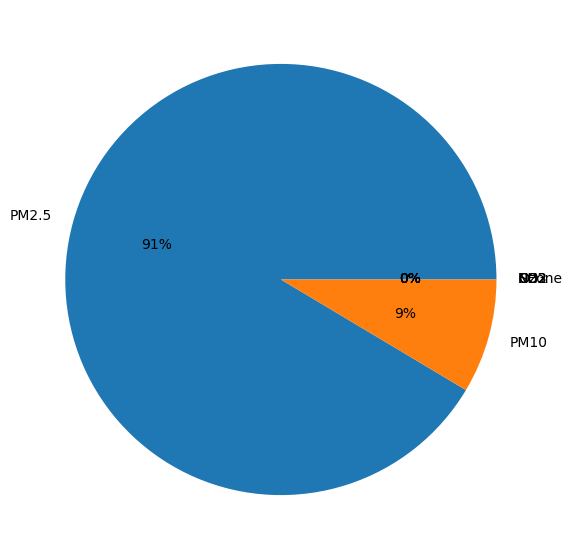

In [124]:
# Here we are finding which pollutant is responsible for how many Poor days
rows = pd.DataFrame(columns=fort_william_dec.columns)
rows = pd.concat([fort_william_dec.loc[fort_william_dec["AQI_Standard"] == "Poor"],rows],ignore_index=True)
datetype(rows)

The total number of days are: 39
The number of days PM2.5 was responsible for the AQI value was:- 39
The number of days PM10 was responsible for the AQI value was:- 0
The number of days NO2 was responsible for the AQI value was:- 0
The number of days NH3 was responsible for the AQI value was:- 0
The number of days SO2 was responsible for the AQI value was:- 0
The number of days CO was responsible for the AQI value was:- 0
The number of days Ozone was responsible for the AQI value was:- 0


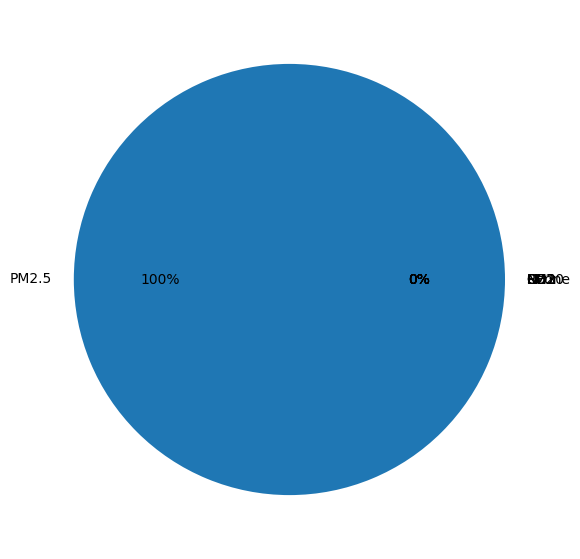

In [125]:
# Here we are finding which pollutant is responsible for how many Very poor days
rows = pd.DataFrame(columns=fort_william_dec.columns)
rows = pd.concat([fort_william_dec.loc[fort_william_dec["AQI_Standard"] == "Very poor"],rows],ignore_index=True)
datetype(rows)

### Particulate Matter 2.5 (PM 2.5)
##### PM2.5 are tiny particles in the air that reduce visibility, several health hazards and cause the air to appear hazy when levels are elevated.
##### According to the data from Continious station fort_william, PM 2.5 has a very high positive correlation with the air qualty index on the other hand it seems to be inversely correlated to the atmospheric temperature.

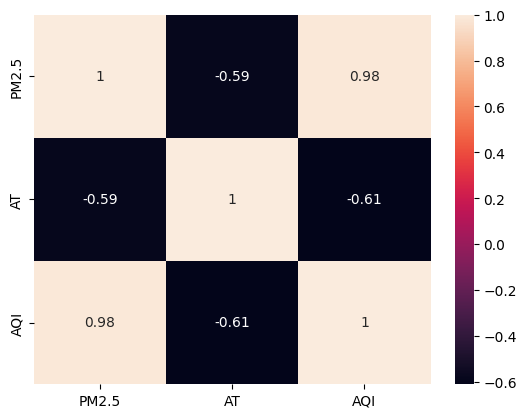

In [126]:
dataplot = sb.heatmap(fort_william[['PM2.5','AT','AQI']].corr(), annot=True)
plt.show()

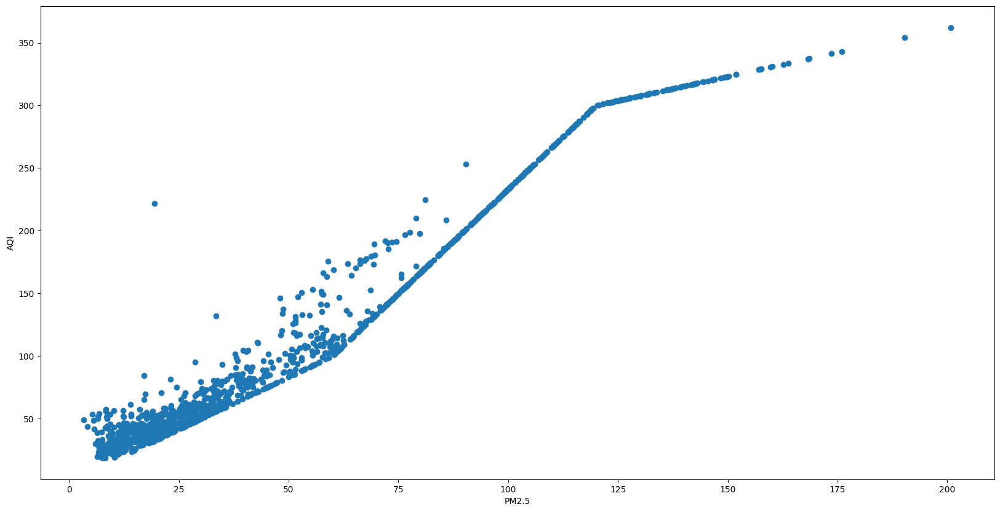

In [127]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william['PM2.5'],y=fort_william['AQI'])
plt.xlabel("PM2.5")
plt.ylabel("AQI")
plt.show()

##### Just from the 2 plots below we can clearly see the concentration of PM2.5 remains higher than 30 µg/m3(acceptable limit as per set by Central Pollution Control Board of India) throught out the year excet during the monsoon seasons similar to what we saw earlier in the plot of AQI. And earlier as we saw from the corelation heat map that PM2.5 has a very high positive correation with the AQI whose resemblence we can also see if we compare PM2.5 plot with AQI plot. So here we can cleary say that PM2.5 plays a major role in polluting the air in and arround fort_william.

The highest value of PM 2.5 in the 1311 days time period was  200.82  recorded on 2020-01-15 
and the lowest value was  3.35  recorded on 2021-05-04 
The average PM2.5 value was  49.99 
PM2.5 value had a standard deviation of  38.81 .
The number of days PM2.5 was responsible for the AQI value was:- 535 which is around 40.81%


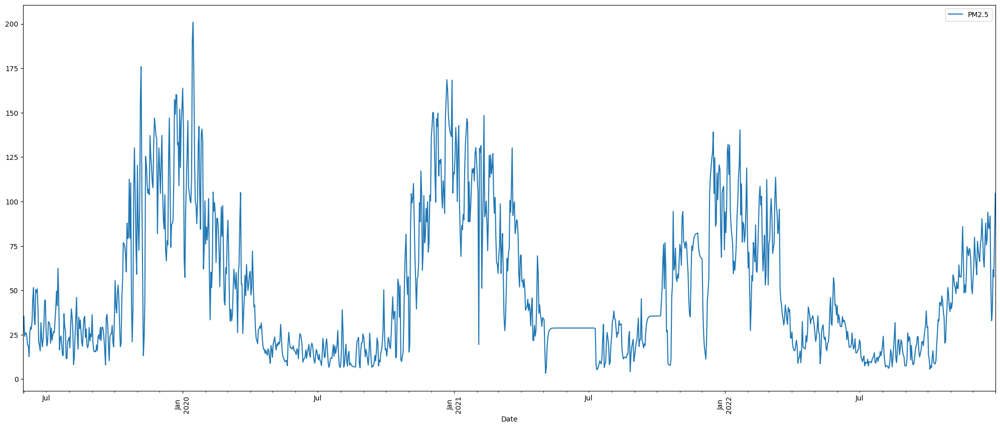

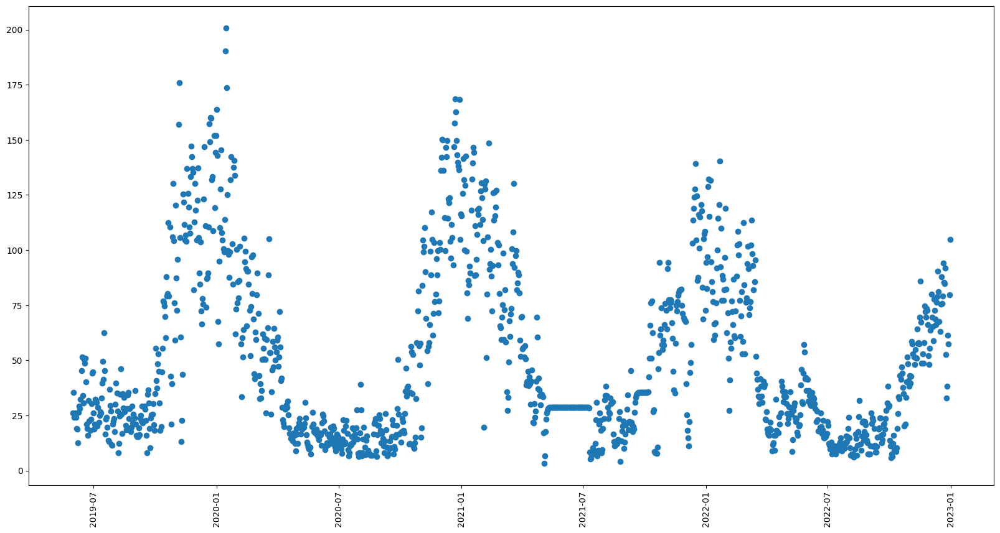

In [128]:
count = 0
for i in range(len(fort_william)):
    if (PM25(fort_william["PM2.5"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of PM 2.5 in the " +str(len(fort_william)) +
       " days time period was ",fort_william["PM2.5"].loc[fort_william['PM2.5'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['PM2.5'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["PM2.5"].loc[fort_william['PM2.5'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['PM2.5'].idxmin()])[:10],
       "\nThe average PM2.5 value was ",str(round(fort_william["PM2.5"].mean(),2)),
       "\nPM2.5 value had a standard deviation of ",str(round(fort_william["PM2.5"].std(),2)),
       '.\nThe number of days PM2.5 was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='PM2.5',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['PM2.5'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of PM2.5
PM2.5 primarily come from cars, truck, bus and off-road vehicle (e.g., construction equipment, locomotive) exhausts, other operations that involve the burning of fuels such as wood, heating oil or coal and natural sources such as forest, grass fires and even power plants.
#### Problems Caused by high concentration of PM2.5
Particles in the PM2.5 size range are able to travel deeply into the respiratory tract, reaching the lungs. 
Exposure to fine particles can cause short-term health effects such as eye, nose, throat and lung irritation, coughing, sneezing, runny nose, shortness of breath, affect lung function and worsen medical conditions such as asthma and heart disease.
Increases in daily PM2.5 exposure with increased respiratory and cardiovascular hospital admissions, emergency department visits and deaths. Studies also suggest that long term exposure to fine particulate matter may be associated with increased rates of chronic bronchitis, reduced lung function and increased mortality from lung cancer and heart disease. People with breathing and heart problems, children and the elderly may be particularly sensitive to PM2.5.

##### PM2.5 2019

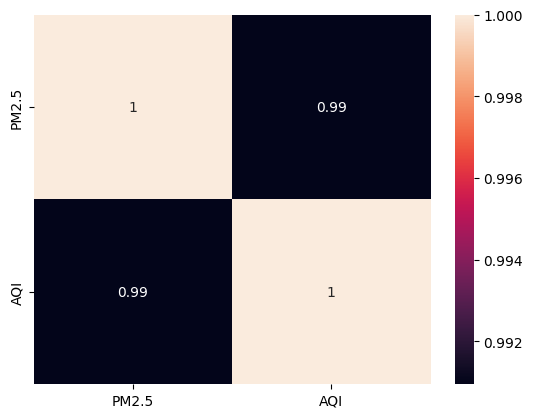

In [129]:
dataplot = sb.heatmap(fort_william_2019[['PM2.5','AQI']].corr(), annot=True)
plt.show()

The highest value of PM2.5 in the 215 days time period was  175.93  recorded on 2019-11-06 
and the lowest value was  7.98  recorded on 2019-09-19 
The average PM2.5 value was  56.14 
PM2.5 value had a standard deviation of  43.16 .
In 2019 the number of days PM2.5 was responsible for the AQI value was:- 99 which is around 46.05%


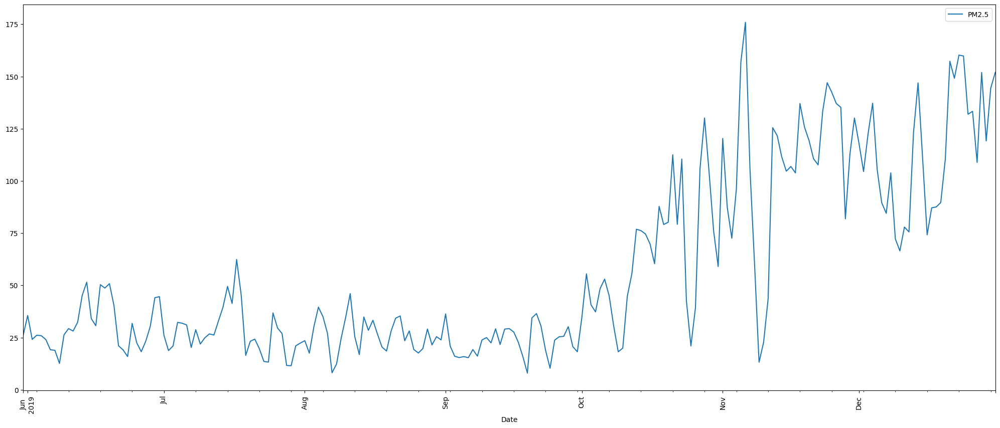

In [130]:
count = 0
for i in range(len(fort_william_2019)):
    if (PM25(fort_william_2019["PM2.5"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of PM2.5 in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["PM2.5"].loc[fort_william_2019['PM2.5'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['PM2.5'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["PM2.5"].loc[fort_william_2019['PM2.5'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['PM2.5'].idxmin()])[:10],
       "\nThe average PM2.5 value was ",str(round(fort_william_2019["PM2.5"].mean(),2)),
       "\nPM2.5 value had a standard deviation of ",str(round(fort_william_2019["PM2.5"].std(),2)),
       '.\nIn 2019 the number of days PM2.5 was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")

a = fort_william_2019.plot(x='Date',y='PM2.5',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### PM2.5 2020

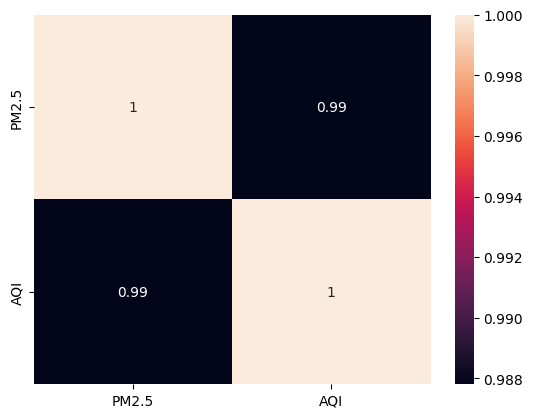

In [131]:
dataplot = sb.heatmap(fort_william_2020[['PM2.5','AQI']].corr(), annot=True)
plt.show()

The highest value of PM2.5 in the 366 days time period was  200.82  recorded on 2020-01-15 
and the lowest value was  6.36  recorded on 2020-08-27 
The average PM2.5 value was  49.89 
PM2.5 value had a standard deviation of  44.21 
In 2020 the number of days PM2.5 was responsible for the AQI value was:- 129 which is around 35.25%


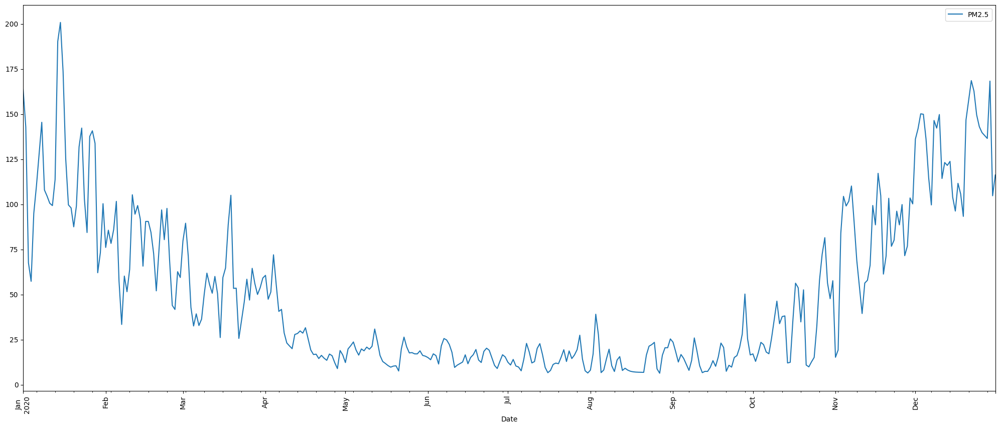

In [132]:
count = 0
for i in range(len(fort_william_2020)):
    if (PM25(fort_william_2020["PM2.5"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of PM2.5 in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["PM2.5"].loc[fort_william_2020['PM2.5'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['PM2.5'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["PM2.5"].loc[fort_william_2020['PM2.5'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['PM2.5'].idxmin()])[:10],
       "\nThe average PM2.5 value was ",str(round(fort_william_2020["PM2.5"].mean(),2)),
       "\nPM2.5 value had a standard deviation of ",str(round(fort_william_2020["PM2.5"].std(),2)),
       "\nIn 2020 the number of days PM2.5 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='PM2.5',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### PM2.5 2021

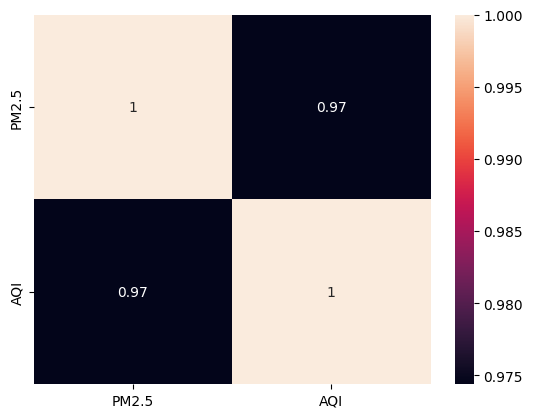

In [133]:
dataplot = sb.heatmap(fort_william_2021[['PM2.5','AQI']].corr(), annot=True)
plt.show()

The highest value of PM2.5 in the 365 days time period was  148.43  recorded on 2021-02-10 
and the lowest value was  3.35  recorded on 2021-05-04 
The average PM2.5 value was  54.28 
PM2.5 value had a standard deviation of  36.58 
In 2021 the number of days PM2.5 was responsible for the AQI value was:- 214 which is around 58.63%


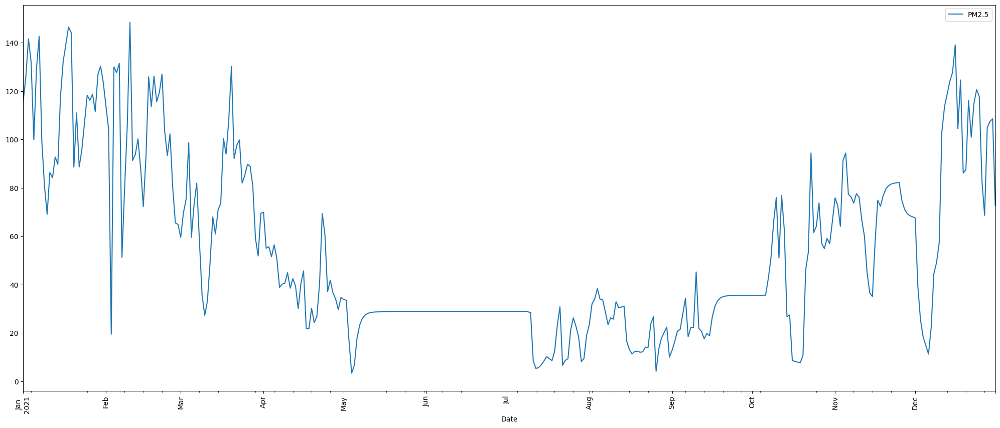

In [134]:
count = 0
for i in range(len(fort_william_2021)):
    if (PM25(fort_william_2021["PM2.5"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of PM2.5 in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["PM2.5"].loc[fort_william_2021['PM2.5'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['PM2.5'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["PM2.5"].loc[fort_william_2021['PM2.5'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['PM2.5'].idxmin()])[:10],
       "\nThe average PM2.5 value was ",str(round(fort_william_2021["PM2.5"].mean(),2)),
       "\nPM2.5 value had a standard deviation of ",str(round(fort_william_2021["PM2.5"].std(),2)),
       "\nIn 2021 the number of days PM2.5 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='PM2.5',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### PM2.5 2022

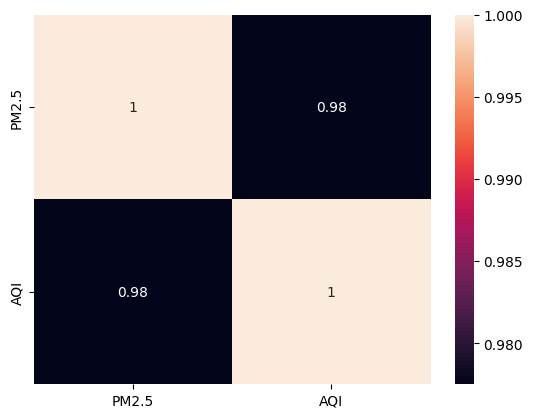

In [135]:
dataplot = sb.heatmap(fort_william_2022[['PM2.5','AQI']].corr(), annot=True)
plt.show()

The highest value of PM2.5 in the 365 days time period was  140.31  recorded on 2022-01-21 
and the lowest value was  5.65  recorded on 2022-10-04 
The average PM2.5 value was  42.18 
PM2.5 value had a standard deviation of  30.43 
In 2022 the number of days PM2.5 was responsible for the AQI value was:- 93 which is around 25.48%


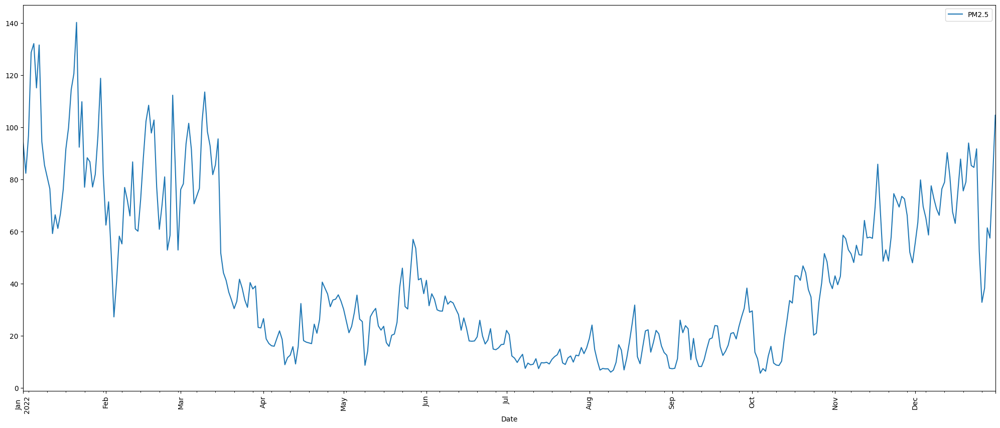

In [136]:
count = 0
for i in range(len(fort_william_2022)):
    if (PM25(fort_william_2022["PM2.5"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of PM2.5 in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["PM2.5"].loc[fort_william_2022['PM2.5'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['PM2.5'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["PM2.5"].loc[fort_william_2022['PM2.5'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['PM2.5'].idxmin()])[:10],
       "\nThe average PM2.5 value was ",str(round(fort_william_2022["PM2.5"].mean(),2)),
       "\nPM2.5 value had a standard deviation of ",str(round(fort_william_2022["PM2.5"].std(),2)),
       "\nIn 2022 the number of days PM2.5 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='PM2.5',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

### Particulate Matter 10 (PM 10)

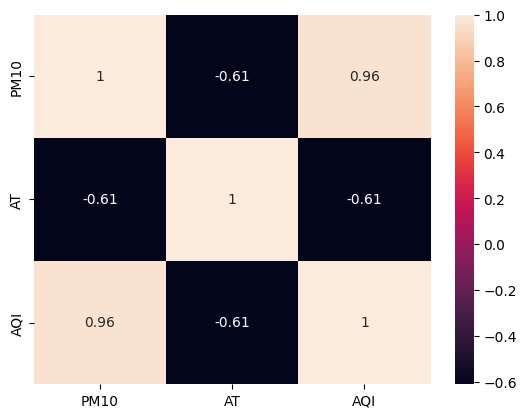

In [137]:
dataplot = sb.heatmap(fort_william[['PM10','AT','AQI']].corr(), annot=True)
plt.show()

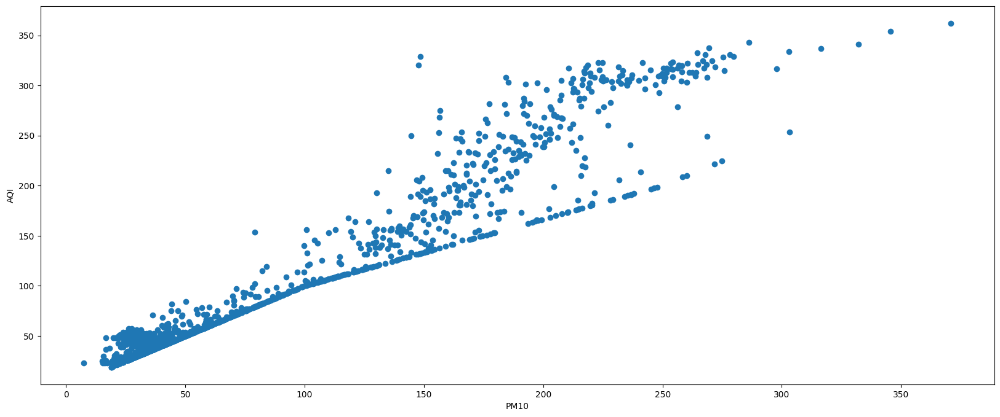

In [138]:
plt.figure(figsize=(20,8))
plt.scatter(x=fort_william['PM10'],y=fort_william['AQI'])
plt.xlabel("PM10")
plt.ylabel("AQI")
plt.show()

The highest value of PM 10 in the 1311 days time period was  370.86  recorded on 2020-01-15 
and the lowest value was  7.41  recorded on 2020-07-16 
The average PM10 value was  96.43 
PM10 value had a standard deviation of  73.17 .
The number of days PM10 was responsible for the AQI value was:- 606 which is around 46.22%


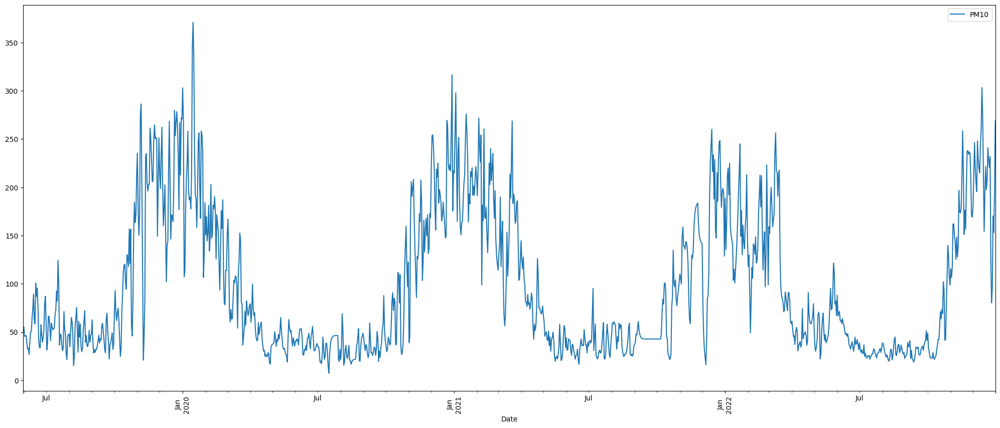

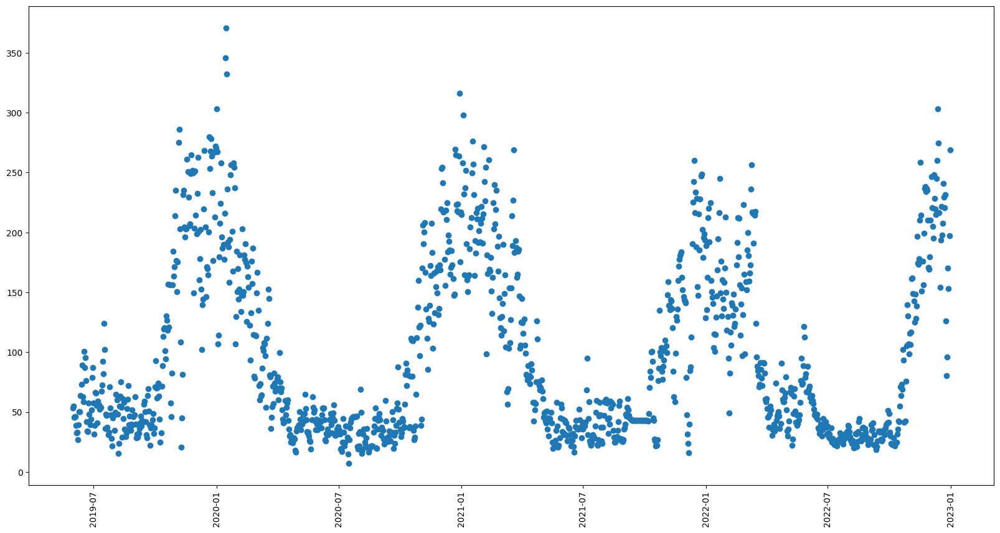

In [139]:
count = 0
for i in range(len(fort_william)):
    if (PM10(fort_william["PM10"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of PM 10 in the "+str(len(fort_william))+
       " days time period was ",fort_william["PM10"].loc[fort_william['PM10'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['PM10'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["PM10"].loc[fort_william['PM10'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['PM10'].idxmin()])[:10],
       "\nThe average PM10 value was ",str(round(fort_william["PM10"].mean(),2)),
       "\nPM10 value had a standard deviation of ",str(round(fort_william["PM10"].std(),2)),
       '.\nThe number of days PM10 was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='PM10',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['PM10'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of PM10

##### PM10 2019

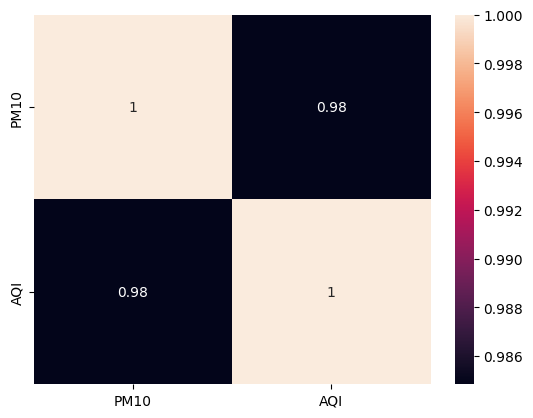

In [140]:
dataplot = sb.heatmap(fort_william_2019[['PM10','AQI']].corr(), annot=True)
plt.show()

The highest value of PM10 in the 215 days time period was  286.28  recorded on 2019-11-06 
and the lowest value was  15.39  recorded on 2019-08-07 
The average PM10 value was  102.0 
PM10 value had a standard deviation of  77.92 
In 2019 the number of days PM10 was responsible for the AQI value was:- 108 which is around 50.23%


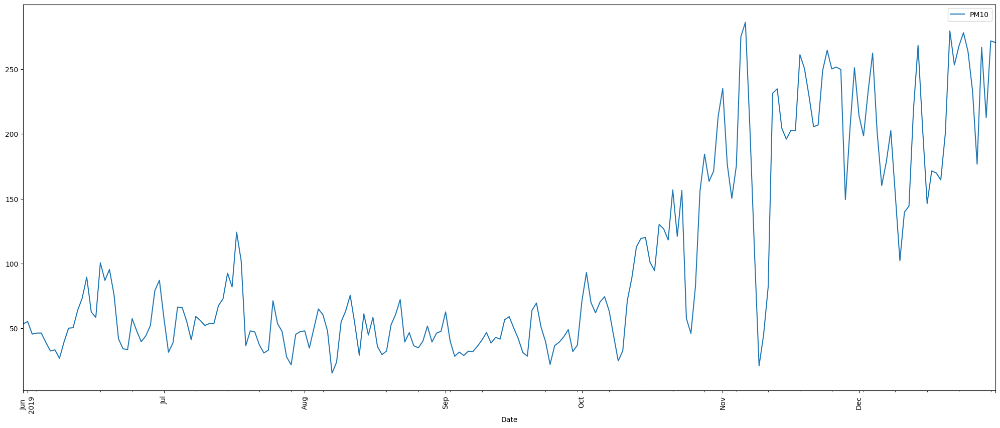

In [141]:
count = 0
for i in range(len(fort_william_2019)):
    if (PM10(fort_william_2019["PM10"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of PM10 in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["PM10"].loc[fort_william_2019['PM10'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['PM10'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["PM10"].loc[fort_william_2019['PM10'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['PM10'].idxmin()])[:10],
       "\nThe average PM10 value was ",str(round(fort_william_2019["PM10"].mean(),2)),
       "\nPM10 value had a standard deviation of ",str(round(fort_william_2019["PM10"].std(),2)),
       "\nIn 2019 the number of days PM10 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2019.plot(x='Date',y='PM10',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### PM10 2020

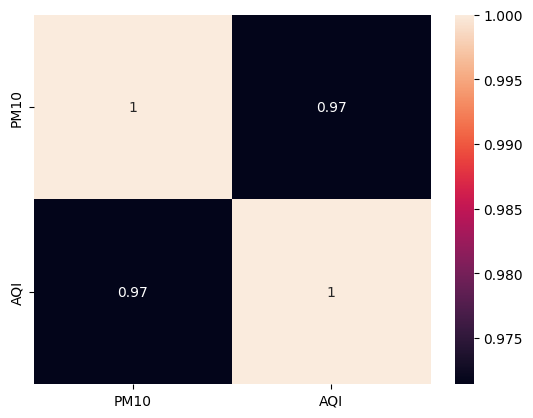

In [142]:
dataplot = sb.heatmap(fort_william_2020[['PM10','AQI']].corr(), annot=True)
plt.show()

The highest value of PM10 in the 366 days time period was  370.86  recorded on 2020-01-15 
and the lowest value was  7.41  recorded on 2020-07-16 
The average PM10 value was  92.65 
PM10 value had a standard deviation of  74.0 
In 2020 the number of days PM10 was responsible for the AQI value was:- 191 which is around 52.19%


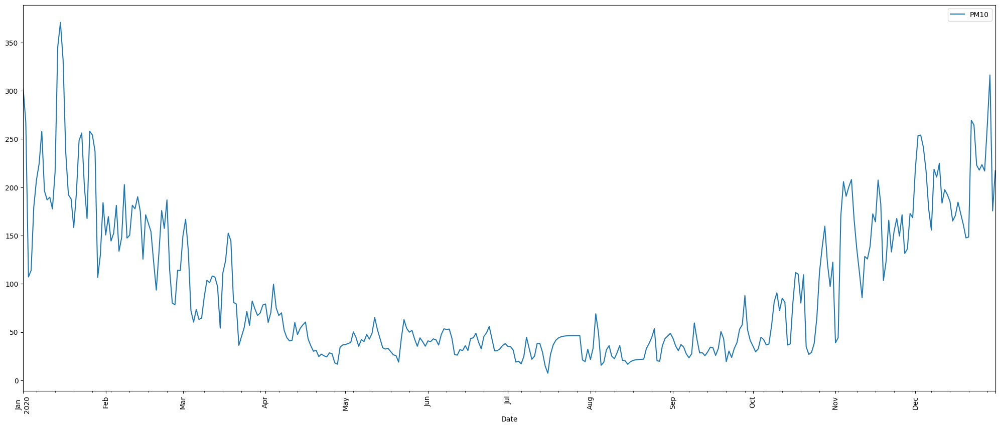

In [143]:
count = 0
for i in range(len(fort_william_2020)):
    if (PM10(fort_william_2020["PM10"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of PM10 in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["PM10"].loc[fort_william_2020['PM10'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['PM10'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["PM10"].loc[fort_william_2020['PM10'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['PM10'].idxmin()])[:10],
       "\nThe average PM10 value was ",str(round(fort_william_2020["PM10"].mean(),2)),
       "\nPM10 value had a standard deviation of ",str(round(fort_william_2020["PM10"].std(),2)),
       "\nIn 2020 the number of days PM10 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='PM10',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### PM10 2021

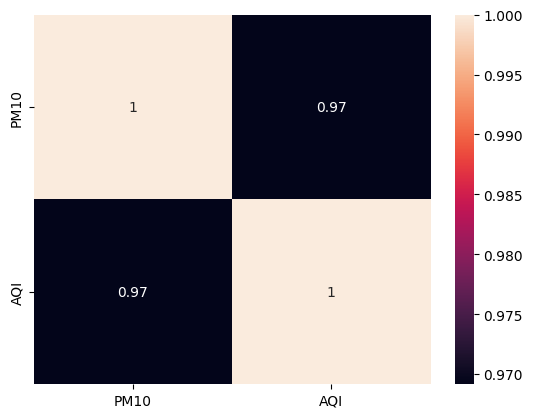

In [144]:
dataplot = sb.heatmap(fort_william_2021[['PM10','AQI']].corr(), annot=True)
plt.show()

The highest value of PM10 in the 365 days time period was  297.8  recorded on 2021-01-03 
and the lowest value was  16.21  recorded on 2021-12-06 
The average PM10 value was  99.25 
PM10 value had a standard deviation of  71.48 
In 2021 the number of days PM10 was responsible for the AQI value was:- 100 which is around 27.4%


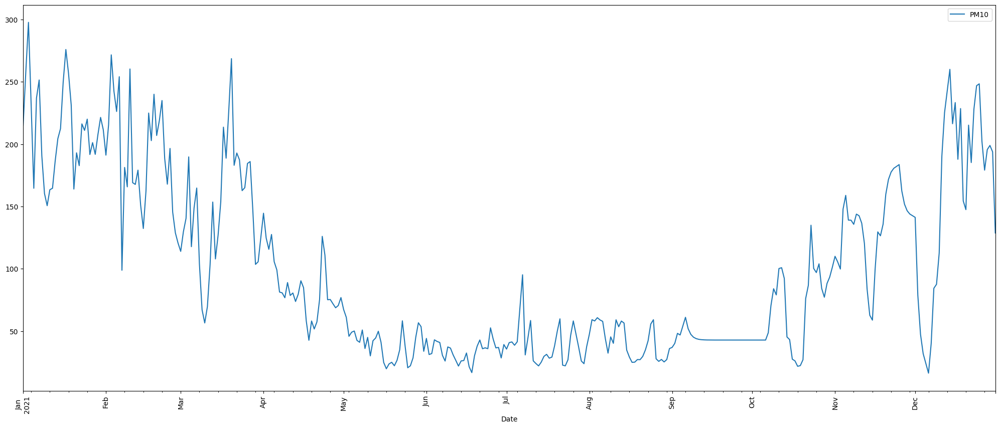

In [145]:
count = 0
for i in range(len(fort_william_2021)):
    if (PM10(fort_william_2021["PM10"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of PM10 in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["PM10"].loc[fort_william_2021['PM10'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['PM10'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["PM10"].loc[fort_william_2021['PM10'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['PM10'].idxmin()])[:10],
       "\nThe average PM10 value was ",str(round(fort_william_2021["PM10"].mean(),2)),
       "\nPM10 value had a standard deviation of ",str(round(fort_william_2021["PM10"].std(),2)),
       "\nIn 2021 the number of days PM10 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='PM10',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### PM10 2022

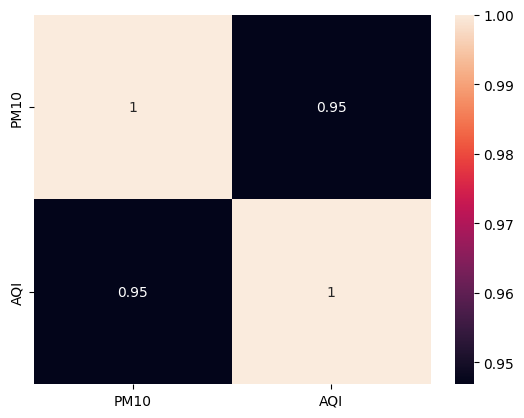

In [146]:
dataplot = sb.heatmap(fort_william_2022[['PM10','AQI']].corr(), annot=True)
plt.show()

The highest value of PM10 in the 365 days time period was  303.26  recorded on 2022-12-13 
and the lowest value was  18.87  recorded on 2022-09-12 
The average PM10 value was  94.11 
PM10 value had a standard deviation of  71.08 
In 2022 the number of days PM10 was responsible for the AQI value was:- 207 which is around 56.71%


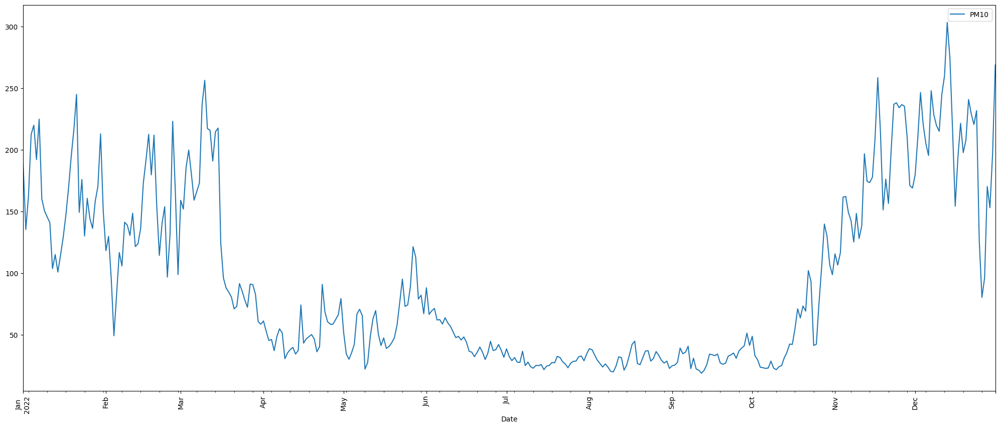

In [147]:
count = 0
for i in range(len(fort_william_2022)):
    if (PM10(fort_william_2022["PM10"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of PM10 in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["PM10"].loc[fort_william_2022['PM10'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['PM10'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["PM10"].loc[fort_william_2022['PM10'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['PM10'].idxmin()])[:10],
       "\nThe average PM10 value was ",str(round(fort_william_2022["PM10"].mean(),2)),
       "\nPM10 value had a standard deviation of ",str(round(fort_william_2022["PM10"].std(),2)),
       "\nIn 2022 the number of days PM10 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='PM10',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

### Nitrogen Dioxide (NO2)

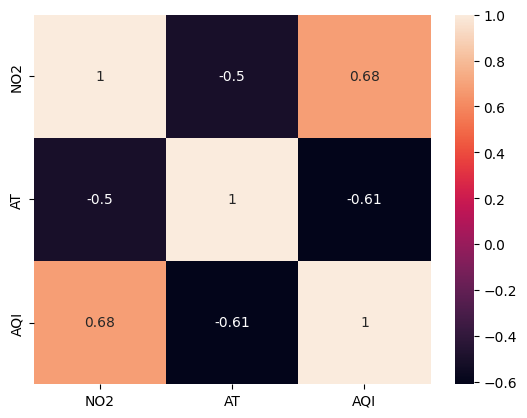

In [148]:
dataplot = sb.heatmap(fort_william[['NO2','AT','AQI']].corr(), annot=True)
plt.show()

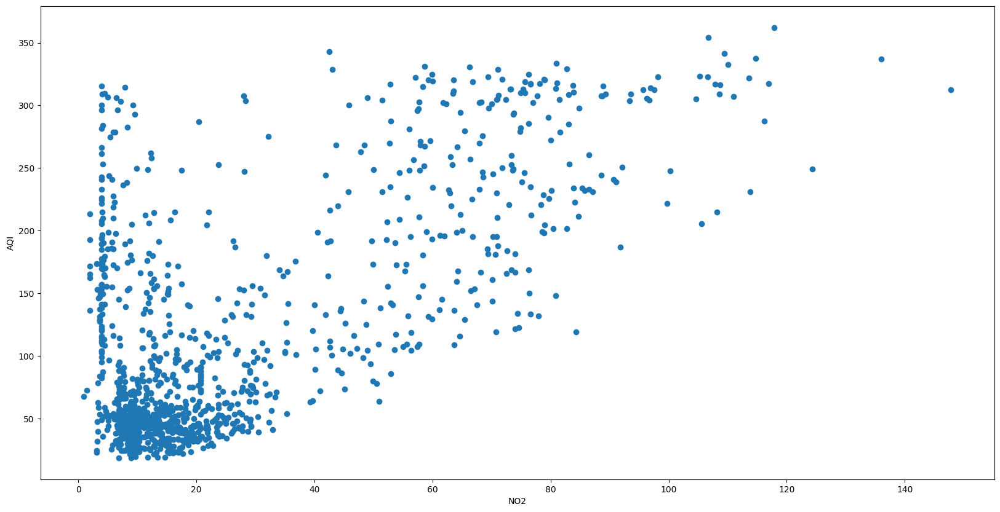

In [149]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william['NO2'],y=fort_william['AQI'])
plt.xlabel("NO2")
plt.ylabel("AQI")
plt.show()

The highest value of NO2 in the 1311 days time period was  147.81  recorded on 2020-12-28 
and the lowest value was  0.94  recorded on 2019-07-13 
The average NO2 value was  25.14 
NO2 value had a standard deviation of  25.62 .
The number of days NO2 was responsible for the AQI value was:- 6 which is around 0.46%


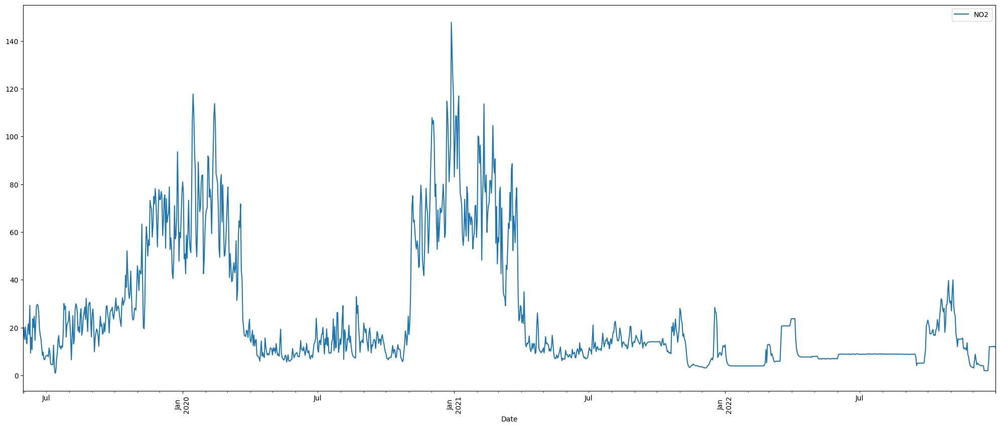

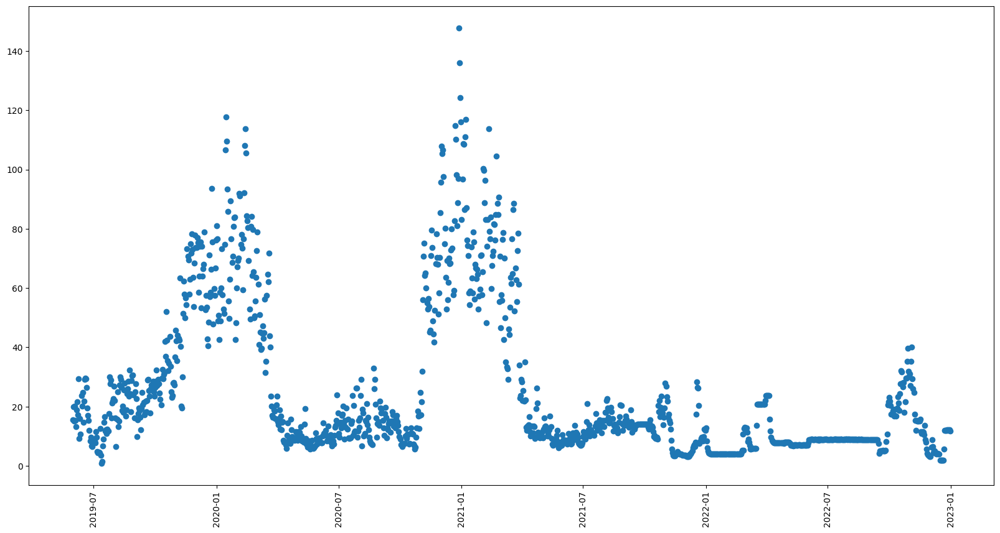

In [150]:
count = 0
for i in range(len(fort_william)):
    if (NO2(fort_william["NO2"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of NO2 in the "+str(len(fort_william))+
       " days time period was ",fort_william["NO2"].loc[fort_william['NO2'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['NO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["NO2"].loc[fort_william['NO2'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['NO2'].idxmin()])[:10],
       "\nThe average NO2 value was ",str(round(fort_william["NO2"].mean(),2)),
       "\nNO2 value had a standard deviation of ",str(round(fort_william["NO2"].std(),2)),
       '.\nThe number of days NO2 was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='NO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['NO2'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of NO2

##### NO2 2019

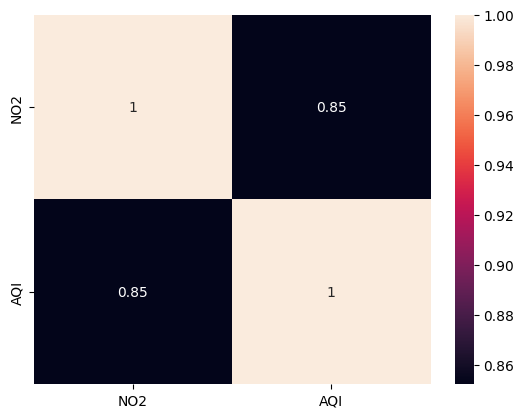

In [151]:
dataplot = sb.heatmap(fort_william_2019[['NO2','AQI']].corr(), annot=True)
plt.show()

The highest value of NO2 in the 215 days time period was  93.6  recorded on 2019-12-25 
and the lowest value was  0.94  recorded on 2019-07-13 
The average NO2 value was  32.15 
NO2 value had a standard deviation of  20.73 
In 2019 the number of days NO2 was responsible for the AQI value was:- 3 which is around 1.4%


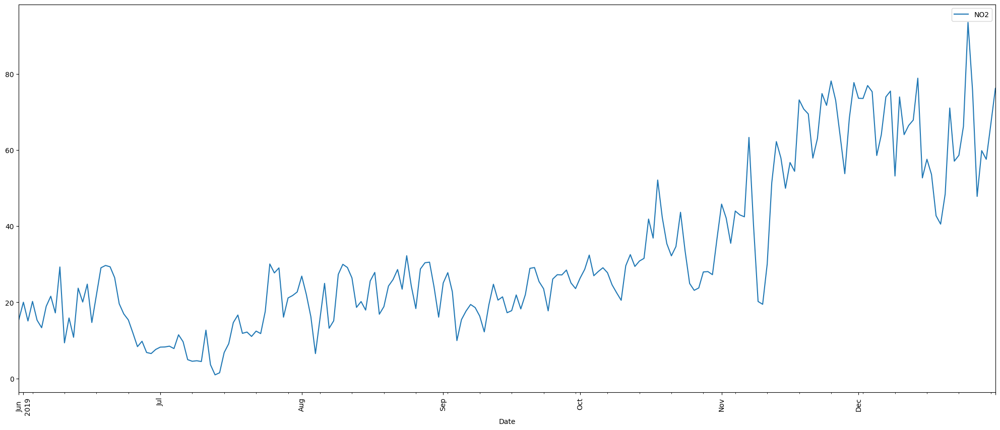

In [152]:
count = 0
for i in range(len(fort_william_2019)):
    if (NO2(fort_william_2019["NO2"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of NO2 in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["NO2"].loc[fort_william_2019['NO2'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['NO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["NO2"].loc[fort_william_2019['NO2'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['NO2'].idxmin()])[:10],
       "\nThe average NO2 value was ",str(round(fort_william_2019["NO2"].mean(),2)),
       "\nNO2 value had a standard deviation of ",str(round(fort_william_2019["NO2"].std(),2)),
       "\nIn 2019 the number of days NO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2019.plot(x='Date',y='NO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### NO2 2020

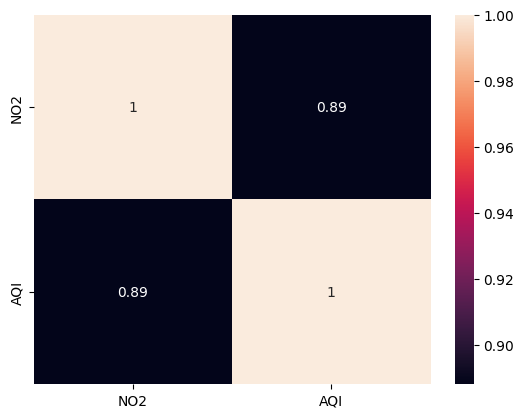

In [153]:
dataplot = sb.heatmap(fort_william_2020[['NO2','AQI']].corr(), annot=True)
plt.show()

The highest value of NO2 in the 366 days time period was  147.81  recorded on 2020-12-28 
and the lowest value was  5.61  recorded on 2020-05-20 
The average NO2 value was  34.72 
NO2 value had a standard deviation of  31.36 
In 2020 the number of days NO2 was responsible for the AQI value was:- 3 which is around 0.82%


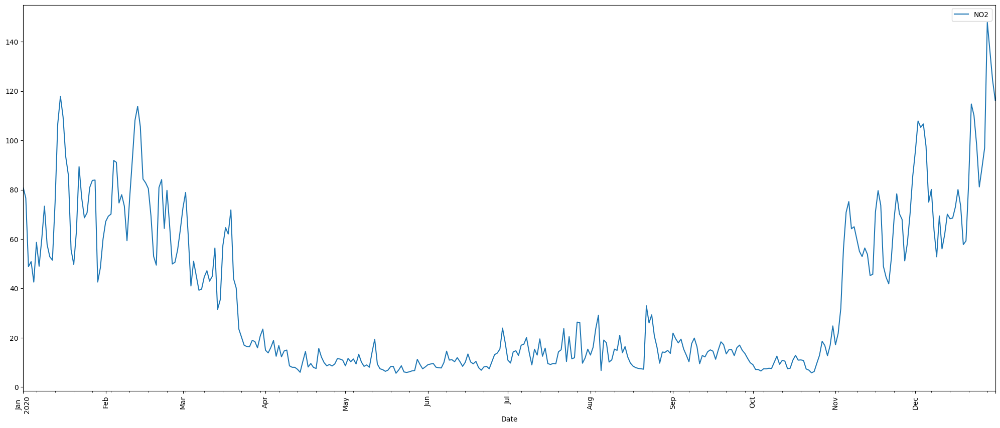

In [154]:
count = 0
for i in range(len(fort_william_2020)):
    if (NO2(fort_william_2020["NO2"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of NO2 in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["NO2"].loc[fort_william_2020['NO2'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['NO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["NO2"].loc[fort_william_2020['NO2'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['NO2'].idxmin()])[:10],
       "\nThe average NO2 value was ",str(round(fort_william_2020["NO2"].mean(),2)),
       "\nNO2 value had a standard deviation of ",str(round(fort_william_2020["NO2"].std(),2)),
       "\nIn 2020 the number of days NO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='NO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### NO2 2021

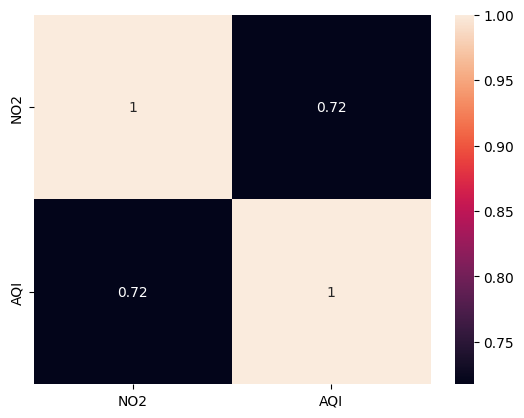

In [155]:
dataplot = sb.heatmap(fort_william_2021[['NO2','AQI']].corr(), annot=True)
plt.show()

The highest value of NO2 in the 365 days time period was  116.98  recorded on 2021-01-07 
and the lowest value was  3.13  recorded on 2021-12-06 
The average NO2 value was  26.3 
NO2 value had a standard deviation of  27.02 
In 2021 the number of days NO2 was responsible for the AQI value was:- 0 which is around 0.0%


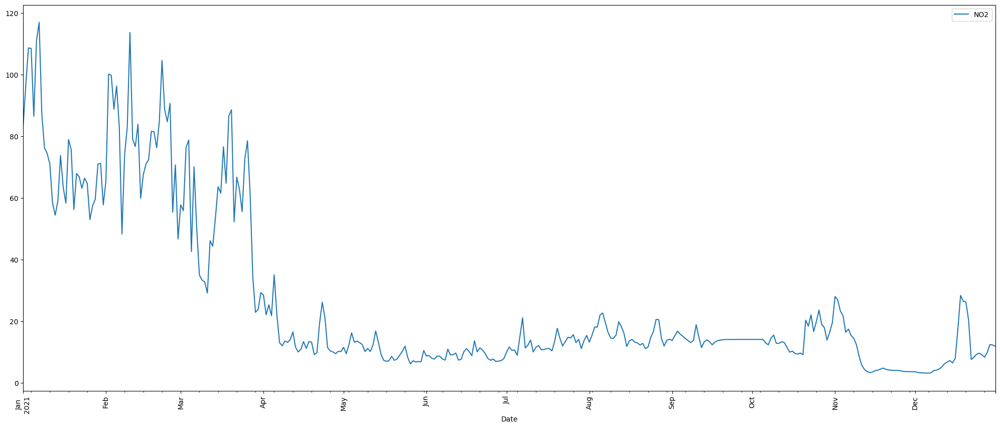

In [156]:
count = 0
for i in range(len(fort_william_2021)):
    if (NO2(fort_william_2021["NO2"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of NO2 in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["NO2"].loc[fort_william_2021['NO2'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['NO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["NO2"].loc[fort_william_2021['NO2'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['NO2'].idxmin()])[:10],
       "\nThe average NO2 value was ",str(round(fort_william_2021["NO2"].mean(),2)),
       "\nNO2 value had a standard deviation of ",str(round(fort_william_2021["NO2"].std(),2)),
       "\nIn 2021 the number of days NO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='NO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### NO2 2022

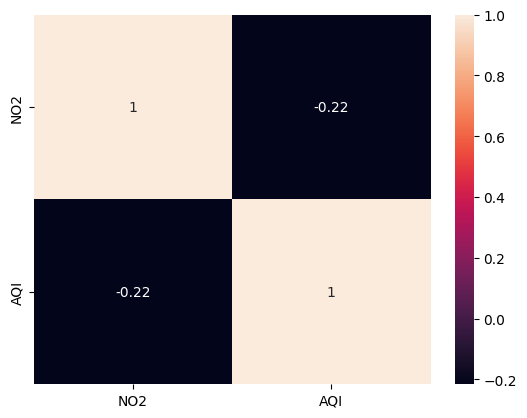

In [157]:
dataplot = sb.heatmap(fort_william_2022[['NO2','AQI']].corr(), annot=True)
plt.show()

The highest value of NO2 in the 365 days time period was  40.01  recorded on 2022-11-04 
and the lowest value was  1.96  recorded on 2022-12-17 
The average NO2 value was  10.24 
NO2 value had a standard deviation of  6.94 
In 2022 the number of days NO2 was responsible for the AQI value was:- 0 which is around 0.0%


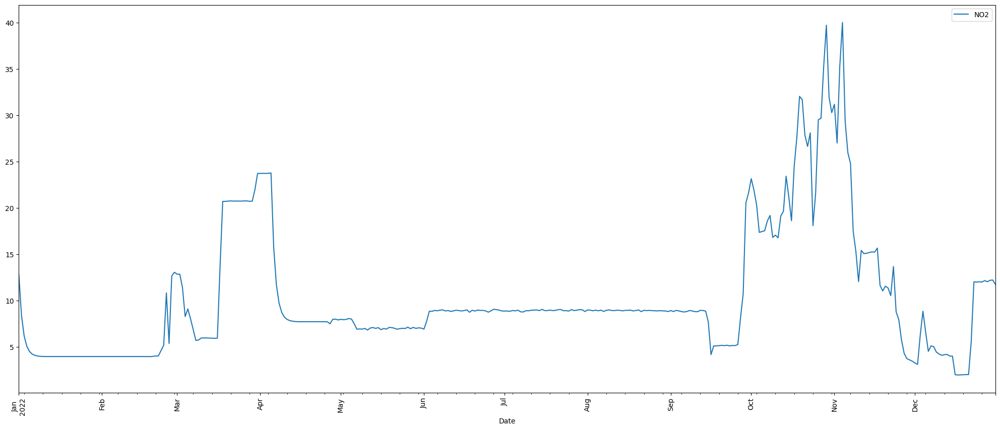

In [158]:
count = 0
for i in range(len(fort_william_2022)):
    if (NO2(fort_william_2022["NO2"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of NO2 in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["NO2"].loc[fort_william_2022['NO2'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['NO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["NO2"].loc[fort_william_2022['NO2'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['NO2'].idxmin()])[:10],
       "\nThe average NO2 value was ",str(round(fort_william_2022["NO2"].mean(),2)),
       "\nNO2 value had a standard deviation of ",str(round(fort_william_2022["NO2"].std(),2)),
       "\nIn 2022 the number of days NO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='NO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

### Ammonia (NH3)

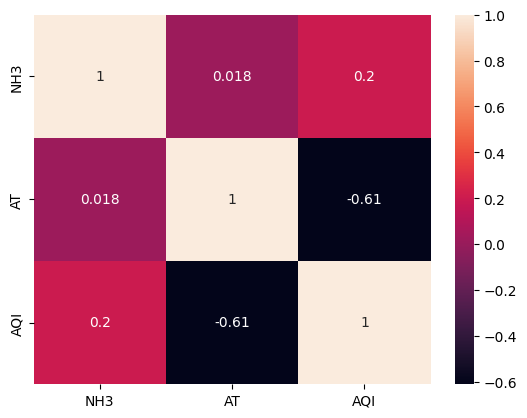

In [159]:
dataplot = sb.heatmap(fort_william[['NH3','AT','AQI']].corr(), annot=True)
plt.show()

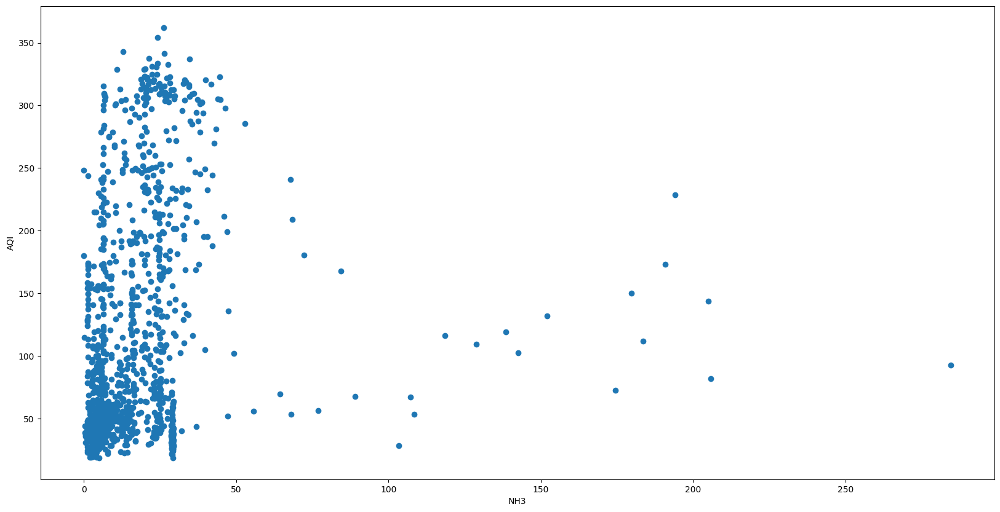

In [160]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william['NH3'],y=fort_william['AQI'])
plt.xlabel("NH3")
plt.ylabel("AQI")
plt.show()

The highest value of NH3 in the 1311 days time period was  284.6  recorded on 2019-07-15 
and the lowest value was  0.01  recorded on 2020-11-04 
The average NH3 value was  16.61 
NH3 value had a standard deviation of  20.69 .
The number of days NH3 was responsible for the AQI value was:- 0 which is around 0.0%


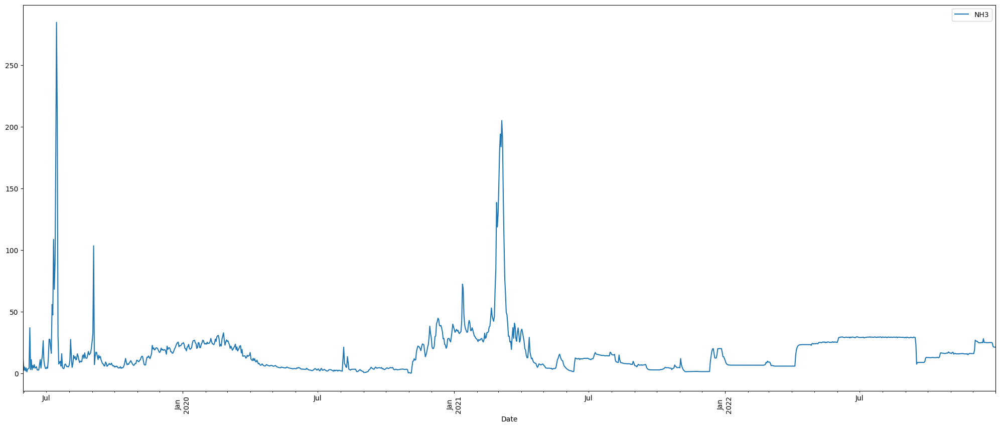

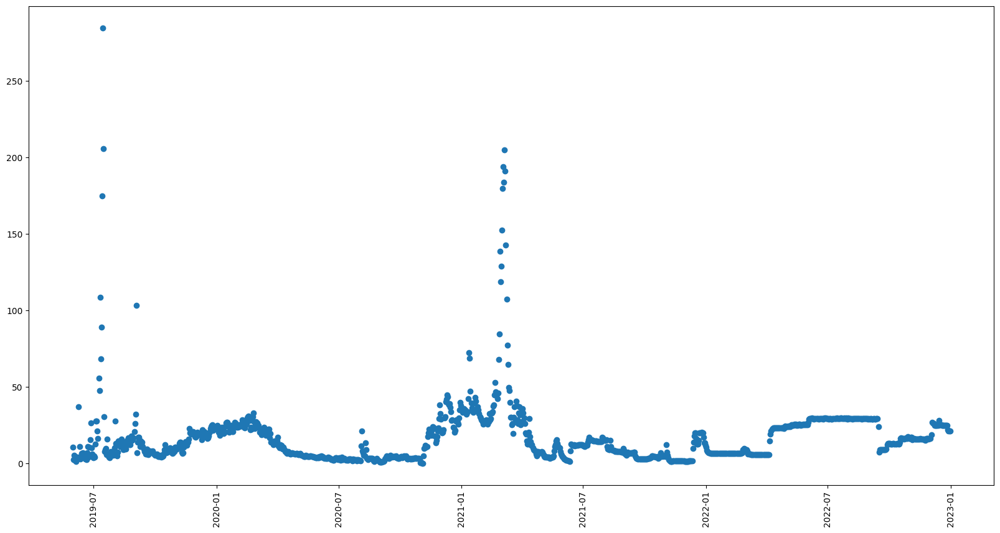

In [161]:
count = 0
for i in range(len(fort_william)):
    if (NH3(fort_william["NH3"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of NH3 in the "+str(len(fort_william))+
       " days time period was ",fort_william["NH3"].loc[fort_william['NH3'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['NH3'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["NH3"].loc[fort_william['NH3'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['NH3'].idxmin()])[:10],
       "\nThe average NH3 value was ",str(round(fort_william["NH3"].mean(),2)),
       "\nNH3 value had a standard deviation of ",str(round(fort_william["NH3"].std(),2)),
       '.\nThe number of days NH3 was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='NH3',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['NH3'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of NH3

##### NH3 2019

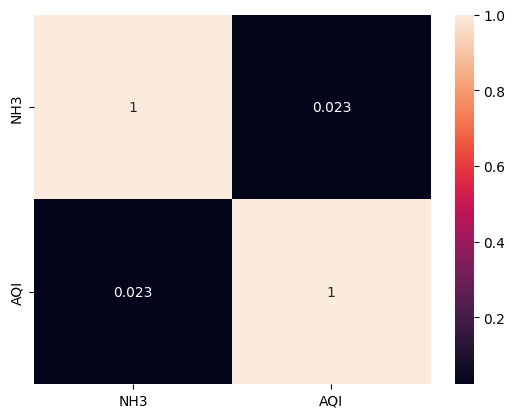

In [162]:
dataplot = sb.heatmap(fort_william_2019[['NH3','AQI']].corr(), annot=True)
plt.show()

The highest value of NH3 in the 215 days time period was  284.6  recorded on 2019-07-15 
and the lowest value was  1.06  recorded on 2019-06-05 
The average NH3 value was  16.61 
NH3 value had a standard deviation of  28.45 
In 2019 the number of days NH3 was responsible for the AQI value was:- 0 which is around 0.0%


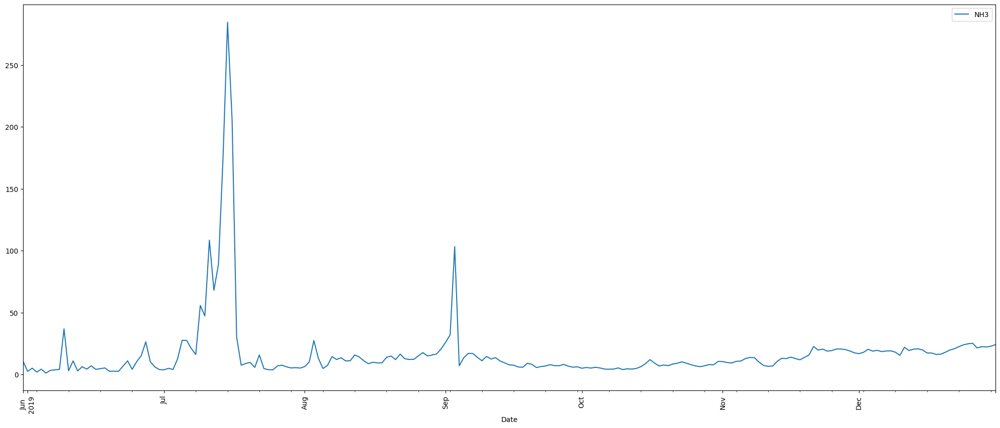

In [163]:
count = 0
for i in range(len(fort_william_2019)):
    if (NH3(fort_william_2019["NH3"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of NH3 in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["NH3"].loc[fort_william_2019['NH3'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['NH3'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["NH3"].loc[fort_william_2019['NH3'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['NH3'].idxmin()])[:10],
       "\nThe average NH3 value was ",str(round(fort_william_2019["NH3"].mean(),2)),
       "\nNH3 value had a standard deviation of ",str(round(fort_william_2019["NH3"].std(),2)),
       "\nIn 2019 the number of days NH3 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2019.plot(x='Date',y='NH3',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### NH3 2020

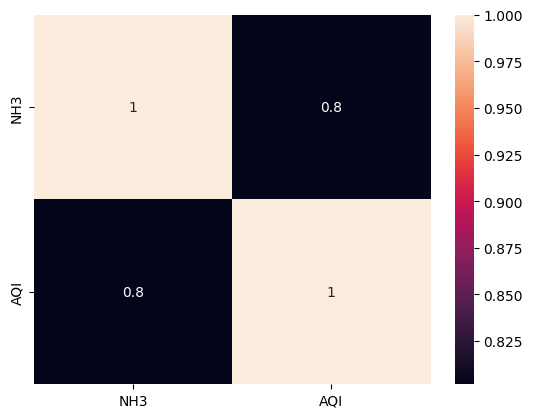

In [164]:
dataplot = sb.heatmap(fort_william_2020[['NH3','AQI']].corr(), annot=True)
plt.show()

The highest value of NH3 in the 366 days time period was  44.58  recorded on 2020-12-10 
and the lowest value was  0.01  recorded on 2020-11-04 
The average NH3 value was  11.98 
NH3 value had a standard deviation of  10.72 
In 2020 the number of days NH3 was responsible for the AQI value was:- 0 which is around 0.0%


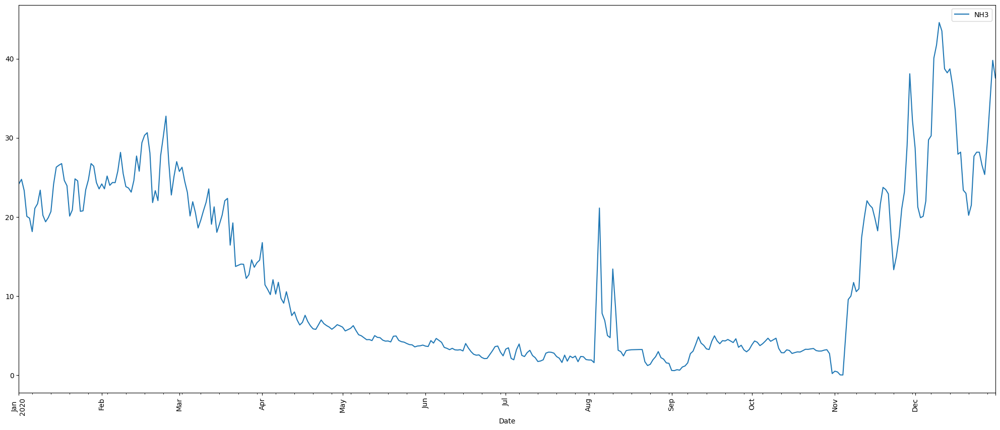

In [165]:
count = 0
for i in range(len(fort_william_2020)):
    if (NH3(fort_william_2020["NH3"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of NH3 in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["NH3"].loc[fort_william_2020['NH3'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['NH3'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["NH3"].loc[fort_william_2020['NH3'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['NH3'].idxmin()])[:10],
       "\nThe average NH3 value was ",str(round(fort_william_2020["NH3"].mean(),2)),
       "\nNH3 value had a standard deviation of ",str(round(fort_william_2020["NH3"].std(),2)),
       "\nIn 2020 the number of days NH3 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='NH3',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### NH3 2021

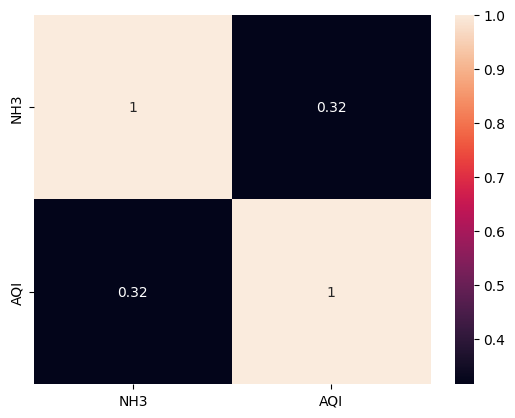

In [166]:
dataplot = sb.heatmap(fort_william_2021[['NH3','AQI']].corr(), annot=True)
plt.show()

The highest value of NH3 in the 365 days time period was  204.93  recorded on 2021-03-06 
and the lowest value was  1.15  recorded on 2021-11-09 
The average NH3 value was  19.05 
NH3 value had a standard deviation of  28.87 
In 2021 the number of days NH3 was responsible for the AQI value was:- 0 which is around 0.0%


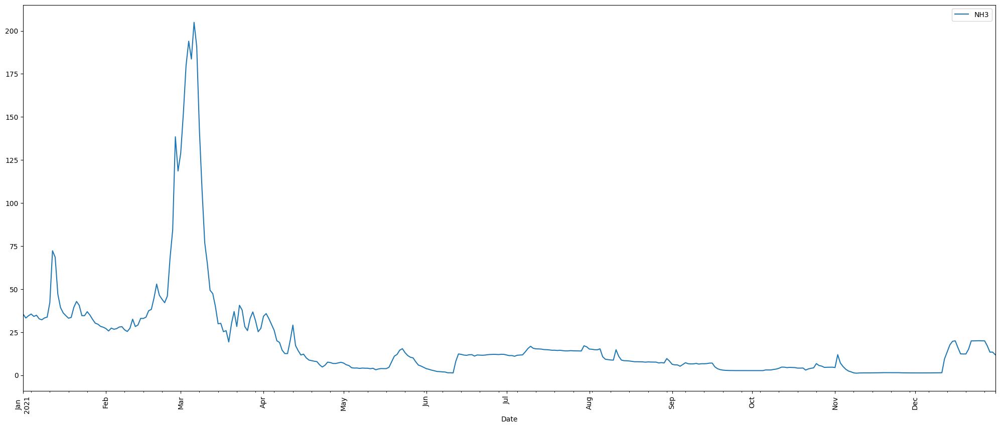

In [167]:
count = 0
for i in range(len(fort_william_2021)):
    if (NH3(fort_william_2021["NH3"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of NH3 in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["NH3"].loc[fort_william_2021['NH3'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['NH3'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["NH3"].loc[fort_william_2021['NH3'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['NH3'].idxmin()])[:10],
       "\nThe average NH3 value was ",str(round(fort_william_2021["NH3"].mean(),2)),
       "\nNH3 value had a standard deviation of ",str(round(fort_william_2021["NH3"].std(),2)),
       "\nIn 2021 the number of days NH3 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='NH3',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### NH3 2022

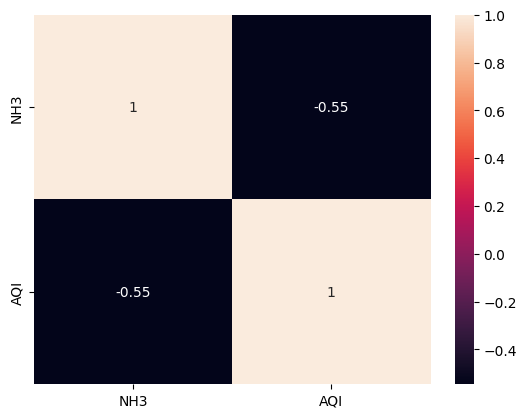

In [168]:
dataplot = sb.heatmap(fort_william_2022[['NH3','AQI']].corr(), annot=True)
plt.show()

The highest value of NH3 in the 365 days time period was  29.51  recorded on 2022-06-27 
and the lowest value was  5.7  recorded on 2022-03-09 
The average NH3 value was  18.79 
NH3 value had a standard deviation of  9.16 
In 2022 the number of days NH3 was responsible for the AQI value was:- 0 which is around 0.0%


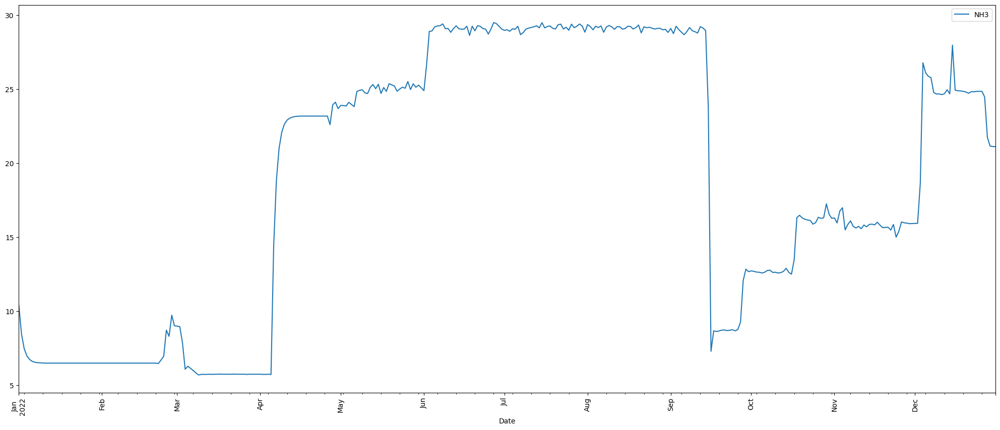

In [169]:
count = 0
for i in range(len(fort_william_2022)):
    if (NH3(fort_william_2022["NH3"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of NH3 in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["NH3"].loc[fort_william_2022['NH3'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['NH3'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["NH3"].loc[fort_william_2022['NH3'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['NH3'].idxmin()])[:10],
       "\nThe average NH3 value was ",str(round(fort_william_2022["NH3"].mean(),2)),
       "\nNH3 value had a standard deviation of ",str(round(fort_william_2022["NH3"].std(),2)),
       "\nIn 2022 the number of days NH3 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='NH3',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

### Sulfur dioxide (SO2)

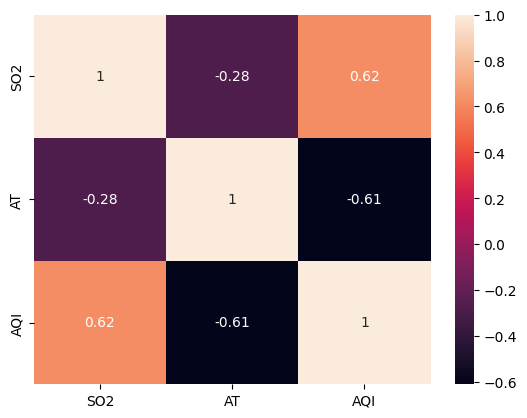

In [170]:
dataplot = sb.heatmap(fort_william[['SO2','AT','AQI']].corr(), annot=True)
plt.show()

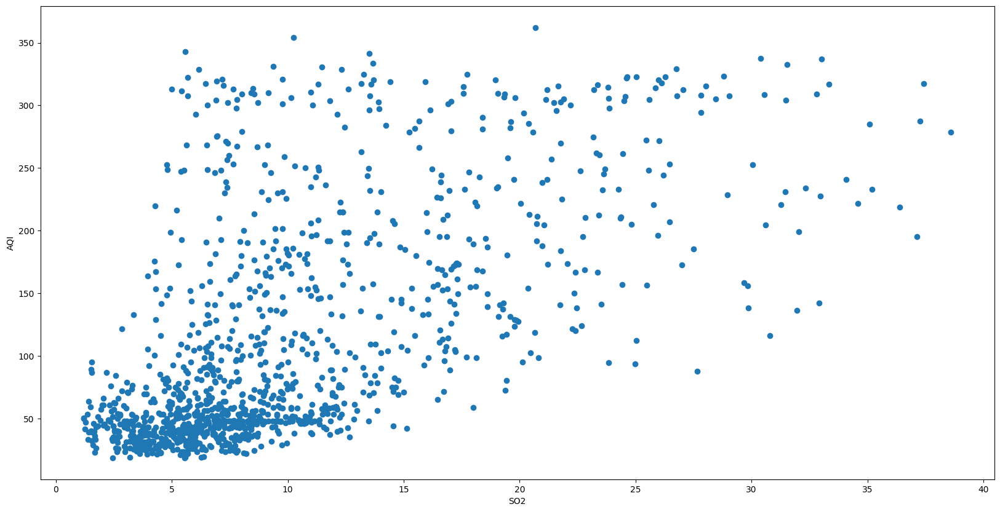

In [171]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william['SO2'],y=fort_william['AQI'])
plt.xlabel("SO2")
plt.ylabel("AQI")
plt.show()

The highest value of SO2 in the 1311 days time period was  38.6  recorded on 2022-03-10 
and the lowest value was  1.2  recorded on 2019-06-11 
The average SO2 value was  10.01 
SO2 value had a standard deviation of  6.7 .
The number of days SO2 was responsible for the AQI value was:- 0 which is around 0.0%


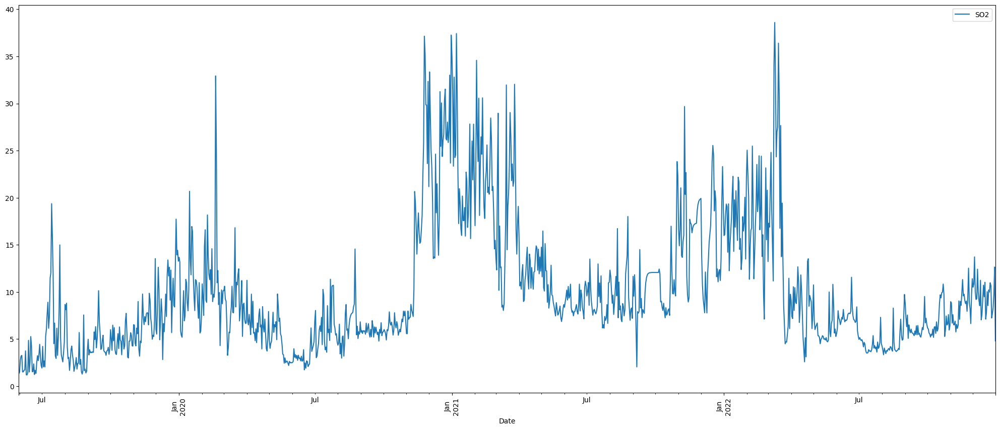

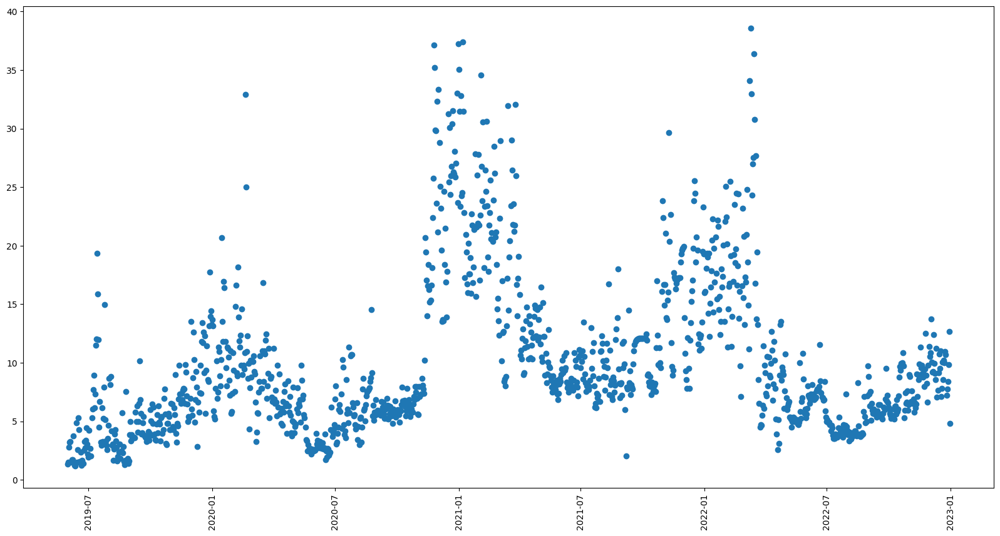

In [172]:
count = 0
for i in range(len(fort_william)):
    if (SO2(fort_william["SO2"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of SO2 in the "+str(len(fort_william))+
       " days time period was ",fort_william["SO2"].loc[fort_william['SO2'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['SO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["SO2"].loc[fort_william['SO2'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['SO2'].idxmin()])[:10],
       "\nThe average SO2 value was ",str(round(fort_william["SO2"].mean(),2)),
       "\nSO2 value had a standard deviation of ",str(round(fort_william["SO2"].std(),2)),
       '.\nThe number of days SO2 was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='SO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['SO2'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of SO2

##### SO2 2019

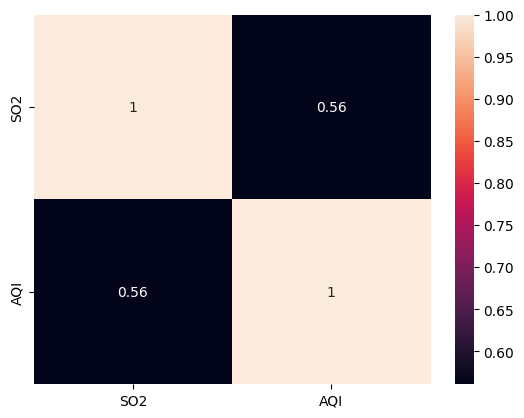

In [173]:
dataplot = sb.heatmap(fort_william_2019[['SO2','AQI']].corr(), annot=True)
plt.show()

The highest value of SO2 in the 215 days time period was  19.37  recorded on 2019-07-14 
and the lowest value was  1.2  recorded on 2019-06-11 
The average SO2 value was  5.45 
SO2 value had a standard deviation of  3.38 
In 2019 the number of days SO2 was responsible for the AQI value was:- 0 which is around 0.0%


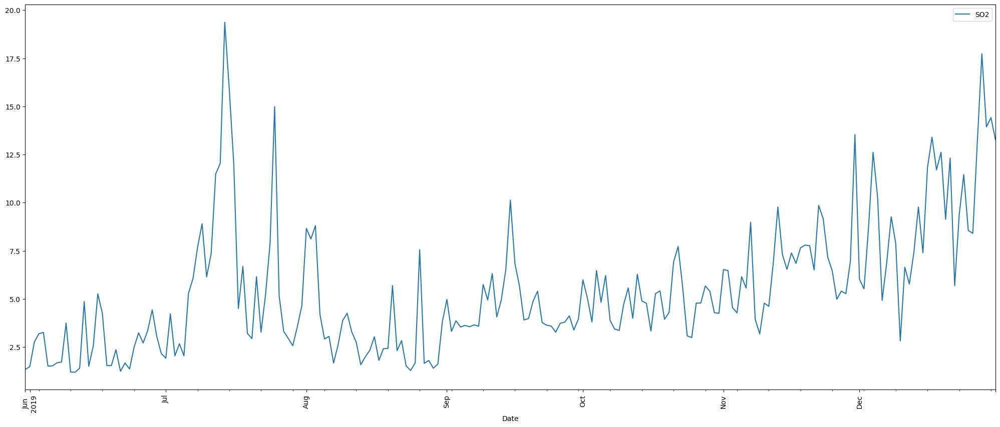

In [174]:
count = 0
for i in range(len(fort_william_2019)):
    if (SO2(fort_william_2019["SO2"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of SO2 in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["SO2"].loc[fort_william_2019['SO2'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['SO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["SO2"].loc[fort_william_2019['SO2'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['SO2'].idxmin()])[:10],
       "\nThe average SO2 value was ",str(round(fort_william_2019["SO2"].mean(),2)),
       "\nSO2 value had a standard deviation of ",str(round(fort_william_2019["SO2"].std(),2)),
       "\nIn 2019 the number of days SO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2019.plot(x='Date',y='SO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### SO2 2020

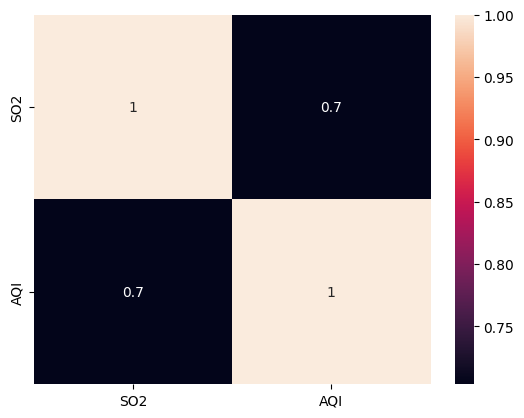

In [175]:
dataplot = sb.heatmap(fort_william_2020[['SO2','AQI']].corr(), annot=True)
plt.show()

The highest value of SO2 in the 366 days time period was  37.26  recorded on 2020-12-31 
and the lowest value was  1.74  recorded on 2020-06-17 
The average SO2 value was  9.29 
SO2 value had a standard deviation of  7.03 
In 2020 the number of days SO2 was responsible for the AQI value was:- 0 which is around 0.0%


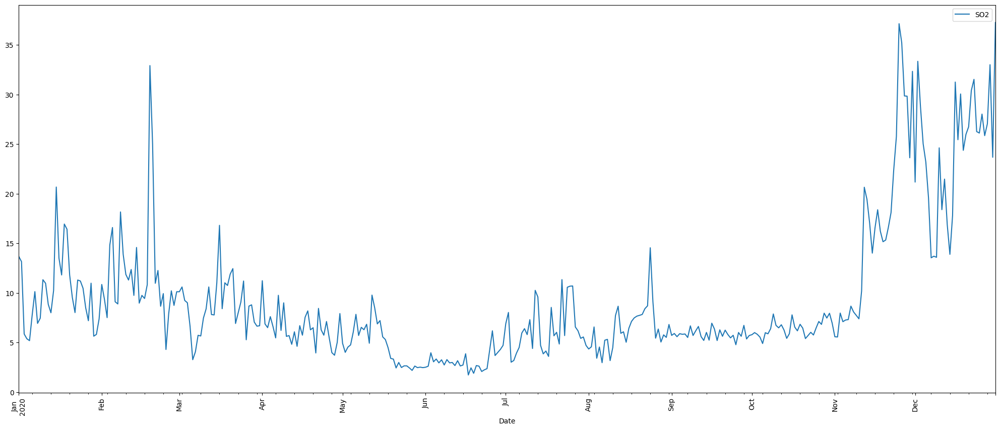

In [176]:
count = 0
for i in range(len(fort_william_2020)):
    if (SO2(fort_william_2020["SO2"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of SO2 in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["SO2"].loc[fort_william_2020['SO2'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['SO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["SO2"].loc[fort_william_2020['SO2'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['SO2'].idxmin()])[:10],
       "\nThe average SO2 value was ",str(round(fort_william_2020["SO2"].mean(),2)),
       "\nSO2 value had a standard deviation of ",str(round(fort_william_2020["SO2"].std(),2)),
       "\nIn 2020 the number of days SO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='SO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### SO2 2021

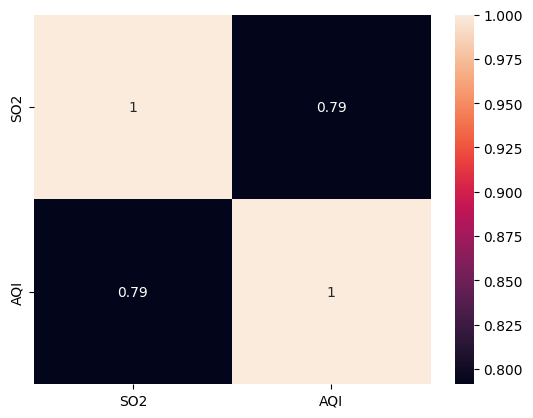

In [177]:
dataplot = sb.heatmap(fort_william_2021[['SO2','AQI']].corr(), annot=True)
plt.show()

The highest value of SO2 in the 365 days time period was  37.42  recorded on 2021-01-07 
and the lowest value was  2.05  recorded on 2021-09-06 
The average SO2 value was  13.88 
SO2 value had a standard deviation of  6.37 
In 2021 the number of days SO2 was responsible for the AQI value was:- 0 which is around 0.0%


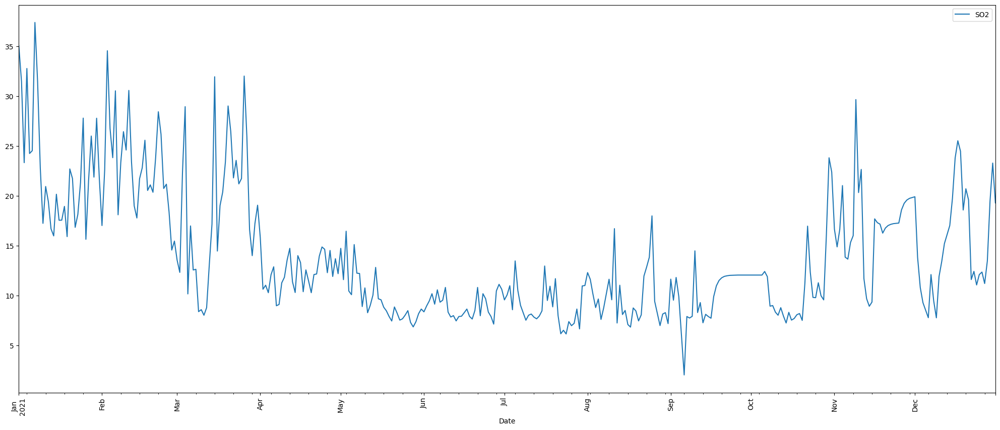

In [178]:
count = 0
for i in range(len(fort_william_2021)):
    if (SO2(fort_william_2021["SO2"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of SO2 in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["SO2"].loc[fort_william_2021['SO2'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['SO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["SO2"].loc[fort_william_2021['SO2'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['SO2'].idxmin()])[:10],
       "\nThe average SO2 value was ",str(round(fort_william_2021["SO2"].mean(),2)),
       "\nSO2 value had a standard deviation of ",str(round(fort_william_2021["SO2"].std(),2)),
       "\nIn 2021 the number of days SO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='SO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### SO2 2022

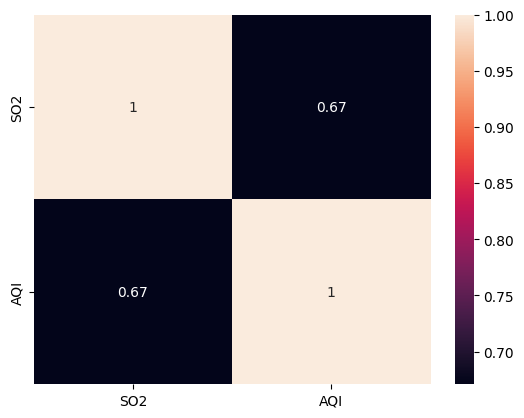

In [179]:
dataplot = sb.heatmap(fort_william_2022[['SO2','AQI']].corr(), annot=True)
plt.show()

The highest value of SO2 in the 365 days time period was  38.6  recorded on 2022-03-10 
and the lowest value was  2.59  recorded on 2022-04-19 
The average SO2 value was  9.54 
SO2 value had a standard deviation of  6.07 
In 2022 the number of days SO2 was responsible for the AQI value was:- 0 which is around 0.0%


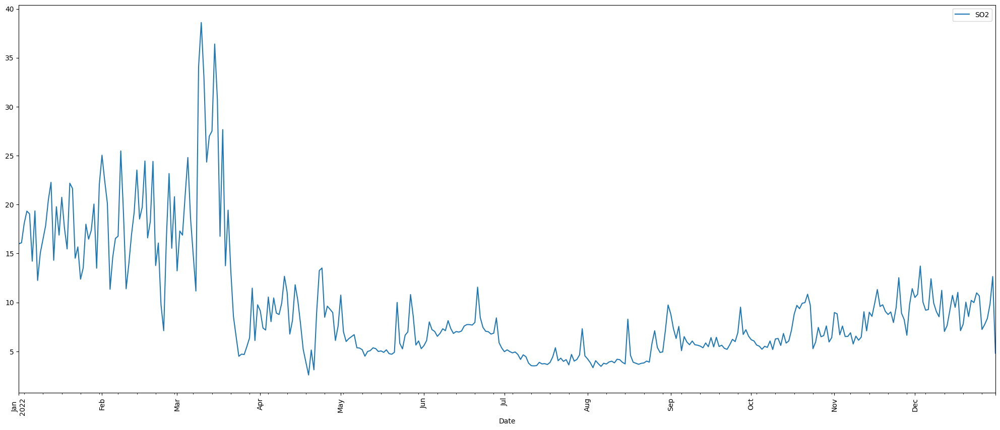

In [180]:
count = 0
for i in range(len(fort_william_2022)):
    if (SO2(fort_william_2022["SO2"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of SO2 in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["SO2"].loc[fort_william_2022['SO2'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['SO2'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["SO2"].loc[fort_william_2022['SO2'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['SO2'].idxmin()])[:10],
       "\nThe average SO2 value was ",str(round(fort_william_2022["SO2"].mean(),2)),
       "\nSO2 value had a standard deviation of ",str(round(fort_william_2022["SO2"].std(),2)),
       "\nIn 2022 the number of days SO2 was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='SO2',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

### Carbon Monoxide (CO)

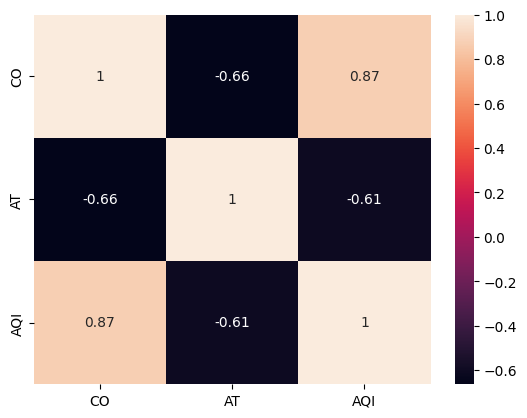

In [181]:
dataplot = sb.heatmap(fort_william[['CO','AT','AQI']].corr(), annot=True)
plt.show()

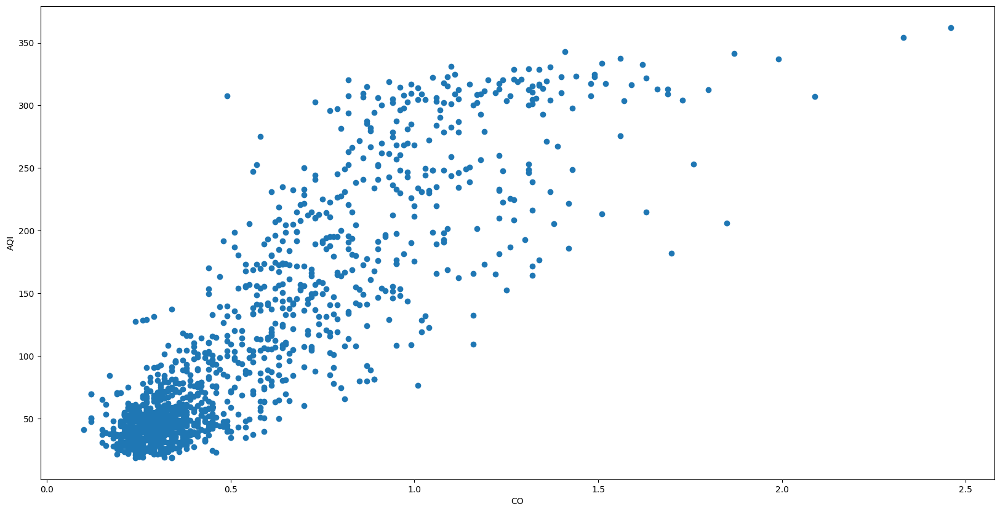

In [182]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william['CO'],y=fort_william['AQI'])
plt.xlabel("CO")
plt.ylabel("AQI")
plt.show()

The highest value of CO in the 1311 days time period was  2.46  recorded on 2020-01-15 
and the lowest value was  0.1  recorded on 2022-05-15 
The average CO value was  0.55 
CO value had a standard deviation of  0.35 .
The number of days CO was responsible for the AQI value was:- 1 which is around 0.08%


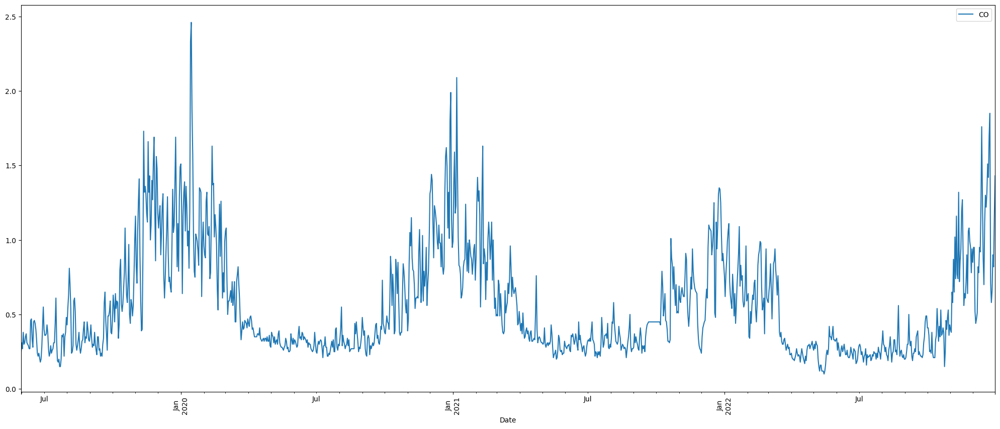

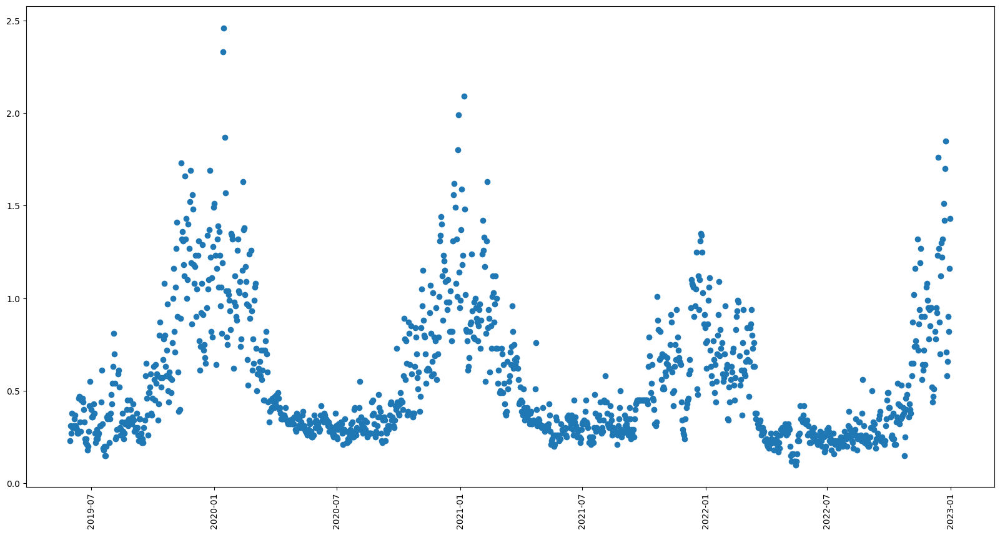

In [183]:
count = 0
for i in range(len(fort_william)):
    if (CO(fort_william["CO"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of CO in the "+str(len(fort_william))+
       " days time period was ",fort_william["CO"].loc[fort_william['CO'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['CO'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["CO"].loc[fort_william['CO'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['CO'].idxmin()])[:10],
       "\nThe average CO value was ",str(round(fort_william["CO"].mean(),2)),
       "\nCO value had a standard deviation of ",str(round(fort_william["CO"].std(),2)),
       '.\nThe number of days CO was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='CO',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['CO'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of CO

##### CO 2019

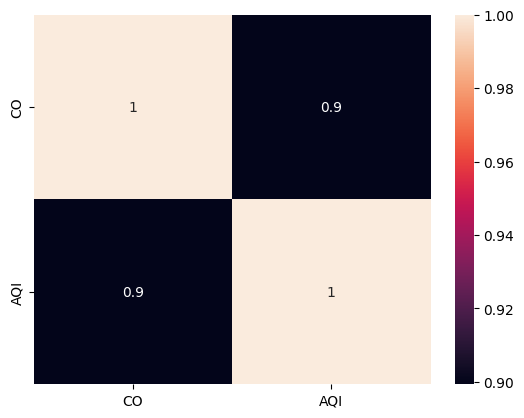

In [184]:
dataplot = sb.heatmap(fort_william_2019[['CO','AQI']].corr(), annot=True)
plt.show()

The highest value of CO in the 215 days time period was  1.73  recorded on 2019-11-12 
and the lowest value was  0.15  recorded on 2019-07-22 
The average CO value was  0.61 
CO value had a standard deviation of  0.39 
In 2019 the number of days CO was responsible for the AQI value was:- 0 which is around 0.0%


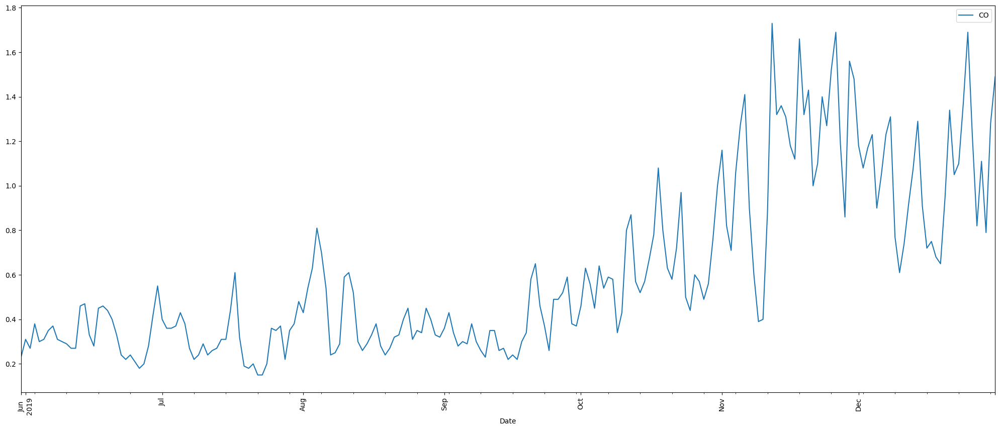

In [185]:
count = 0
for i in range(len(fort_william_2019)):
    if (CO(fort_william_2019["CO"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of CO in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["CO"].loc[fort_william_2019['CO'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['CO'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["CO"].loc[fort_william_2019['CO'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['CO'].idxmin()])[:10],
       "\nThe average CO value was ",str(round(fort_william_2019["CO"].mean(),2)),
       "\nCO value had a standard deviation of ",str(round(fort_william_2019["CO"].std(),2)),
       "\nIn 2019 the number of days CO was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2019.plot(x='Date',y='CO',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### CO 2020

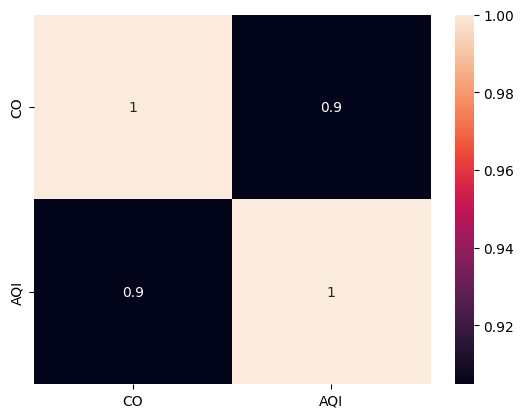

In [186]:
dataplot = sb.heatmap(fort_william_2020[['CO','AQI']].corr(), annot=True)
plt.show()

The highest value of CO in the 366 days time period was  2.46  recorded on 2020-01-15 
and the lowest value was  0.21  recorded on 2020-07-10 
The average CO value was  0.61 
CO value had a standard deviation of  0.39 
In 2020 the number of days CO was responsible for the AQI value was:- 0 which is around 0.0%


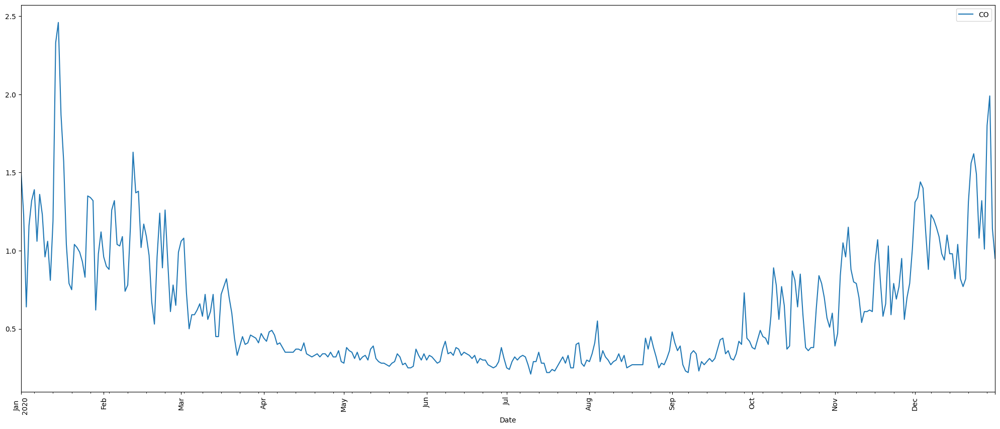

In [187]:
count = 0
for i in range(len(fort_william_2020)):
    if (CO(fort_william_2020["CO"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of CO in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["CO"].loc[fort_william_2020['CO'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['CO'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["CO"].loc[fort_william_2020['CO'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['CO'].idxmin()])[:10],
       "\nThe average CO value was ",str(round(fort_william_2020["CO"].mean(),2)),
       "\nCO value had a standard deviation of ",str(round(fort_william_2020["CO"].std(),2)),
       "\nIn 2020 the number of days CO was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='CO',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### CO 2021

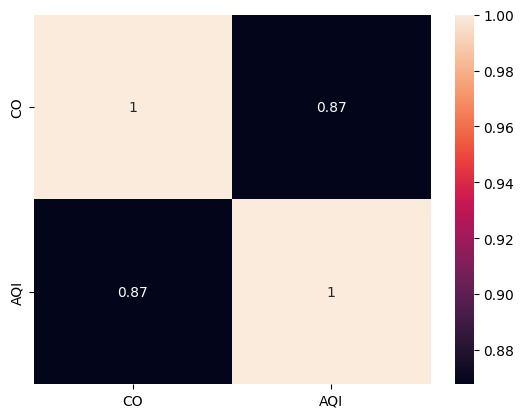

In [188]:
dataplot = sb.heatmap(fort_william_2021[['CO','AQI']].corr(), annot=True)
plt.show()

The highest value of CO in the 365 days time period was  2.09  recorded on 2021-01-06 
and the lowest value was  0.2  recorded on 2021-05-20 
The average CO value was  0.54 
CO value had a standard deviation of  0.31 
In 2021 the number of days CO was responsible for the AQI value was:- 1 which is around 0.27%


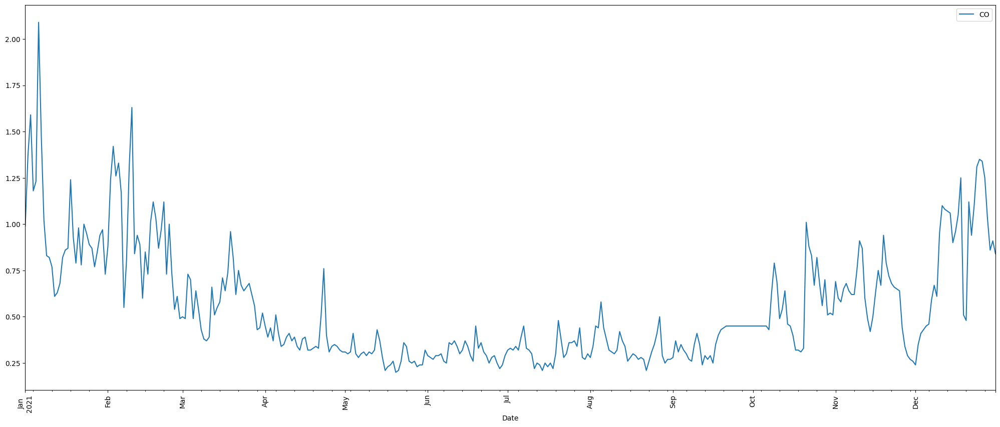

In [189]:
count = 0
for i in range(len(fort_william_2021)):
    if (CO(fort_william_2021["CO"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of CO in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["CO"].loc[fort_william_2021['CO'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['CO'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["CO"].loc[fort_william_2021['CO'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['CO'].idxmin()])[:10],
       "\nThe average CO value was ",str(round(fort_william_2021["CO"].mean(),2)),
       "\nCO value had a standard deviation of ",str(round(fort_william_2021["CO"].std(),2)),
       "\nIn 2021 the number of days CO was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='CO',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### CO 2022

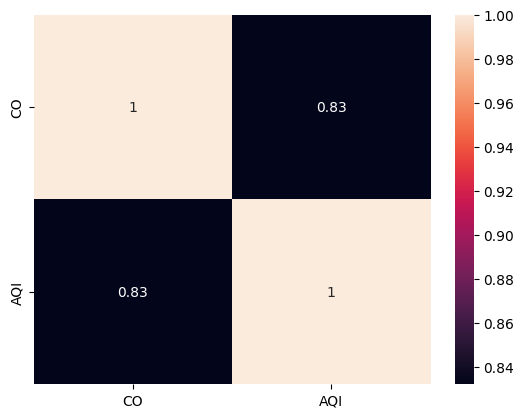

In [190]:
dataplot = sb.heatmap(fort_william_2022[['CO','AQI']].corr(), annot=True)
plt.show()

The highest value of CO in the 365 days time period was  1.85  recorded on 2022-12-24 
and the lowest value was  0.1  recorded on 2022-05-15 
The average CO value was  0.47 
CO value had a standard deviation of  0.31 
In 2022 the number of days CO was responsible for the AQI value was:- 0 which is around 0.0%


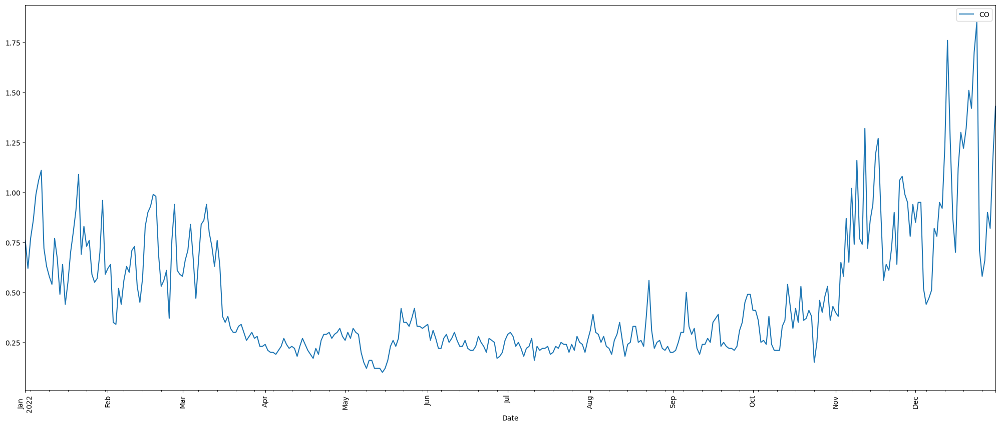

In [191]:
count = 0
for i in range(len(fort_william_2022)):
    if (CO(fort_william_2022["CO"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of CO in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["CO"].loc[fort_william_2022['CO'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['CO'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["CO"].loc[fort_william_2022['CO'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['CO'].idxmin()])[:10],
       "\nThe average CO value was ",str(round(fort_william_2022["CO"].mean(),2)),
       "\nCO value had a standard deviation of ",str(round(fort_william_2022["CO"].std(),2)),
       "\nIn 2022 the number of days CO was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='CO',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

### Ozone (O3)

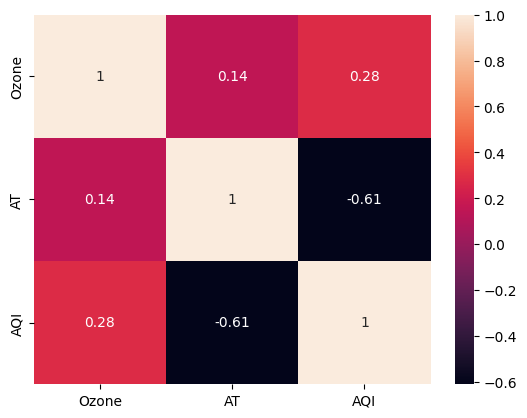

In [192]:
dataplot = sb.heatmap(fort_william[['Ozone','AT','AQI']].corr(), annot=True)
plt.show()

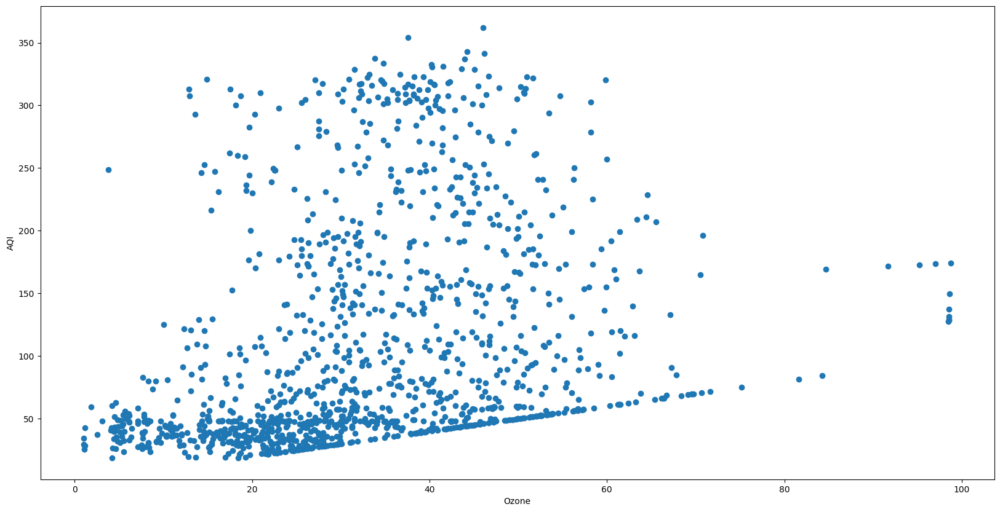

In [193]:
plt.figure(figsize=(20,10))
plt.scatter(x=fort_william['Ozone'],y=fort_william['AQI'])
plt.xlabel("Ozone")
plt.ylabel("AQI")
plt.show()

The highest value of Ozone in the 1311 days time period was  98.78  recorded on 2021-11-25 
and the lowest value was  1.02  recorded on 2020-09-14 
The average Ozone value was  33.48 
Ozone value had a standard deviation of  15.7 .
The number of days Ozone was responsible for the AQI value was:- 163 which is around 12.43%


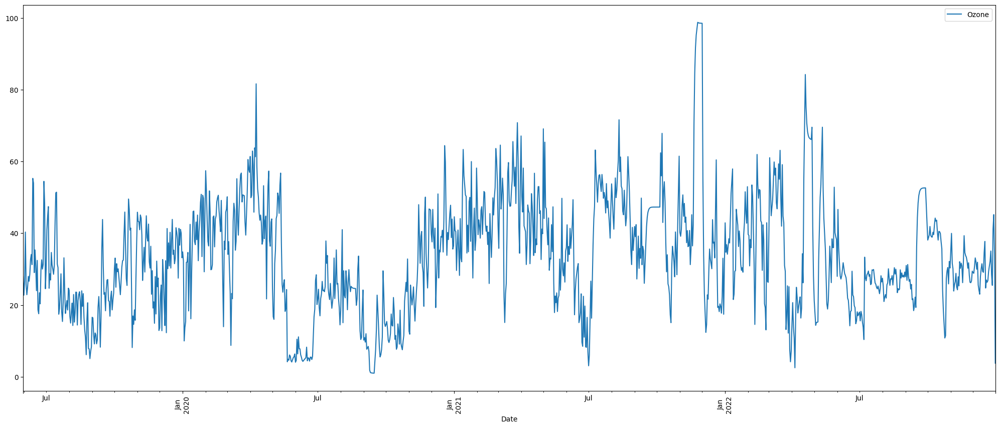

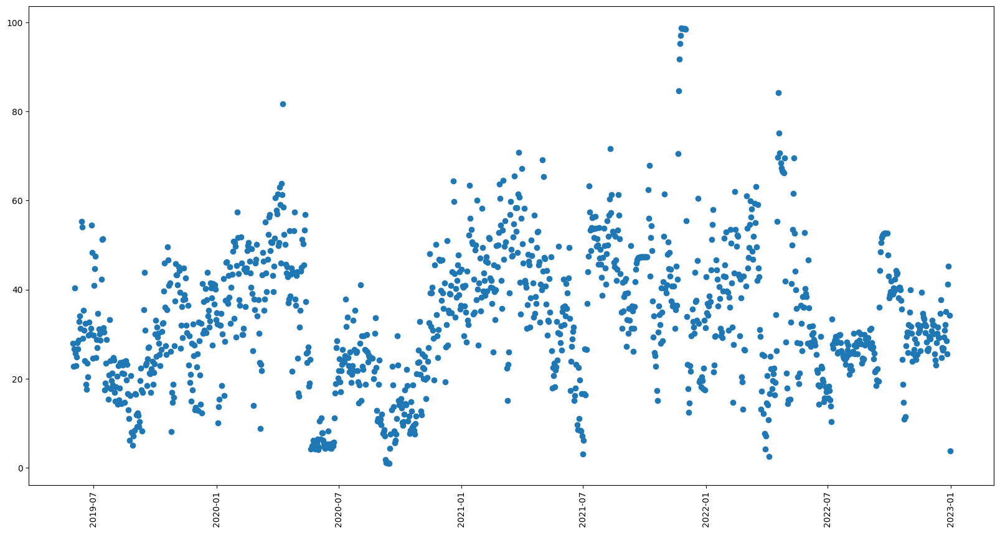

In [194]:
count = 0
for i in range(len(fort_william)):
    if (Ozone(fort_william["Ozone"][i]) == fort_william["AQI"][i]):
        count = count+1
percent = (count/len(fort_william))*100
print ("The highest value of Ozone in the "+str(len(fort_william))+
       " days time period was ",fort_william["Ozone"].loc[fort_william['Ozone'].idxmax()],
       " recorded on", str(fort_william["Date"].loc[fort_william['Ozone'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william["Ozone"].loc[fort_william['Ozone'].idxmin()], 
       " recorded on",str(fort_william["Date"].loc[fort_william['Ozone'].idxmin()])[:10],
       "\nThe average Ozone value was ",str(round(fort_william["Ozone"].mean(),2)),
       "\nOzone value had a standard deviation of ",str(round(fort_william["Ozone"].std(),2)),
       '.\nThe number of days Ozone was responsible for the AQI value was:- '+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william.plot(x='Date',y='Ozone',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)
plt.plot_date(fort_william['Date'],fort_william['Ozone'])
plt.xticks(rotation='vertical')
plt.show()

#### Sources of Ozone

##### Ozone 2019

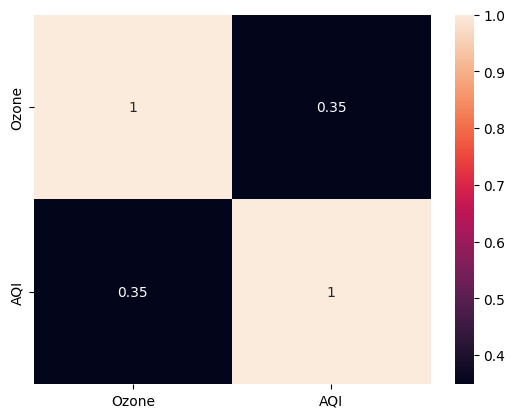

In [195]:
dataplot = sb.heatmap(fort_william_2019[['Ozone','AQI']].corr(), annot=True)
plt.show()

The highest value of Ozone in the 215 days time period was  55.31  recorded on 2019-06-13 
and the lowest value was  5.08  recorded on 2019-08-29 
The average Ozone value was  27.36 
Ozone value had a standard deviation of  10.63 
In 2019 the number of days Ozone was responsible for the AQI value was:- 5 which is around 2.33%


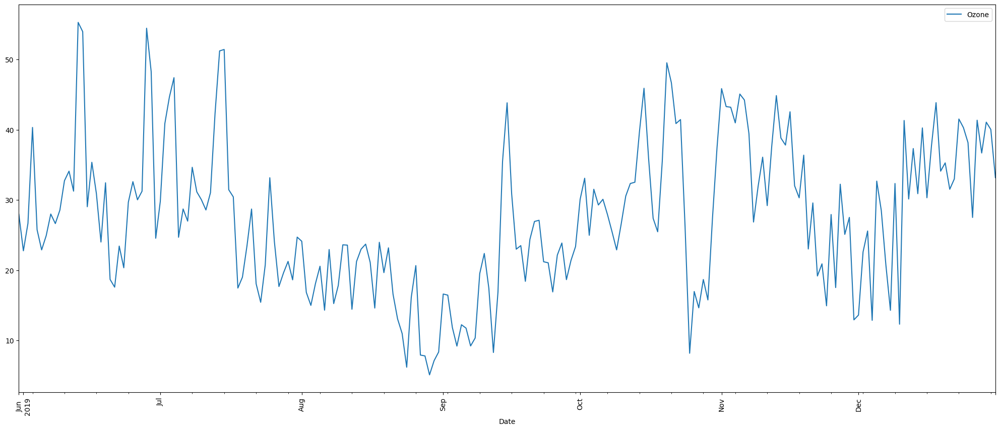

In [196]:
count = 0
for i in range(len(fort_william_2019)):
    if (Ozone(fort_william_2019["Ozone"][i]) == fort_william_2019["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2019))*100

print ("The highest value of Ozone in the "+str(len(fort_william_2019))+
       " days time period was ",fort_william_2019["Ozone"].loc[fort_william_2019['Ozone'].idxmax()],
       " recorded on", str(fort_william_2019["Date"].loc[fort_william_2019['Ozone'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2019["Ozone"].loc[fort_william_2019['Ozone'].idxmin()], 
       " recorded on",str(fort_william_2019["Date"].loc[fort_william_2019['Ozone'].idxmin()])[:10],
       "\nThe average Ozone value was ",str(round(fort_william_2019["Ozone"].mean(),2)),
       "\nOzone value had a standard deviation of ",str(round(fort_william_2019["Ozone"].std(),2)),
       "\nIn 2019 the number of days Ozone was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2019.plot(x='Date',y='Ozone',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### Ozone 2020

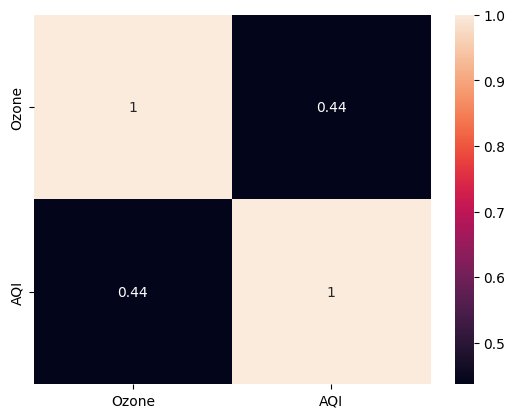

In [197]:
dataplot = sb.heatmap(fort_william_2020[['Ozone','AQI']].corr(), annot=True)
plt.show()

The highest value of Ozone in the 366 days time period was  81.65  recorded on 2020-04-09 
and the lowest value was  1.02  recorded on 2020-09-14 
The average Ozone value was  28.67 
Ozone value had a standard deviation of  16.19 
In 2020 the number of days Ozone was responsible for the AQI value was:- 43 which is around 11.75%


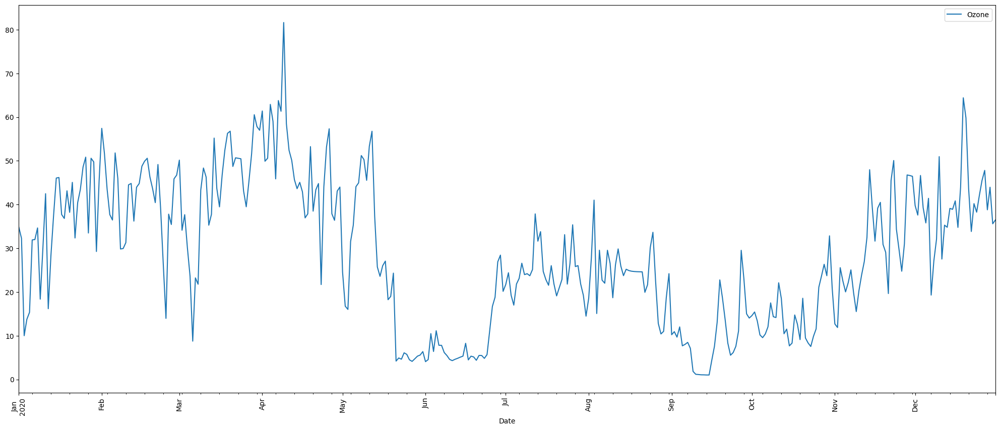

In [198]:
count = 0
for i in range(len(fort_william_2020)):
    if (Ozone(fort_william_2020["Ozone"][i]) == fort_william_2020["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2020))*100

print ("The highest value of Ozone in the "+str(len(fort_william_2020))+
       " days time period was ",fort_william_2020["Ozone"].loc[fort_william_2020['Ozone'].idxmax()],
       " recorded on", str(fort_william_2020["Date"].loc[fort_william_2020['Ozone'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2020["Ozone"].loc[fort_william_2020['Ozone'].idxmin()], 
       " recorded on",str(fort_william_2020["Date"].loc[fort_william_2020['Ozone'].idxmin()])[:10],
       "\nThe average Ozone value was ",str(round(fort_william_2020["Ozone"].mean(),2)),
       "\nOzone value had a standard deviation of ",str(round(fort_william_2020["Ozone"].std(),2)),
       "\nIn 2020 the number of days Ozone was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2020.plot(x='Date',y='Ozone',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### Ozone 2021

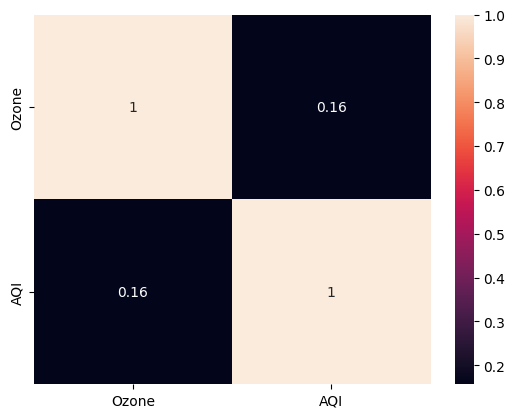

In [199]:
dataplot = sb.heatmap(fort_william_2021[['Ozone','AQI']].corr(), annot=True)
plt.show()

The highest value of Ozone in the 365 days time period was  98.78  recorded on 2021-11-25 
and the lowest value was  3.08  recorded on 2021-07-01 
The average Ozone value was  42.15 
Ozone value had a standard deviation of  16.03 
In 2021 the number of days Ozone was responsible for the AQI value was:- 50 which is around 13.7%


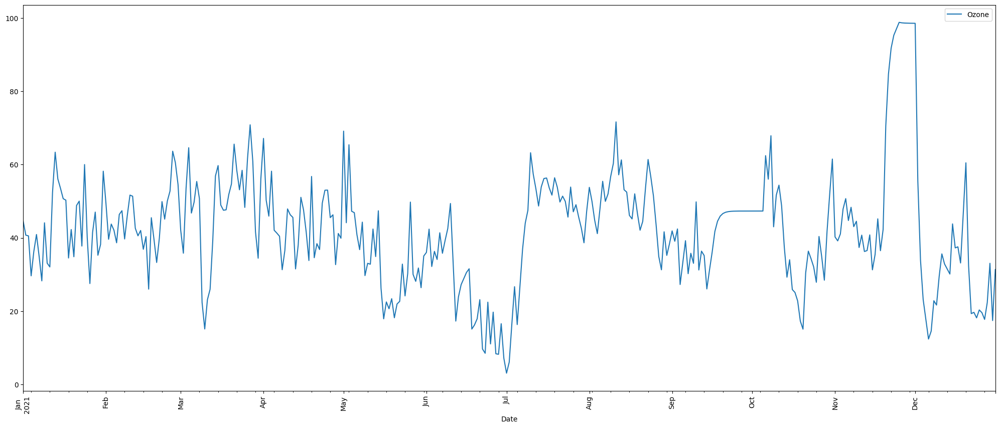

In [200]:
count = 0
for i in range(len(fort_william_2021)):
    if (Ozone(fort_william_2021["Ozone"][i]) == fort_william_2021["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2021))*100

print ("The highest value of Ozone in the "+str(len(fort_william_2021))+
       " days time period was ",fort_william_2021["Ozone"].loc[fort_william_2021['Ozone'].idxmax()],
       " recorded on", str(fort_william_2021["Date"].loc[fort_william_2021['Ozone'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2021["Ozone"].loc[fort_william_2021['Ozone'].idxmin()], 
       " recorded on",str(fort_william_2021["Date"].loc[fort_william_2021['Ozone'].idxmin()])[:10],
       "\nThe average Ozone value was ",str(round(fort_william_2021["Ozone"].mean(),2)),
       "\nOzone value had a standard deviation of ",str(round(fort_william_2021["Ozone"].std(),2)),
       "\nIn 2021 the number of days Ozone was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2021.plot(x='Date',y='Ozone',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()

##### Ozone 2022

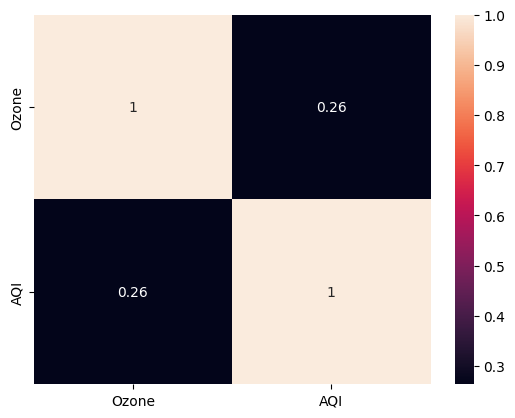

In [201]:
dataplot = sb.heatmap(fort_william_2022[['Ozone','AQI']].corr(), annot=True)
plt.show()

The highest value of Ozone in the 365 days time period was  84.25  recorded on 2022-04-19 
and the lowest value was  2.53  recorded on 2022-04-05 
The average Ozone value was  33.22 
Ozone value had a standard deviation of  13.43 
In 2022 the number of days Ozone was responsible for the AQI value was:- 65 which is around 17.81%


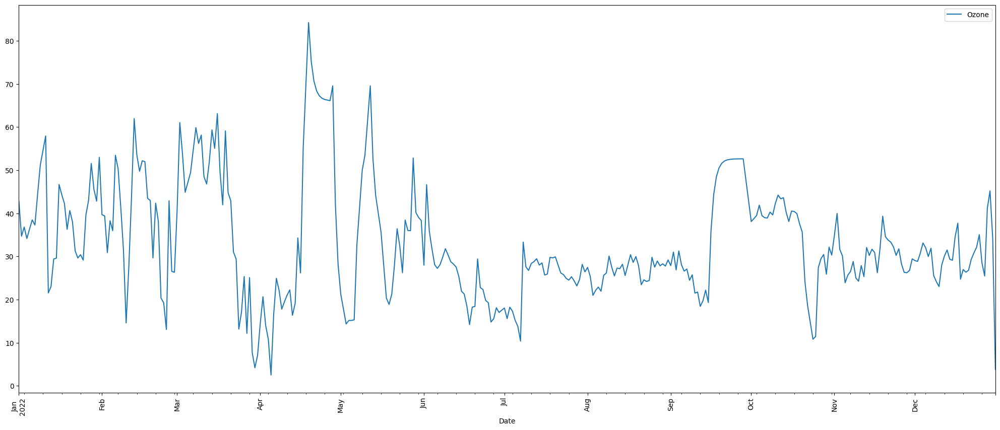

In [202]:
count = 0
for i in range(len(fort_william_2022)):
    if (Ozone(fort_william_2022["Ozone"][i]) == fort_william_2022["AQI"][i]):
        count = count+1
percent = (count/len(fort_william_2022))*100

print ("The highest value of Ozone in the "+str(len(fort_william_2022))+
       " days time period was ",fort_william_2022["Ozone"].loc[fort_william_2022['Ozone'].idxmax()],
       " recorded on", str(fort_william_2022["Date"].loc[fort_william_2022['Ozone'].idxmax()])[:10],
       '\nand the lowest value was ',fort_william_2022["Ozone"].loc[fort_william_2022['Ozone'].idxmin()], 
       " recorded on",str(fort_william_2022["Date"].loc[fort_william_2022['Ozone'].idxmin()])[:10],
       "\nThe average Ozone value was ",str(round(fort_william_2022["Ozone"].mean(),2)),
       "\nOzone value had a standard deviation of ",str(round(fort_william_2022["Ozone"].std(),2)),
       "\nIn 2022 the number of days Ozone was responsible for the AQI value was:- "+str(count)+
      " which is around "+str(round(percent,2))+"%")


a = fort_william_2022.plot(x='Date',y='Ozone',figsize=(25, 10))
plt.xticks(rotation='vertical')
plt.show()